In [2]:
import PeterChurchillFunctions as Function
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.special import erf
import statsmodels.api as sm
from scipy.odr import ODR, Model, RealData
from matplotlib.colors import LogNorm
from sklearn.cluster import KMeans
from scipy import optimize
import pylab as pl

In [3]:
NorPath = "/share/sabl0586/all_stations_NorESM_OsloAero_prcp2szdst_f19_f19_noresmv211_corr_ilevall_levs_4Peter.nc"
ds = xr.open_dataset(NorPath, chunks={})
stations = ds["station"].values
radii = np.logspace(0, 2.7, 61) #1 to 500 nm RADIUS
VarList = ['FREQL', 'Z3', 'WSUB']
x = xr.DataArray(np.logspace(-0.5,6, num=200), dims =['D'], coords= {'D':np.logspace(-0.5,6, num=200)})

In [4]:
def CCN_CDNC_Dataset(CCN_ds, CDNC_da):
    """
    Compute OLS slope/intercept between CCN(radius, lev, time)
    and CDNC(lev, time) across 'time'.
    """
    CCN_aligned, CDNC_aligned = xr.align(CCN_ds, CDNC_da)

   
    
    ds_out = xr.Dataset(
        data_vars={
            'CCN': CCN_aligned,       # dims: (radius, lev, time)
            'CDNC': CDNC_aligned      # dims: (lev, time)
        },
        coords={
            'radius': CCN_aligned.radius,
            'lev': CCN_aligned.lev,
            'time': CCN_aligned.time
        }
    )

    return ds_out

In [5]:
all_stationsCCN = []
all_stationsHeight = []
#CCN_all = xr.open_dataset('/share/pech2273/NorESM_CCN_CDNC.nc')
Downloaded = False
for station in stations:
    if Downloaded is False:
        
        Nor_ds = Function.NorESMExtract_Dask(NorPath, station, VarList, x, PNSD=False)
        CCN_ds = Function.NorERF(Nor_ds, radii)
        
        ## Mask when cloud coverage is above 80%
        Levels_CCN_ds = CCN_CDNC_Dataset(CCN_ds, Nor_ds['CDNC'].where(Nor_ds['FREQL']>0.8))
        all_stationsCCN.append(Levels_CCN_ds.assign_coords(station=station))


# Concatenate across stations
if Downloaded is False:
    CCN_all = xr.concat(all_stationsCCN, dim='station')



#Susceptibility_all = Susceptibility_all.compute()
CCN_all = CCN_all.compute()

/home/pech2273/.conda/envs/thesis_env/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [6]:
AitAcc_ds = Function.NorERF(ds,[10,50])
N100 = AitAcc_ds.sel(radius = 50) 
N20 = AitAcc_ds.sel(radius = 10) - AitAcc_ds.sel(radius = 50) 
TotalAitAccRatio = N20/N100
AitAccRatio2 = TotalAitAccRatio.compute().where(CCN_all.CDNC.isnull(), drop = True)
AitAccRatio = TotalAitAccRatio.compute().where(CCN_all.CDNC.notnull(), drop = True)


In [7]:
Updraft = ds.WSUB.compute()

In [8]:
print(f'Aitken to Accumulation Ratio 25th quantile: {TotalAitAccRatio.quantile(0.25).values:.2f}')
print(f'Aitken to Accumulation Ratio 75th quantile: {TotalAitAccRatio.quantile(0.75).values:.2f}')

Aitken to Accumulation Ratio 25th quantile: 1.43
Aitken to Accumulation Ratio 75th quantile: 4.04


In [9]:
print(f'Aitken to Accumulation Ratio (with CDNC) 25th quantile: {AitAccRatio.quantile(0.25).values:.2f}')
print(f'Aitken to Accumulation Ratio (with CDNC) 75th quantile: {AitAccRatio.quantile(0.75).values:.2f}')

Aitken to Accumulation Ratio (with CDNC) 25th quantile: 1.74
Aitken to Accumulation Ratio (with CDNC) 75th quantile: 5.35


In [10]:
print(f'Aitken to Accumulation Ratio (no CDNC) 25th quantile: {AitAccRatio2.quantile(0.25).values:.2f}')
print(f'Aitken to Accumulation Ratio (no CDNC) 75th quantile: {AitAccRatio2.quantile(0.75).values:.2f}')

Aitken to Accumulation Ratio (no CDNC) 25th quantile: 1.42
Aitken to Accumulation Ratio (no CDNC) 75th quantile: 3.99


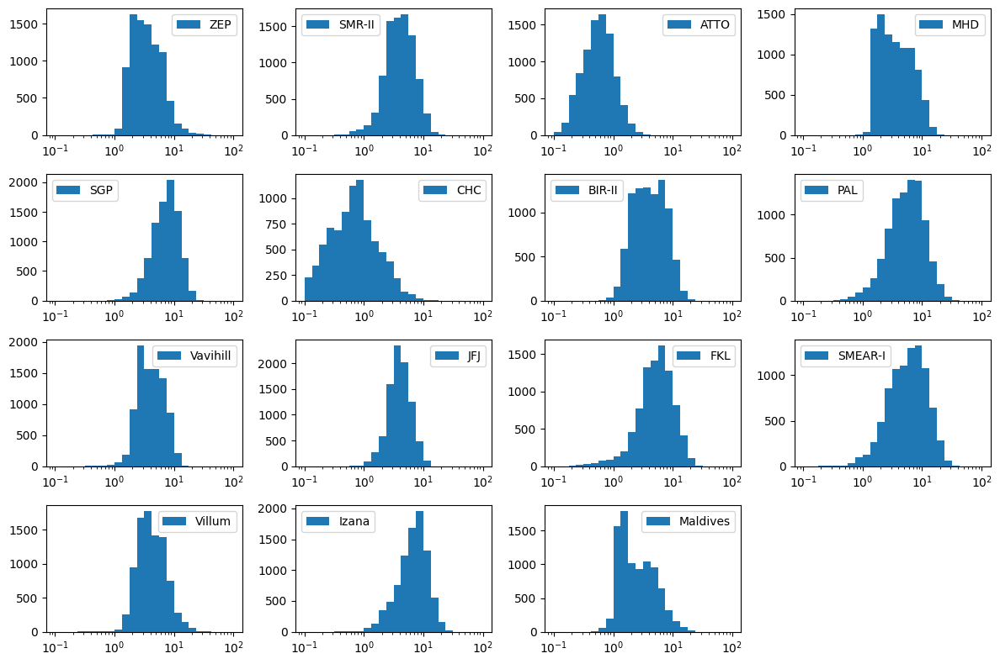

In [11]:
bins = np.logspace(-1,2, 25)
plt.figure(figsize= [12,8])
for x, station in enumerate(ds.station.values):
    plt.subplot(4,4,x+1)
    plt.hist(TotalAitAccRatio.sel(station = station).isel(lev = -1), bins = bins, label = station)
    plt.xscale('log')
    plt.legend()
plt.tight_layout()

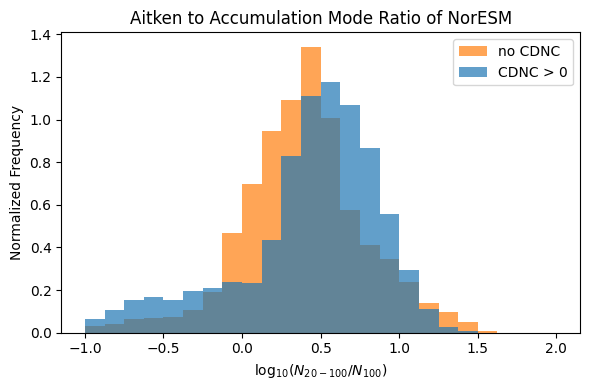

In [12]:
bins = np.linspace(-1, 2, 25)
plt.figure(figsize=[6, 4])
plt.hist(
    [np.log10(AitAccRatio.values.flatten()),np.log10(AitAccRatio2.values.flatten())], 
    density = True,
    bins = bins,
    stacked = False,
    histtype = 'stepfilled',
    alpha = 0.7,
    label=['CDNC > 0', 'no CDNC']
)
plt.ylabel('Normalized Frequency')
plt.xlabel('log$_{10}$($N_{20-100}/N_{100}$)')
plt.title('Aitken to Accumulation Mode Ratio of NorESM')
plt.legend()
plt.tight_layout()

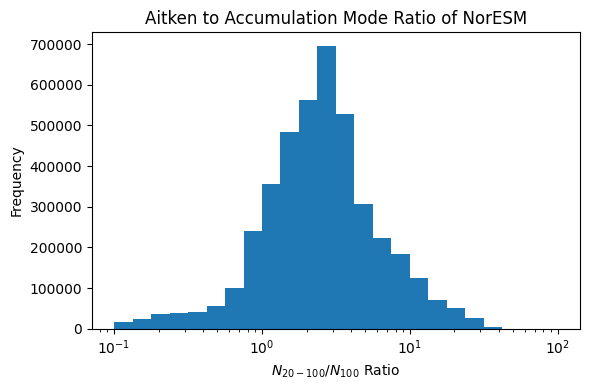

In [13]:
bins = np.logspace(-1, 2, 25)
plt.figure(figsize=[6, 4])
plt.hist(TotalAitAccRatio.values.flatten(), bins=bins)
plt.ylabel('Frequency')
plt.xlabel('$N_{20-100}/N_{100}$ Ratio')
plt.xscale('log')
plt.title('Aitken to Accumulation Mode Ratio of NorESM')
plt.tight_layout()

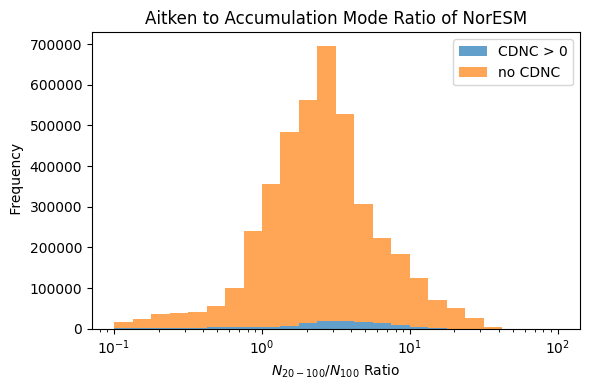

In [14]:
bins = np.logspace(-1, 2, 25)
plt.figure(figsize=[6, 4])
plt.hist(
    [AitAccRatio.values.flatten(), AitAccRatio2.values.flatten()], 
    density = False,
    bins=bins,
    stacked=False,
    histtype = 'barstacked',
    alpha = 0.7,
    label=['CDNC > 0', 'no CDNC']
)
plt.ylabel(' Frequency')
plt.xlabel('$N_{20-100}/N_{100}$ Ratio')
plt.xscale('log')
plt.title('Aitken to Accumulation Mode Ratio of NorESM')
plt.legend()
plt.tight_layout()

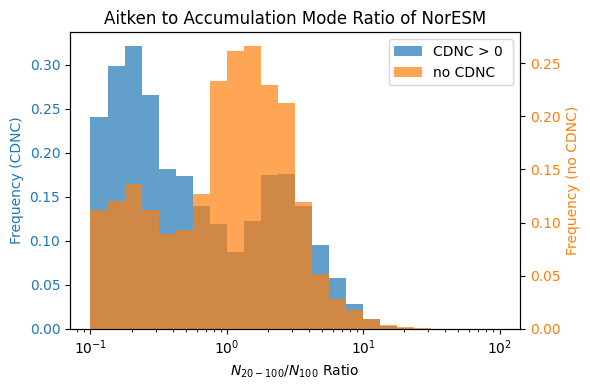

In [15]:
bins = np.logspace(-1, 2, 25)
fig, ax1 = plt.subplots(figsize=[6, 4])
ax2 = ax1.twinx()

ax1.hist(AitAccRatio.values.flatten(), bins=bins, alpha=0.7, color='C0', label='CDNC > 0 ', density = True)
ax2.hist(AitAccRatio2.values.flatten(), bins=bins, alpha=0.7, color='C1', label='no CDNC', density = True)

ax1.set_ylabel('Frequency (CDNC)', color='C0')
ax2.set_ylabel('Frequency (no CDNC)', color='C1')
ax1.tick_params(axis='y', labelcolor='C0')
ax2.tick_params(axis='y', labelcolor='C1')
ax1.set_xlabel('$N_{20-100}/N_{100}$ Ratio')
ax1.set_xscale('log')
plt.title('Aitken to Accumulation Mode Ratio of NorESM')
fig.legend(loc='upper right', bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
plt.tight_layout()

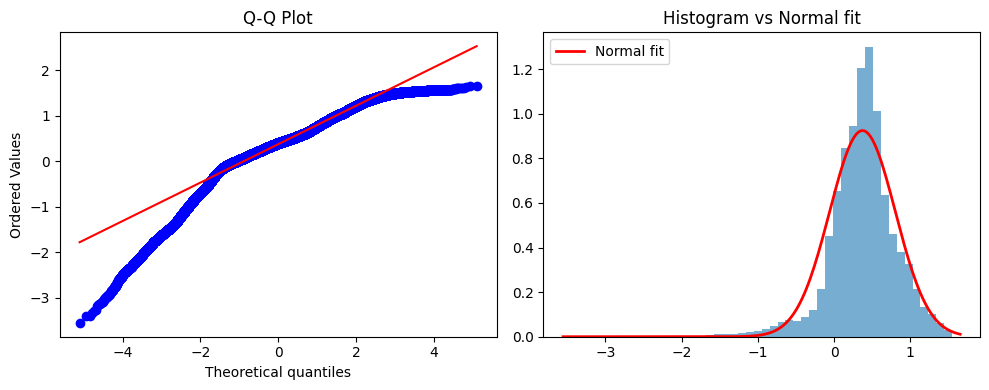

In [16]:
import scipy.stats as stats
## Total
data = np.log10(TotalAitAccRatio.values)
data = data[np.isfinite(data)]  # remove nan/inf

fig, axes = plt.subplots(1, 2, figsize=[10, 4])

# Q-Q plot
stats.probplot(data.flatten(), dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot')

# Histogram vs normal fit
axes[1].hist(data.flatten(), bins=50, density=True, alpha=0.6)
mu, std = stats.norm.fit(data.flatten())
x = np.linspace(data.min(), data.max(), 200)
axes[1].plot(x, stats.norm.pdf(x, mu, std), 'r-', lw=2, label='Normal fit')
axes[1].set_title('Histogram vs Normal fit')
axes[1].legend()
plt.tight_layout()

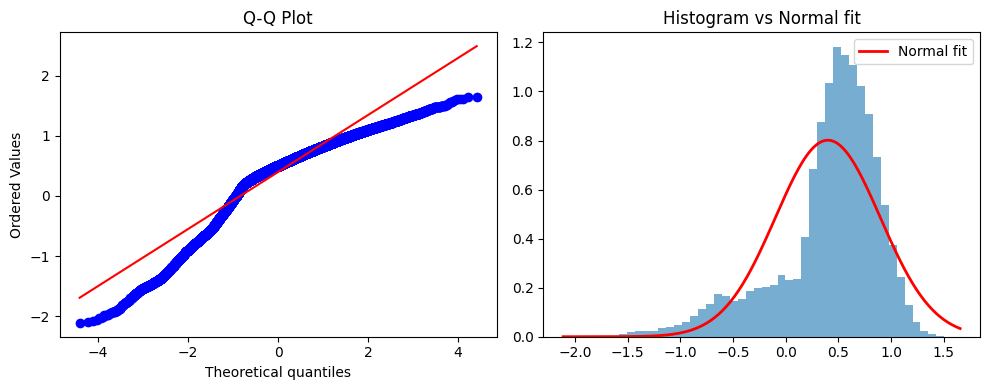

In [17]:
import scipy.stats as stats
## WITH CDNC
data = np.log10(AitAccRatio.values)
data = data[np.isfinite(data)]  # remove nan/inf

fig, axes = plt.subplots(1, 2, figsize=[10, 4])

# Q-Q plot
stats.probplot(data.flatten(), dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot')

# Histogram vs normal fit
axes[1].hist(data.flatten(), bins=50, density=True, alpha=0.6)
mu, std = stats.norm.fit(data.flatten())
x = np.linspace(data.min(), data.max(), 200)
axes[1].plot(x, stats.norm.pdf(x, mu, std), 'r-', lw=2, label='Normal fit')
axes[1].set_title('Histogram vs Normal fit')
axes[1].legend()
plt.tight_layout()

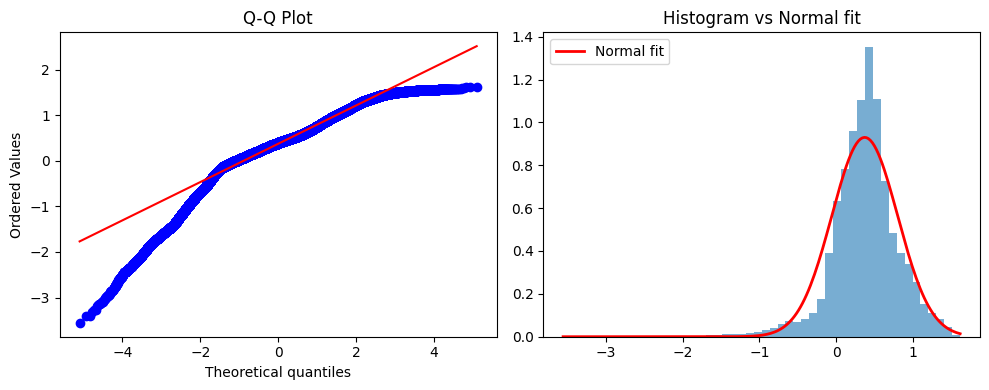

In [18]:
import scipy.stats as stats

##Without CDNC
data = np.log10(AitAccRatio2.values)
data = data[np.isfinite(data)]  # remove nan/inf

fig, axes = plt.subplots(1, 2, figsize=[10, 4])

# Q-Q plot
stats.probplot(data.flatten(), dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot')

# Histogram vs normal fit
axes[1].hist(data.flatten(), bins=50, density=True, alpha=0.6)
mu, std = stats.norm.fit(data.flatten())
x = np.linspace(data.min(), data.max(), 200)
axes[1].plot(x, stats.norm.pdf(x, mu, std), 'r-', lw=2, label='Normal fit')
axes[1].set_title('Histogram vs Normal fit')
axes[1].legend()
plt.tight_layout()

In [19]:
mask = (AitAccRatio <= AitAccRatio.quantile(0.25)).compute().reset_coords("radius", drop=True)
BigAcc = CCN_all.where(mask, drop=True)

mask = (AitAccRatio >= AitAccRatio.quantile(0.75)).compute().reset_coords("radius", drop=True)
BigAit = CCN_all.where(mask, drop=True)

In [20]:
# define dims to collapse (everything except station)
dims = [d for d in AitAccRatio.dims if d != "station"]

# --- lower quartile per station ---
q25 = AitAccRatio.quantile(0.25, dim=dims)

mask_low = (AitAccRatio <= q25)

BigAcc = CCN_all.where(mask_low)

# --- upper quartile per station ---
q75 = AitAccRatio.quantile(0.75, dim=dims)

mask_high = (AitAccRatio >= q75)

BigAit = CCN_all.where(mask_high)

In [21]:
BigAcc = BigAcc.where(BigAcc.CDNC.notnull(), drop = True)
BigAit = BigAit.where(BigAit.CDNC.notnull(), drop = True)

In [22]:
ds

<xarray.Dataset> Size: 2GB
Dimensions:             (time: 8761, station: 15, lev: 32, ilev: 33)
Coordinates:
  * time                (time) datetime64[ns] 70kB 2012-01-02 ... 2015-01-01
  * station             (station) <U8 480B 'ZEP' 'SMR-II' ... 'Izana' 'Maldives'
  * lev                 (lev) float64 256B 3.643 7.595 14.36 ... 976.3 992.6
  * ilev                (ilev) float64 264B 2.255 5.032 10.16 ... 985.1 1e+03
Data variables: (12/275)
    ABSVIS              (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    ACTNI               (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    ACTNL               (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    ACTREI              (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    ACTREL              (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    AOD_VIS             (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    ...                  ...
    isoprene            (station, time, lev) float32 17MB dask.array<chunksize=(15, 8761, 32), meta=np.ndarray>
    monoterp            (station, time, lev) float32 17MB dask.array<chunksize=(15, 8761, 32), meta=np.ndarray>
    TOT_ICLD_VISTAU_s   (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    TOT_CLD_VISTAU_s    (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    optical_depth       (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>
    transmittance       (station, time) float32 526kB dask.array<chunksize=(15, 8761), meta=np.ndarray>

In [23]:
CDNC_b, CCN_b, WSUB_b = xr.broadcast(BigAcc.CDNC, BigAcc.CCN, ds.WSUB)
Pairs_acc = xr.Dataset({
    "CDNC": CDNC_b,
    "CCN": CCN_b,
    "Updraft": WSUB_b
}).stack(sample=("station", "time", "lev"))
Pairs_acc = Pairs_acc.where(Pairs_acc.CDNC.notnull(), drop=True)
Pairs_acc['CDNC'] = Pairs_acc['CDNC'].isel(radius = 0)
Pairs_acc['Updraft'] = Pairs_acc['Updraft'].isel(radius = 0)

In [24]:
CDNC_b, CCN_b, WSUB_b = xr.broadcast(BigAit.CDNC, BigAit.CCN, ds.WSUB)
Pairs_ait = xr.Dataset({
    "CDNC": CDNC_b,
    "CCN": CCN_b,
    "Updraft": WSUB_b
}).stack(sample=("station", "time", "lev"))
Pairs_ait = Pairs_ait.where(Pairs_ait.CDNC.notnull(), drop=True)
Pairs_ait['CDNC'] = Pairs_ait['CDNC'].isel(radius = 0)
Pairs_ait['Updraft'] = Pairs_ait['Updraft'].isel(radius = 0)

In [24]:
print(len(Pairs_acc['sample']))
print(len(Pairs_ait['sample']))


33744
33744


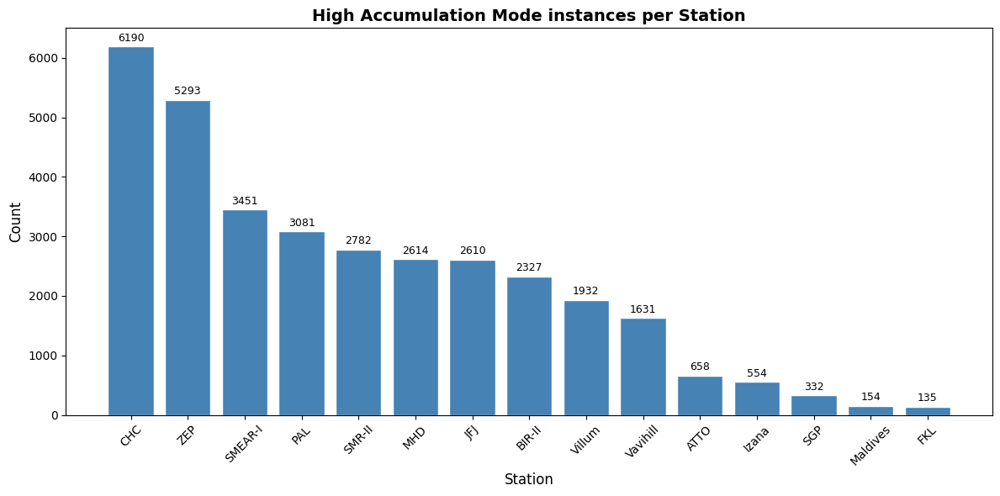

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

# Count occurrences of each station
station_counts = pd.Series(Pairs_acc.station.values).value_counts()

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(station_counts.index, station_counts.values, color='steelblue', edgecolor='white')

# Add count labels on top of each bar
for bar, count in zip(bars, station_counts.values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
            str(count), ha='center', va='bottom', fontsize=9)

ax.set_title('High Accumulation Mode instances per Station', fontsize=14, fontweight='bold')
ax.set_xlabel('Station', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

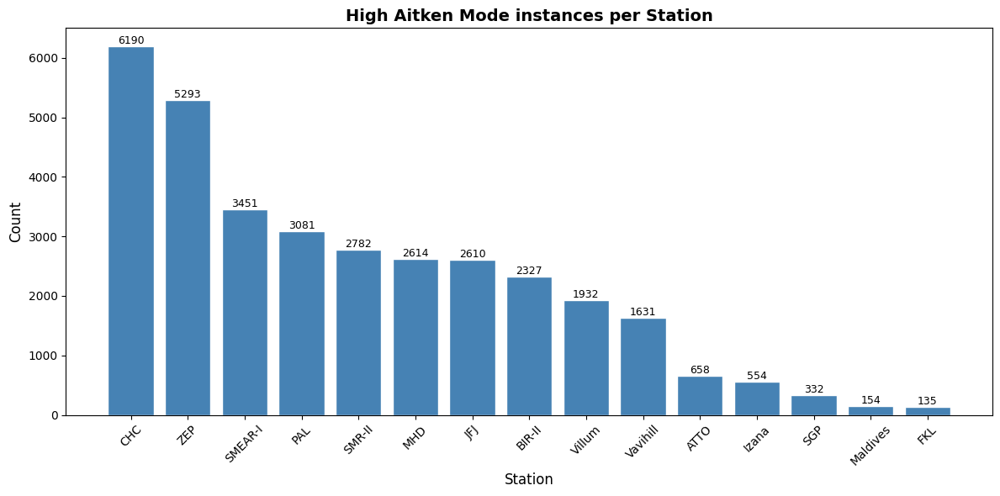

In [26]:
import matplotlib.pyplot as plt
import pandas as pd

# Count occurrences of each station
station_counts = pd.Series(Pairs_ait.station.values).value_counts()

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(station_counts.index, station_counts.values, color='steelblue', edgecolor='white')

# Add count labels on top of each bar
for bar, count in zip(bars, station_counts.values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            str(count), ha='center', va='bottom', fontsize=9)

ax.set_title('High Aitken Mode instances per Station', fontsize=14, fontweight='bold')
ax.set_xlabel('Station', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [27]:
def build_susceptibility_dataset(
    pairs_ds,
    radii,
    n_bins=100,
    min_bin_points=20,
    updraft_var="Updraft",
    ccn_var="CCN",
    cdnc_var="CDNC",
    sample_dim="sample",
    output_name=None,
):
    import numpy as np
    import xarray as xr
    from scipy import stats

    wsub = pairs_ds[updraft_var]

    # --- Define quartiles ---
    q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, 0.90, 1.0])
    quartile_bins   = [q0, q75, q90, q100]
    quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100', 'Total']

    # --- Create output dataset ---
    ds_out = xr.Dataset(
        data_vars={
            "slope":     (["radius", "updraft_q"], np.full((len(radii), len(quartile_labels)), np.nan)),
            "r_value":   (["radius", "updraft_q"], np.full((len(radii), len(quartile_labels)), np.nan)),
            "std_err":   (["radius", "updraft_q"], np.full((len(radii), len(quartile_labels)), np.nan)),
            "intercept": (["radius", "updraft_q"], np.full((len(radii), len(quartile_labels)), np.nan)),
        },
        coords={"radius": radii, "updraft_q": quartile_labels}
    )

    # --- Loop over radii ---
    for r_idx, r_val in enumerate(radii):

        CCN_slice  = pairs_ds[ccn_var].isel(radius=r_idx)
        CDNC_slice = pairs_ds[cdnc_var]

        ranges = list(zip(quartile_bins[:-1], quartile_bins[1:])) + [(q0, q100)]

        for q_label, (lo, hi) in zip(quartile_labels, ranges):

            # --- Mask by updraft ---
            mask = (wsub >= lo) & (wsub <= hi)

            CCN_q  = CCN_slice.where(mask)
            CDNC_q = CDNC_slice.where(mask)

            # --- Convert to log space ---
            log_CCN  = np.log10(CCN_q)
            log_CDNC = np.log10(CDNC_q)

            # --- Drop NaNs ---
            lx = log_CCN.values
            ly = log_CDNC.values
            
            valid = np.isfinite(lx) & np.isfinite(ly)
            
            lx = lx[valid]
            ly = ly[valid]

            if lx.size < 2:
                continue

            # --- Define bins in log space ---
            try:
                bins = np.linspace(np.nanmin(lx), np.nanmax(lx), n_bins + 1)
            except ValueError:
                continue

            # --- Digitize ---
            bin_idx = np.digitize(lx, bins)

            lx_mean = []
            ly_mean = []

            for b in range(1, len(bins)):
                mask_bin = bin_idx == b
                if np.any(mask_bin):
                    lx_mean.append(lx[mask_bin].mean())
                    ly_mean.append(ly[mask_bin].mean())

            lx_mean = np.array(lx_mean)
            ly_mean = np.array(ly_mean)

            # --- Final filtering ---
            finite = np.isfinite(lx_mean) & np.isfinite(ly_mean)

            if finite.sum() < min_bin_points:
                continue

            # --- Regression ---
            slope, intercept, r_value, p_value, std_err = stats.linregress(
                lx_mean[finite], ly_mean[finite]
            )

            # --- Store ---
            ds_out["slope"].loc[{"radius": r_val, "updraft_q": q_label}] = slope
            ds_out["r_value"].loc[{"radius": r_val, "updraft_q": q_label}] = r_value
            ds_out["std_err"].loc[{"radius": r_val, "updraft_q": q_label}] = std_err
            ds_out["intercept"].loc[{"radius": r_val, "updraft_q": q_label}] = intercept

    if output_name is not None:
        ds_out.attrs["name"] = output_name

    return ds_out

In [28]:
BigAitReg_ds = build_susceptibility_dataset(
    pairs_ds=Pairs_ait,
    radii=radii,
    output_name="BigAitReg"
)

In [29]:
BigAccReg_ds = build_susceptibility_dataset(
    pairs_ds=Pairs_acc,
    radii=radii,
    output_name="BigAccReg"
)

In [30]:
ratio_noCHC = AitAccRatio.where(AitAccRatio.station != 'CHC', drop=True)

mask = (ratio_noCHC <= ratio_noCHC.quantile(0.25)).compute()
BigAcc_noCHC = CCN_all.where(mask)  # drop=True removed

mask = (ratio_noCHC >= ratio_noCHC.quantile(0.75)).compute()
BigAit_noCHC = CCN_all.where(mask)  # drop=True removed

# --- Stack accumulation-mode pairs ---
CDNC_b, CCN_b, WSUB_b = xr.broadcast(BigAcc_noCHC.CDNC, BigAcc_noCHC.CCN, ds.WSUB)
Pairs_acc_noCHC = xr.Dataset({
    "CDNC": CDNC_b,
    "CCN": CCN_b,
    "Updraft": WSUB_b
}).stack(sample=("station", "time", "lev"))
Pairs_acc_noCHC = Pairs_acc_noCHC.where(Pairs_acc_noCHC.CDNC.notnull(), drop=True)
Pairs_acc_noCHC['CDNC'] = Pairs_acc_noCHC['CDNC'].isel(radius=0)
Pairs_acc_noCHC['Updraft'] = Pairs_acc_noCHC['Updraft'].isel(radius=0)


# --- Stack Aitken-mode pairs ---
CDNC_b, CCN_b, WSUB_b = xr.broadcast(BigAit_noCHC.CDNC, BigAit_noCHC.CCN, ds.WSUB)
Pairs_ait_noCHC = xr.Dataset({
    "CDNC": CDNC_b,
    "CCN": CCN_b,
    "Updraft": WSUB_b
}).stack(sample=("station", "time", "lev"))
Pairs_ait_noCHC = Pairs_ait_noCHC.where(Pairs_ait_noCHC.CDNC.notnull(), drop=True)
Pairs_ait_noCHC['CDNC'] = Pairs_ait_noCHC['CDNC'].isel(radius=0)
Pairs_ait_noCHC['Updraft'] = Pairs_ait_noCHC['Updraft'].isel(radius=0)


In [31]:
BigAccReg_noCHC_ds = build_susceptibility_dataset(
    pairs_ds=Pairs_acc_noCHC,
    radii=radii,
    output_name="BigAccReg_noCHC"
)

In [32]:
BigAitReg_noCHC_ds = build_susceptibility_dataset(
    pairs_ds=Pairs_ait_noCHC,
    radii=radii,
    output_name="BigAitReg_noCHC"
)

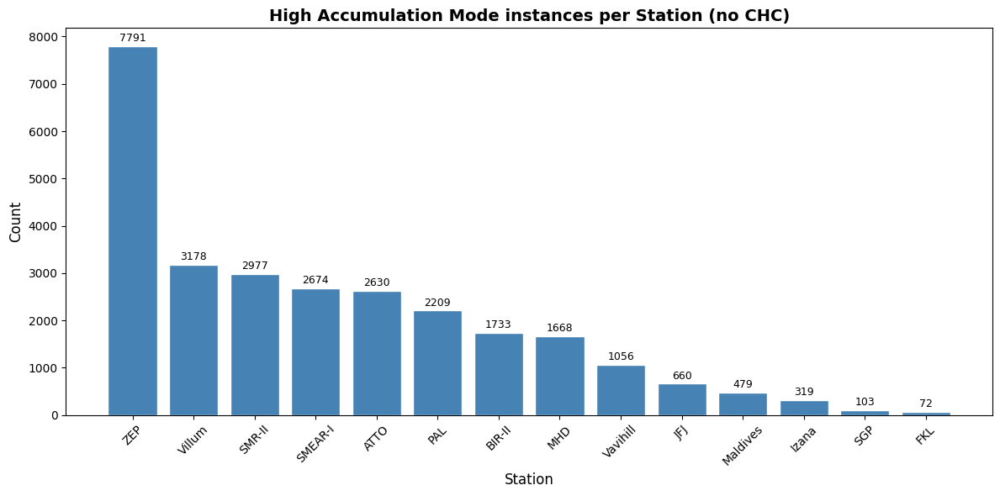

In [33]:
import pandas as pd

# Count occurrences of each station
station_counts = pd.Series(Pairs_acc_noCHC.station.values).value_counts()

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(station_counts.index, station_counts.values, color='steelblue', edgecolor='white')

# Add count labels on top of each bar
for bar, count in zip(bars, station_counts.values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
            str(count), ha='center', va='bottom', fontsize=9)

ax.set_title('High Accumulation Mode instances per Station (no CHC)', fontsize=14, fontweight='bold')
ax.set_xlabel('Station', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

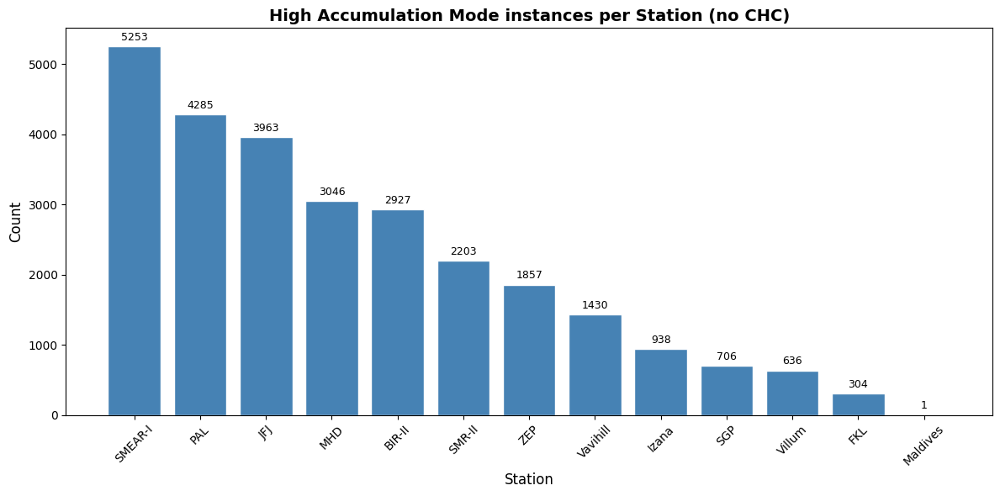

In [34]:
import pandas as pd

# Count occurrences of each station
station_counts = pd.Series(Pairs_ait_noCHC.station.values).value_counts()

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(station_counts.index, station_counts.values, color='steelblue', edgecolor='white')

# Add count labels on top of each bar
for bar, count in zip(bars, station_counts.values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
            str(count), ha='center', va='bottom', fontsize=9)

ax.set_title('High Accumulation Mode instances per Station (no CHC)', fontsize=14, fontweight='bold')
ax.set_xlabel('Station', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [35]:
import warnings
import numpy as np
import pandas as pd
from scipy import stats

acc_count = pd.Series(Pairs_acc.lev.values).value_counts().sort_index()
all_levels = acc_count.index

BigAccReg_lev_ds = xr.Dataset(
    data_vars={
        "slope":     (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "r_value":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "std_err":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "intercept": (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
    },
    coords={
        "radius": radii,
        "lev": all_levels,
    }
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", RuntimeWarning)

    for level in all_levels:
        for r in range(len(radii)):

            # --- Extract data ---
            CCN = Pairs_acc.CCN.sel(lev=level).isel(radius=r).values
            CDNC = Pairs_acc.CDNC.sel(lev=level).values

            # --- Remove invalid BEFORE log ---
            valid = (CCN > 0) & (CDNC > 0) & np.isfinite(CCN) & np.isfinite(CDNC)
            CCN = CCN[valid]
            CDNC = CDNC[valid]

            if CCN.size < 10:
                continue

            # --- Log transform ---
            lx = np.log10(CCN)
            ly = np.log10(CDNC)

            # --- Define bins in log space ---
            try:
                bins = np.linspace(np.nanmin(lx), np.nanmax(lx), 101)
            except ValueError:
                continue

            bin_idx = np.digitize(lx, bins)

            lx_mean = []
            ly_mean = []

            for b in range(1, len(bins)):
                mask_bin = bin_idx == b
                if np.any(mask_bin):
                    lx_mean.append(lx[mask_bin].mean())
                    ly_mean.append(ly[mask_bin].mean())

            lx_mean = np.array(lx_mean)
            ly_mean = np.array(ly_mean)

            # --- Final filtering ---
            valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)

            if valid_bins.sum() < 4:
                continue

            # --- Regression ---
            slope, intercept, r_value, p_value, std_err = stats.linregress(
                lx_mean[valid_bins], ly_mean[valid_bins]
            )

            loc = {"radius": radii[r], "lev": level}
            BigAccReg_lev_ds["slope"].loc[loc]      = slope
            BigAccReg_lev_ds["r_value"].loc[loc]    = r_value
            BigAccReg_lev_ds["std_err"].loc[loc]    = std_err
            BigAccReg_lev_ds["intercept"].loc[loc]  = intercept


In [36]:
acc_count = pd.Series(Pairs_acc.lev.values).value_counts().sort_index()
ait_count = pd.Series(Pairs_ait.lev.values).value_counts().sort_index()
all_levels = ait_count.index.union(acc_count.index)
all_levels

Index([379.10090386867523,   445.992574095726,  524.6871747076511,
        609.7786948084831,  691.3894303143024,   763.404481112957,
        820.8583686500788,  859.5347665250301,  887.0202489197254,
         912.644546944648,  936.1983984708786,   957.485479535535,
         976.325407391414,   992.556095123291],
      dtype='float64')

In [37]:
acc_count.index

Index([379.10090386867523,   445.992574095726,  524.6871747076511,
        609.7786948084831,  691.3894303143024,   763.404481112957,
        820.8583686500788,  859.5347665250301,  887.0202489197254,
         912.644546944648,  936.1983984708786,   957.485479535535,
         976.325407391414,   992.556095123291],
      dtype='float64')

In [38]:
import warnings
import numpy as np
import pandas as pd
from scipy import stats

acc_count = pd.Series(Pairs_acc.lev.values).value_counts().sort_index()
ait_count = pd.Series(Pairs_ait.lev.values).value_counts().sort_index()
all_levels = ait_count.index

BigAitReg_lev_ds = xr.Dataset(
    data_vars={
        "slope":     (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "r_value":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "std_err":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "intercept": (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
    },
    coords={
        "radius": radii,
        "lev": all_levels,
    }
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", RuntimeWarning)

    for level in all_levels:
        for r in range(len(radii)):

            # --- Extract data ---
            CCN = Pairs_ait.CCN.sel(lev=level).isel(radius=r).values
            CDNC = Pairs_ait.CDNC.sel(lev=level).values

            # --- Remove invalid BEFORE log ---
            valid = (CCN > 0) & (CDNC > 0) & np.isfinite(CCN) & np.isfinite(CDNC)
            CCN = CCN[valid]
            CDNC = CDNC[valid]

            if CCN.size < 10:
                continue

            # --- Log transform ---
            lx = np.log10(CCN)
            ly = np.log10(CDNC)

            # --- Define bins in log space ---
            try:
                bins = np.linspace(np.nanmin(lx), np.nanmax(lx), 101)
            except ValueError:
                continue

            bin_idx = np.digitize(lx, bins)

            lx_mean = []
            ly_mean = []

            for b in range(1, len(bins)):
                mask_bin = bin_idx == b
                if np.any(mask_bin):
                    lx_mean.append(lx[mask_bin].mean())
                    ly_mean.append(ly[mask_bin].mean())

            lx_mean = np.array(lx_mean)
            ly_mean = np.array(ly_mean)

            # --- Final filtering ---
            valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)

            if valid_bins.sum() < 4:
                continue

            # --- Regression ---
            slope, intercept, r_value, p_value, std_err = stats.linregress(
                lx_mean[valid_bins], ly_mean[valid_bins]
            )

            loc = {"radius": radii[r], "lev": level}
            BigAitReg_lev_ds["slope"].loc[loc]      = slope
            BigAitReg_lev_ds["r_value"].loc[loc]    = r_value
            BigAitReg_lev_ds["std_err"].loc[loc]    = std_err
            BigAitReg_lev_ds["intercept"].loc[loc]  = intercept


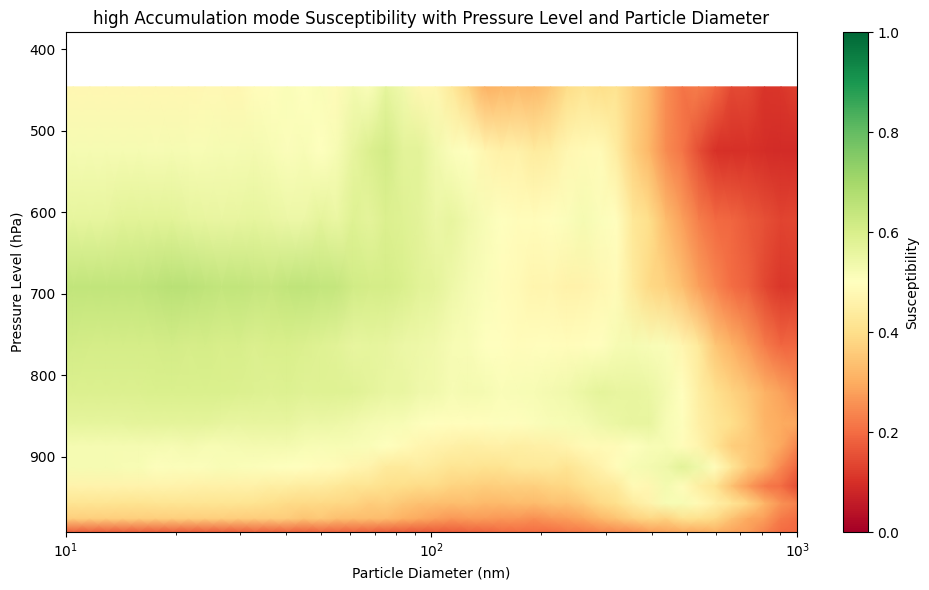

In [39]:
fig, ax = plt.subplots(figsize=(10, 6))

mesh = ax.pcolormesh(
    BigAccReg_lev_ds['radius'] * 2,
    BigAccReg_lev_ds['lev'],
    BigAccReg_lev_ds['slope'].T,
    shading='gouraud',
    vmin=0,
    vmax=1,
    cmap='RdYlGn'
)
ax.set_xscale('log')
ax.set_xlim(10,1000)
ax.invert_yaxis()
ax.set_xlabel('Particle Diameter (nm)')
ax.set_ylabel('Pressure Level (hPa)')
ax.set_title('high Accumulation mode Susceptibility with Pressure Level and Particle Diameter')

plt.colorbar(mesh, ax=ax, label='Susceptibility')
plt.tight_layout()
plt.show()

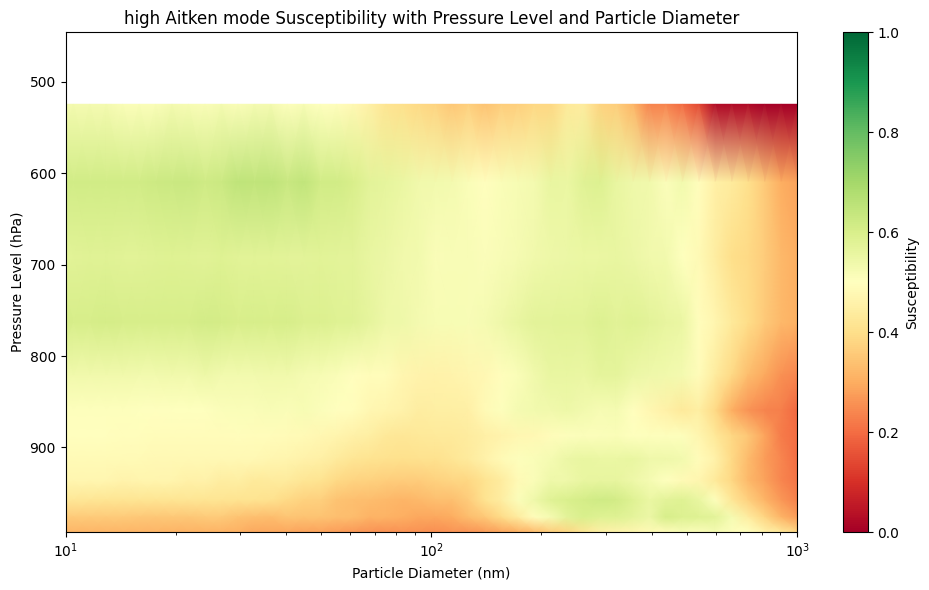

In [40]:
fig, ax = plt.subplots(figsize=(10, 6))

mesh = ax.pcolormesh(
    BigAitReg_lev_ds['radius'] * 2,
    BigAitReg_lev_ds['lev'],
    BigAitReg_lev_ds['slope'].T,
    shading='gouraud',
    vmin=0,
    vmax=1,
    cmap='RdYlGn'
)
ax.set_xscale('log')
ax.set_xlim(10,1000)
ax.invert_yaxis()
ax.set_xlabel('Particle Diameter (nm)')
ax.set_ylabel('Pressure Level (hPa)')
ax.set_title('high Aitken mode Susceptibility with Pressure Level and Particle Diameter')

plt.colorbar(mesh, ax=ax, label='Susceptibility')
plt.tight_layout()
plt.show()

In [41]:
BigAccReg_ds

<xarray.Dataset> Size: 8kB
Dimensions:    (radius: 61, updraft_q: 4)
Coordinates:
  * radius     (radius) float64 488B 1.0 1.109 1.23 1.365 ... 407.4 451.9 501.2
  * updraft_q  (updraft_q) <U8 128B 'Q0-Q75' 'Q75-Q90' 'Q90-Q100' 'Total'
Data variables:
    slope      (radius, updraft_q) float64 2kB 0.4519 0.4984 ... 0.1284 0.2567
    r_value    (radius, updraft_q) float64 2kB 0.8966 0.9471 ... 0.7712 0.8303
    std_err    (radius, updraft_q) float64 2kB 0.02278 0.01741 ... 0.01768
    intercept  (radius, updraft_q) float64 2kB 0.4767 0.5904 ... 1.997 1.941
Attributes:
    name:     BigAccReg

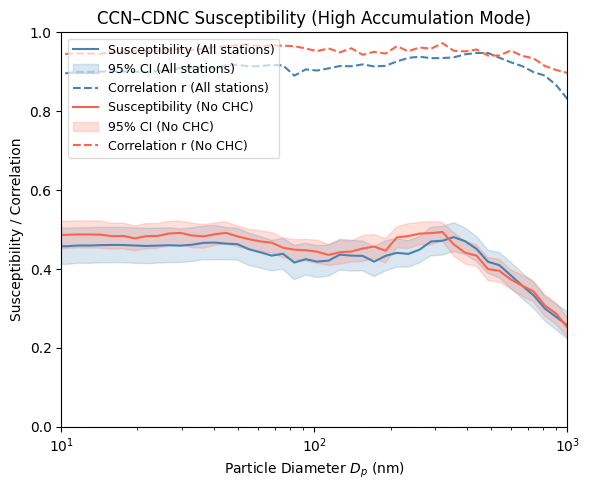

In [42]:
fig, ax = plt.subplots(figsize=(6, 5))

# --- Full dataset ---
color_all = 'steelblue'
ax.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['slope'].sel(updraft_q = 'Total'),
        color=color_all, label='Susceptibility (All stations)')
ax.fill_between(BigAccReg_ds['radius']*2,
                BigAccReg_ds['slope'].sel(updraft_q = 'Total') - 1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                BigAccReg_ds['slope'].sel(updraft_q = 'Total') + 1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                color=color_all, alpha=0.2, label='95% CI (All stations)')
ax.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['r_value'].sel(updraft_q = 'Total'),
        '--', color=color_all, label='Correlation r (All stations)')

# --- No CHC ---
color_noCHC = 'tomato'
ax.plot(BigAccReg_noCHC_ds['radius']*2, BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total'),
        color=color_noCHC, label='Susceptibility (No CHC)')
ax.fill_between(BigAccReg_noCHC_ds['radius']*2,
                BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total') - 1.98*BigAccReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total') + 1.98*BigAccReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                color=color_noCHC, alpha=0.2, label='95% CI (No CHC)')
ax.plot(BigAccReg_noCHC_ds['radius']*2, BigAccReg_noCHC_ds['r_value'].sel(updraft_q = 'Total'),
        '--', color=color_noCHC, label='Correlation r (No CHC)')

ax.axhline(0, color='black', linewidth=0.8, linestyle=':')
ax.legend(loc='upper left', fontsize=9, framealpha=0.7)
ax.set_title('CCN–CDNC Susceptibility (High Accumulation Mode)')
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([0, 1])
ax.set_xlim([10, 1000])
ax.set_xscale('log')
plt.tight_layout()
plt.show()

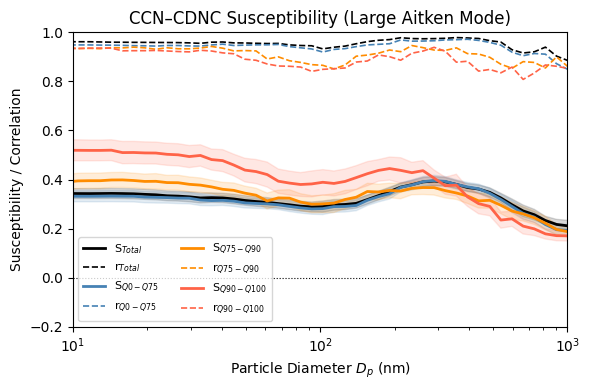

In [43]:
fig, ax = plt.subplots(figsize=(6, 4))

colors = {
    'Total':    'black',
    'Q0-Q75':   'steelblue',
    'Q75-Q90':  'darkorange',
    'Q90-Q100': 'tomato',
}

for q_label, color in colors.items():
    ds = BigAitReg_ds.sel(updraft_q=q_label)
    
    ax.plot(ds['radius']*2, ds['slope'],
            color=color, linewidth=2,
            label=f'S$_{{{q_label}}}$')
    ax.fill_between(ds['radius']*2,
                    ds['slope'] - 1.98*ds['std_err'],
                    ds['slope'] + 1.98*ds['std_err'],
                    color=color, alpha=0.15)
    ax.plot(ds['radius']*2, ds['r_value'],
            '--', color=color, linewidth=1.2,
            label=f'r$_{{{q_label}}}$')

ax.axhline(0, color='k', linewidth=0.8, linestyle=':')
ax.set_title('CCN–CDNC Susceptibility (Large Aitken Mode)')
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([-0.2, 1])
ax.set_xlim([10, 1000])
ax.set_xscale('log')
ax.legend(fontsize=8, ncols=2)
plt.tight_layout()
plt.show()

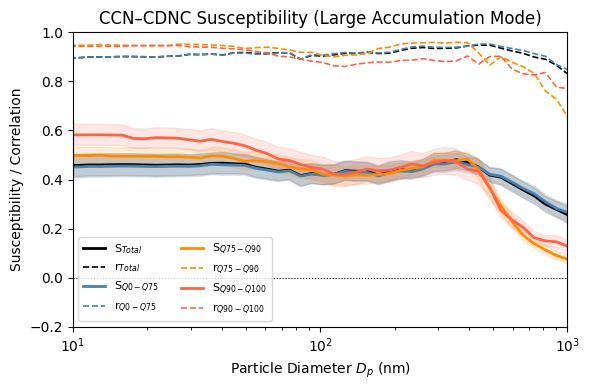

In [44]:
fig, ax = plt.subplots(figsize=(6, 4))

colors = {
    'Total':    'black',
    'Q0-Q75':   'steelblue',
    'Q75-Q90':  'darkorange',
    'Q90-Q100': 'tomato',
}

for q_label, color in colors.items():
    ds = BigAccReg_ds.sel(updraft_q=q_label)
    
    ax.plot(ds['radius']*2, ds['slope'],
            color=color, linewidth=2,
            label=f'S$_{{{q_label}}}$')
    ax.fill_between(ds['radius']*2,
                    ds['slope'] - 1.98*ds['std_err'],
                    ds['slope'] + 1.98*ds['std_err'],
                    color=color, alpha=0.15)
    ax.plot(ds['radius']*2, ds['r_value'],
            '--', color=color, linewidth=1.2,
            label=f'r$_{{{q_label}}}$')

ax.axhline(0, color='k', linewidth=0.8, linestyle=':')
ax.set_title('CCN–CDNC Susceptibility (Large Accumulation Mode)')
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([-0.2, 1])
ax.set_xlim([10, 1000])
ax.set_xscale('log')
ax.legend(fontsize=8, ncols=2)
plt.tight_layout()
plt.show()

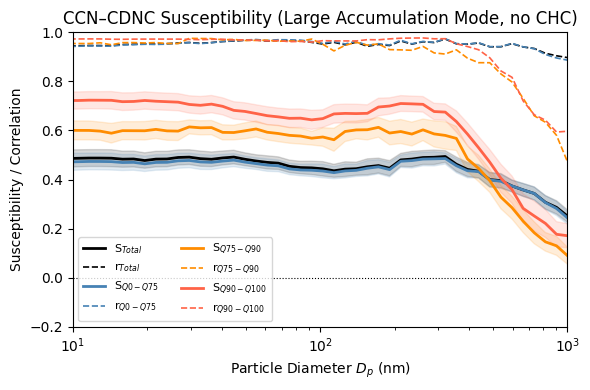

In [45]:
fig, ax = plt.subplots(figsize=(6, 4))

colors = {
    'Total':    'black',
    'Q0-Q75':   'steelblue',
    'Q75-Q90':  'darkorange',
    'Q90-Q100': 'tomato',
}

for q_label, color in colors.items():
    ds = BigAccReg_noCHC_ds.sel(updraft_q=q_label)
    
    ax.plot(ds['radius']*2, ds['slope'],
            color=color, linewidth=2,
            label=f'S$_{{{q_label}}}$')
    ax.fill_between(ds['radius']*2,
                    ds['slope'] - 1.98*ds['std_err'],
                    ds['slope'] + 1.98*ds['std_err'],
                    color=color, alpha=0.15)
    ax.plot(ds['radius']*2, ds['r_value'],
            '--', color=color, linewidth=1.2,
            label=f'r$_{{{q_label}}}$')

ax.axhline(0, color='k', linewidth=0.8, linestyle=':')
ax.set_title('CCN–CDNC Susceptibility (Large Accumulation Mode, no CHC)')
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([-0.2, 1])
ax.set_xlim([10, 1000])
ax.set_xscale('log')
ax.legend(fontsize=8, ncols=2)
plt.tight_layout()
plt.show()

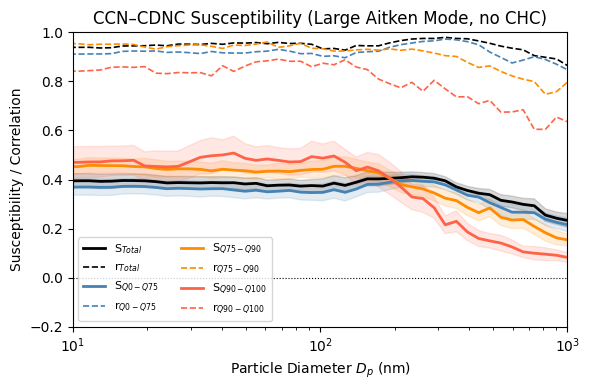

In [46]:
fig, ax = plt.subplots(figsize=(6, 4))

colors = {
    'Total':    'black',
    'Q0-Q75':   'steelblue',
    'Q75-Q90':  'darkorange',
    'Q90-Q100': 'tomato',
}

for q_label, color in colors.items():
    ds = BigAitReg_noCHC_ds.sel(updraft_q=q_label)
    
    ax.plot(ds['radius']*2, ds['slope'],
            color=color, linewidth=2,
            label=f'S$_{{{q_label}}}$')
    ax.fill_between(ds['radius']*2,
                    ds['slope'] - 1.98*ds['std_err'],
                    ds['slope'] + 1.98*ds['std_err'],
                    color=color, alpha=0.15)
    ax.plot(ds['radius']*2, ds['r_value'],
            '--', color=color, linewidth=1.2,
            label=f'r$_{{{q_label}}}$')

ax.axhline(0, color='k', linewidth=0.8, linestyle=':')
ax.set_title('CCN–CDNC Susceptibility (Large Aitken Mode, no CHC)')
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([-0.2, 1])
ax.set_xlim([10, 1000])
ax.set_xscale('log')
ax.legend(fontsize=8, ncols=2)
plt.tight_layout()
plt.show()

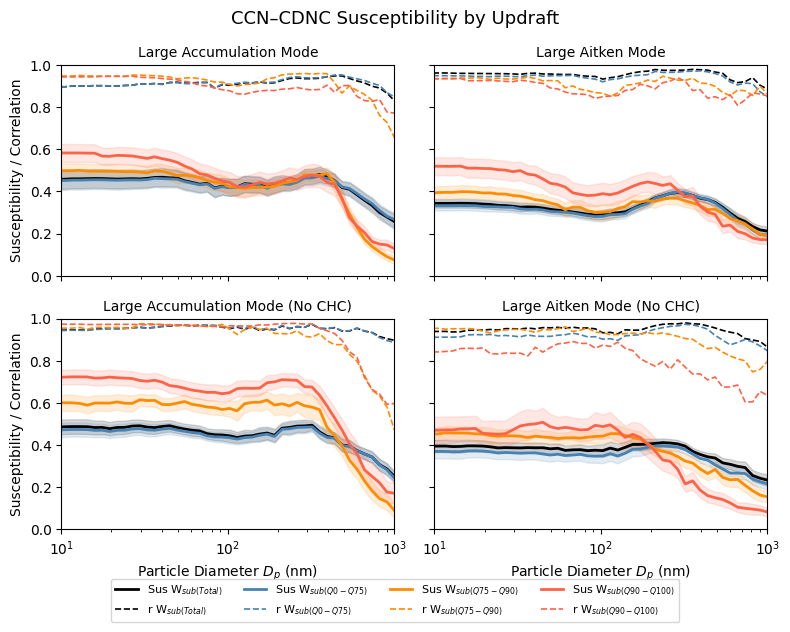

In [47]:
colors = {
    'Total':    'black',
    'Q0-Q75':   'steelblue',
    'Q75-Q90':  'darkorange',
    'Q90-Q100': 'tomato',
}

panels = [
    (BigAccReg_ds,       'Large Accumulation Mode'),
    (BigAitReg_ds,       'Large Aitken Mode'),
    (BigAccReg_noCHC_ds, 'Large Accumulation Mode (No CHC)'),
    (BigAitReg_noCHC_ds, 'Large Aitken Mode (No CHC)'),
]

fig, axes = plt.subplots(2, 2, figsize=(8, 6), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (ds_full, title) in zip(axes, panels):
    for q_label, color in colors.items():
        ds = ds_full.sel(updraft_q=q_label)

        ax.plot(ds['radius']*2, ds['slope'],
                color=color, linewidth=2,
                label=f'Sus W$_{{sub ({q_label})}}$')
        ax.fill_between(ds['radius']*2,
                        ds['slope'] - 1.98*ds['std_err'],
                        ds['slope'] + 1.98*ds['std_err'],
                        color=color, alpha=0.15)
        ax.plot(ds['radius']*2, ds['r_value'],
                '--', color=color, linewidth=1.2,
                label=f'r W$_{{sub ({q_label})}}$')

    ax.set_title(title, fontsize=10)
    ax.set_ylim([0, 1])
    ax.set_xlim([10, 1000])
    ax.set_xscale('log')

# Shared axis labels
for ax in axes[2:]:  # bottom row
    ax.set_xlabel('Particle Diameter $D_p$ (nm)')
for ax in axes[::2]:  # left column
    ax.set_ylabel('Susceptibility / Correlation')

# Single shared legend outside the subplots
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=8,
           ncols=len(colors), bbox_to_anchor=(0.5, -0.05))

fig.suptitle('CCN–CDNC Susceptibility by Updraft', fontsize=13)
plt.tight_layout()
plt.show()

In [48]:
import warnings
import numpy as np
acc_count = pd.Series(Pairs_acc_noCHC.lev.values).value_counts().sort_index()
ait_count = pd.Series(Pairs_ait_noCHC.lev.values).value_counts().sort_index()
all_levels = acc_count.index.union(ait_count.index)

BigAccReg_noCHC_lev_ds = xr.Dataset(
    data_vars={
        "slope":     (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "r_value":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "std_err":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "intercept": (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),

    },
    coords={
        "radius": radii,
        'lev': all_levels,
    }
)


with warnings.catch_warnings():
    warnings.simplefilter("ignore", RuntimeWarning)
    
    for level in all_levels:
        for r in range(len(radii)):
            CCN_slice = Pairs_acc_noCHC.CCN.sel(lev=level).isel(radius=r)
            bins = np.logspace(np.log10(CCN_slice.min().values), np.log10(CCN_slice.max().values), 101)
    
            try:
                CCN_binned  = CCN_slice.groupby_bins(CCN_slice, bins).mean()
                CDNC_binned = Pairs_acc_noCHC.CDNC.sel(lev=level).groupby_bins(CCN_slice, bins).mean()
            except ValueError:
                continue

            x = np.log10(CCN_binned.values)
            y = np.log10(CDNC_binned.values)
            mask = np.isfinite(x) & np.isfinite(y)

            if mask.sum() < 4:
                continue

            slope, intercept, r_value, p_value, std_err = stats.linregress(x[mask], y[mask])


            loc = {"radius": radii[r], "lev": level}
            BigAccReg_noCHC_lev_ds["slope"].loc[loc]      = slope
            BigAccReg_noCHC_lev_ds["r_value"].loc[loc]    = r_value
            BigAccReg_noCHC_lev_ds["std_err"].loc[loc]    = std_err
            BigAccReg_noCHC_lev_ds["intercept"].loc[loc]  = intercept

In [49]:
import warnings
import numpy as np
acc_count = pd.Series(Pairs_acc_noCHC.lev.values).value_counts().sort_index()
ait_count = pd.Series(Pairs_ait_noCHC.lev.values).value_counts().sort_index()
all_levels = ait_count.index

BigAitReg_noCHC_lev_ds = xr.Dataset(
    data_vars={
        "slope":     (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "r_value":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "std_err":   (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),
        "intercept": (["radius", "lev"], np.full((len(radii), len(all_levels)), np.nan)),

    },
    coords={
        "radius": radii,
        'lev': all_levels,
    }
)


with warnings.catch_warnings():
    warnings.simplefilter("ignore", RuntimeWarning)
    
    for level in all_levels:
        for r in range(len(radii)):
            CCN_slice = Pairs_ait_noCHC.CCN.sel(lev=level).isel(radius=r)
            bins = np.logspace(np.log10(CCN_slice.min().values), np.log10(CCN_slice.max().values), 101)
    
            try:
                CCN_binned  = CCN_slice.groupby_bins(CCN_slice, bins).mean()
                CDNC_binned = Pairs_ait_noCHC.CDNC.sel(lev=level).groupby_bins(CCN_slice, bins).mean()
            except ValueError:
                continue

            x = np.log10(CCN_binned.values)
            y = np.log10(CDNC_binned.values)
            mask = np.isfinite(x) & np.isfinite(y)

            if mask.sum() < 4:
                continue

            slope, intercept, r_value, p_value, std_err = stats.linregress(x[mask], y[mask])


            loc = {"radius": radii[r], "lev": level}
            BigAitReg_noCHC_lev_ds["slope"].loc[loc]      = slope
            BigAitReg_noCHC_lev_ds["r_value"].loc[loc]    = r_value
            BigAitReg_noCHC_lev_ds["std_err"].loc[loc]    = std_err
            BigAitReg_noCHC_lev_ds["intercept"].loc[loc]  = intercept

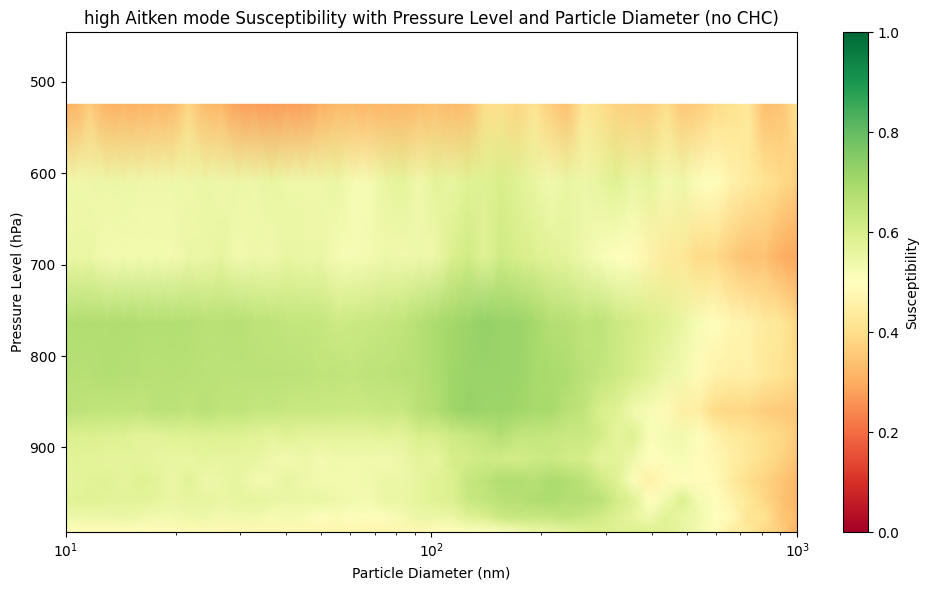

In [50]:
fig, ax = plt.subplots(figsize=(10, 6))

mesh = ax.pcolormesh(
    BigAitReg_noCHC_lev_ds['radius'] * 2,
    BigAitReg_noCHC_lev_ds['lev'],
    BigAitReg_noCHC_lev_ds['slope'].T,
    shading='gouraud',
    vmin=0,
    vmax=1,
    cmap='RdYlGn'
)
ax.set_xscale('log')
ax.set_xlim(10,1000)
ax.invert_yaxis()
ax.set_xlabel('Particle Diameter (nm)')
ax.set_ylabel('Pressure Level (hPa)')
ax.set_title('high Aitken mode Susceptibility with Pressure Level and Particle Diameter (no CHC)')

plt.colorbar(mesh, ax=ax, label='Susceptibility')
plt.tight_layout()
plt.show()

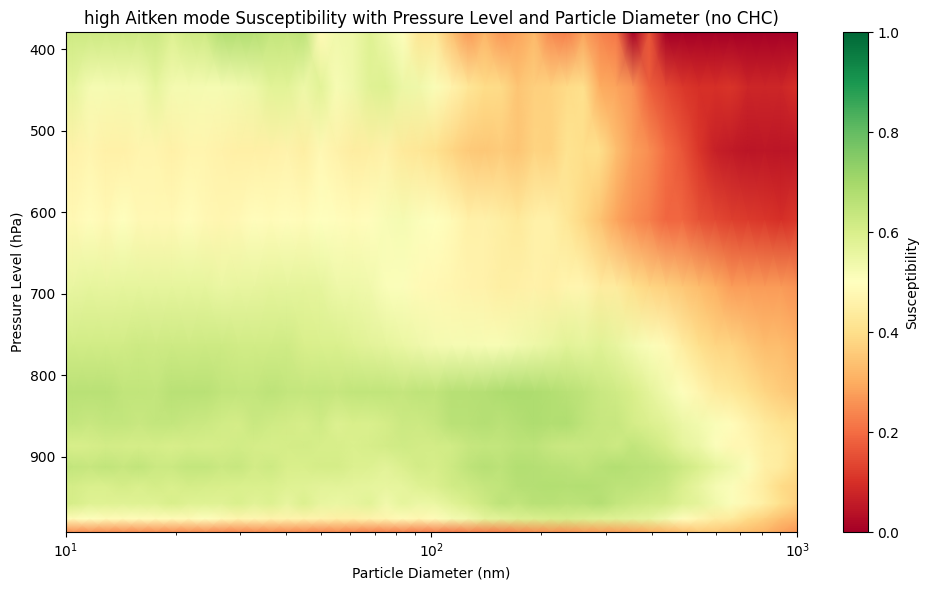

In [51]:
fig, ax = plt.subplots(figsize=(10, 6))

mesh = ax.pcolormesh(
    BigAccReg_noCHC_lev_ds['radius'] * 2,
    BigAccReg_noCHC_lev_ds['lev'],
    BigAccReg_noCHC_lev_ds['slope'].T,
    shading='gouraud',
    vmin=0,
    vmax=1,
    cmap='RdYlGn'
)
ax.set_xscale('log')
ax.set_xlim(10,1000)
ax.invert_yaxis()
ax.set_xlabel('Particle Diameter (nm)')
ax.set_ylabel('Pressure Level (hPa)')
ax.set_title('high Aitken mode Susceptibility with Pressure Level and Particle Diameter (no CHC)')

plt.colorbar(mesh, ax=ax, label='Susceptibility')
plt.tight_layout()
plt.show()

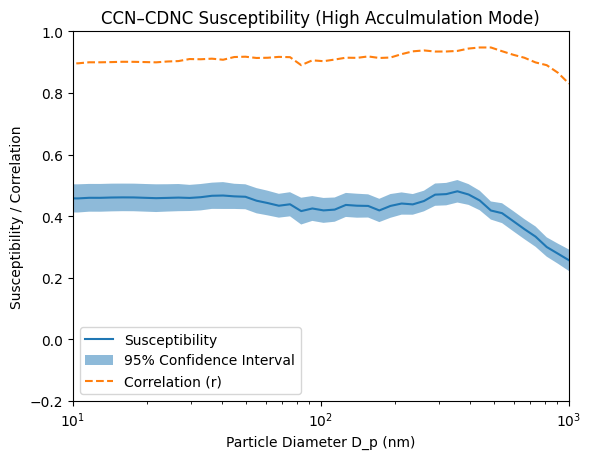

In [52]:
plt.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['slope'].sel(updraft_q = 'Total'), label = 'Susceptibility')

plt.fill_between(BigAccReg_ds['radius']*2,
                 BigAccReg_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                 BigAccReg_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                 alpha = 0.5, label = '95% Confidence Interval')

plt.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['r_value'].sel(updraft_q = 'Total'), '--', label = 'Correlation (r)')
plt.legend()
plt.title(f'CCN–CDNC Susceptibility (High Acculmulation Mode)')
plt.xlabel('Particle Diameter D_p (nm)')
plt.ylabel('Susceptibility / Correlation')
plt.ylim([-0.2, 1])
plt.xlim([10,1000])
plt.xscale('log')

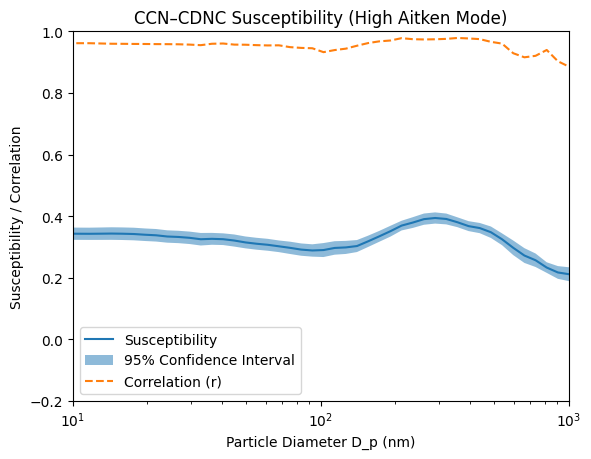

In [53]:
plt.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['slope'].sel(updraft_q = 'Total'), label = 'Susceptibility')

plt.fill_between(BigAitReg_ds['radius']*2,
                 BigAitReg_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                 BigAitReg_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                 alpha = 0.5, label = '95% Confidence Interval')
plt.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['r_value'].sel(updraft_q = 'Total'), '--', label = 'Correlation (r)')
plt.legend()
plt.title(f'CCN–CDNC Susceptibility (High Aitken Mode)')
plt.xlabel('Particle Diameter D_p (nm)')
plt.ylabel('Susceptibility / Correlation')
plt.ylim([-0.2, 1])
plt.xlim([10,1000])
plt.xscale('log')

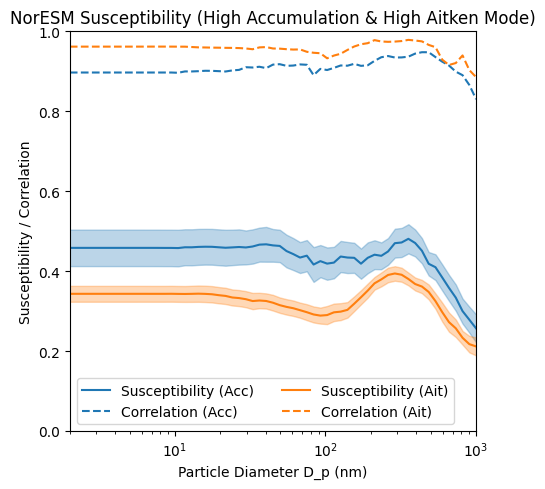

In [54]:
fig, ax = plt.subplots(figsize=[5, 5])

# Accumulation mode
ax.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['slope'].sel(updraft_q = 'Total'), label='Susceptibility (Acc)', color='C0')
ax.fill_between(BigAccReg_ds['radius']*2,
                BigAccReg_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                BigAccReg_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                alpha=0.3, color='C0')
ax.plot(BigAccReg_ds['radius']*2, BigAccReg_ds['r_value'].sel(updraft_q = 'Total'), '--', color='C0', label='Correlation (Acc)')

# Aitken mode
ax.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['slope'].sel(updraft_q = 'Total'), label='Susceptibility (Ait)', color='C1')
ax.fill_between(BigAitReg_ds['radius']*2,
                BigAitReg_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                BigAitReg_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                alpha=0.3, color='C1')
ax.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['r_value'].sel(updraft_q = 'Total'), '--', color='C1', label='Correlation (Ait)')

ax.legend(ncols = 2)
ax.set_title('NorESM Susceptibility (High Accumulation & High Aitken Mode)')
ax.set_xlabel('Particle Diameter D_p (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([0, 1])
ax.set_xlim([2, 1000])
ax.set_xscale('log')
plt.tight_layout()

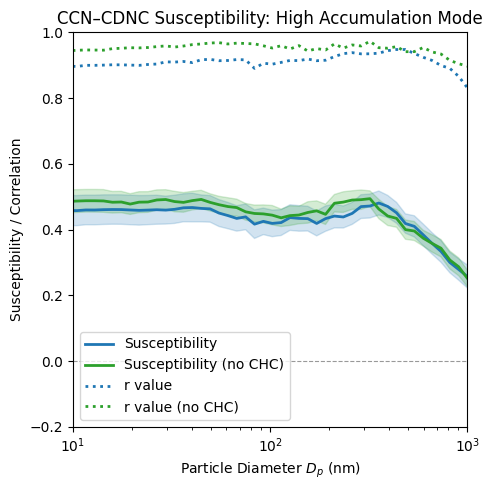

In [55]:
from matplotlib.lines import Line2D

c1, c2 = 'C0', 'C2'

fig, ax = plt.subplots(figsize=(5, 5))

# --- Susceptibility ---
ax.plot(BigAccReg_ds['radius']*2,        BigAccReg_ds['slope'].sel(updraft_q = 'Total'),        color=c1, lw=2, ls='-',  label='Susceptibility')
ax.plot(BigAccReg_noCHC_ds['radius']*2,  BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total'),  color=c2, lw=2, ls='-', label='Susceptibility (no CHC)')

# --- 95% CI ---
ax.fill_between(BigAccReg_ds['radius']*2,
                BigAccReg_ds['slope'].sel(updraft_q = 'Total') - 1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                BigAccReg_ds['slope'].sel(updraft_q = 'Total') + 1.98*BigAccReg_ds['std_err'].sel(updraft_q = 'Total'),
                color=c1, alpha=0.2)
ax.fill_between(BigAccReg_noCHC_ds['radius']*2,
                BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total') - 1.98*BigAccReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                BigAccReg_noCHC_ds['slope'].sel(updraft_q = 'Total') + 1.98*BigAccReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                color=c2, alpha=0.2)

# --- Correlation ---
ax.plot(BigAccReg_ds['radius']*2,        BigAccReg_ds['r_value'].sel(updraft_q = 'Total'),        color=c1, lw=2, ls='dotted', label='r value')
ax.plot(BigAccReg_noCHC_ds['radius']*2,  BigAccReg_noCHC_ds['r_value'].sel(updraft_q = 'Total'),  color=c2, lw=2, ls='dotted', label='r value (no CHC)')

# --- Reference line ---
ax.axhline(0, color='k', lw=0.8, ls='--', alpha=0.4)

# --- Axes ---
ax.set_xscale('log')
ax.set_xlim([10, 1000])
ax.set_ylim([-0.2, 1])
ax.set_xlabel('Particle Diameter $D_p$ (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_title('CCN–CDNC Susceptibility: High Accumulation Mode')
plt.legend()
plt.tight_layout()
plt.show()

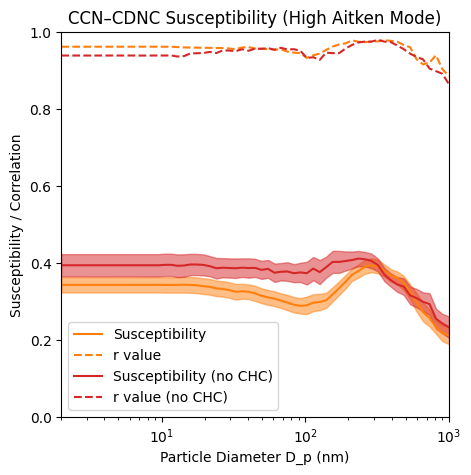

In [56]:
c1, c2 = 'C1', 'C3'
fig, ax = plt.subplots(figsize=(5, 5))


ax.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['slope'].sel(updraft_q = 'Total'), label = 'Susceptibility', color = c1)
ax.fill_between(BigAitReg_ds['radius']*2,
                 BigAitReg_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                 BigAitReg_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAitReg_ds['std_err'].sel(updraft_q = 'Total'),
                 alpha = 0.5, color = c1)
ax.plot(BigAitReg_ds['radius']*2, BigAitReg_ds['r_value'].sel(updraft_q = 'Total'), '--', label = 'r value', color = c1)
ax.plot(BigAitReg_noCHC_ds['radius']*2, BigAitReg_noCHC_ds['slope'].sel(updraft_q = 'Total'), label = 'Susceptibility (no CHC)', color = c2)
ax.fill_between(BigAitReg_noCHC_ds['radius']*2,
                 BigAitReg_noCHC_ds['slope'].sel(updraft_q = 'Total')-1.98*BigAitReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                 BigAitReg_noCHC_ds['slope'].sel(updraft_q = 'Total')+1.98*BigAitReg_noCHC_ds['std_err'].sel(updraft_q = 'Total'),
                 alpha = 0.5, color = c2)
ax.plot(BigAitReg_noCHC_ds['radius']*2, BigAitReg_noCHC_ds['r_value'].sel(updraft_q = 'Total'), '--', label = 'r value (no CHC)', color = c2)
ax.legend()
ax.set_title(f'CCN–CDNC Susceptibility (High Aitken Mode)')
ax.set_xlabel('Particle Diameter D_p (nm)')
ax.set_ylabel('Susceptibility / Correlation')
ax.set_ylim([0, 1])
ax.set_xlim([2,1000])
ax.set_xscale('log')

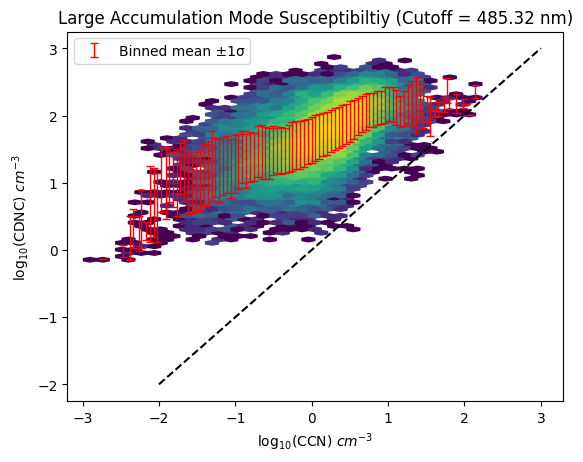

In [57]:
r = 53

Log_bins = np.linspace(np.log10(Pairs_acc['CCN'].isel(radius=r).min().values),
                       np.log10(Pairs_acc['CCN'].isel(radius=r).max().values)
                                ,101)
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])
# Binned means
x_mean = log_x \
    .groupby_bins(log_x, Log_bins).mean()

y_mean = log_y \
    .groupby_bins(log_x, Log_bins).mean()

# Binned standard deviations (errors)
x_err = log_x \
    .groupby_bins(log_x, Log_bins).std()

y_err = log_y \
    .groupby_bins(log_x, Log_bins).std()

# Binned means with error bars
plt.errorbar(
    x_mean,
    y_mean,
    yerr=y_err,
    fmt=' ',
    capsize=3,
    elinewidth=1.-2,
    label='Binned mean ±1σ',
    ecolor='r',
    
)
plt.hexbin(np.log10(Pairs_acc['CCN'].isel(radius=r)),
            np.log10(Pairs_acc['CDNC']),
            #c = 'orange',
            #alpha = 0.2
          bins = 'log',
           gridsize = [30,30]
            
          )
# Reference & formatting


plt.plot([-2, 3], [-2, 3], 'k--')

plt.xlabel('log$_{10}$(CCN) $cm^{-3}$')
plt.ylabel('log$_{10}$(CDNC) $cm^{-3}$')
plt.legend()
plt.title(f'Large Accumulation Mode Susceptibiltiy (Cutoff = {radii[r]*2:.2f} nm)')
plt.show()

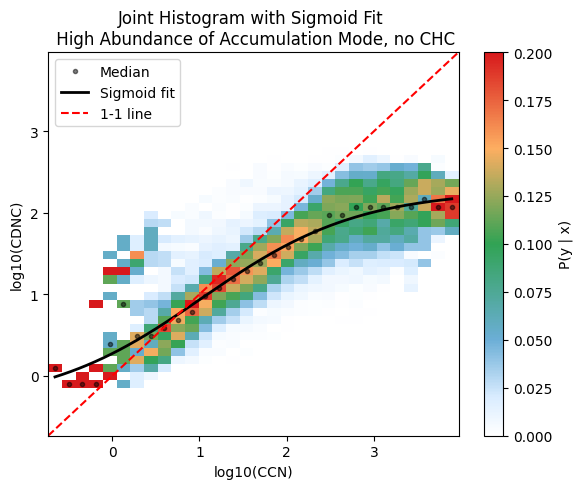

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_acc_noCHC['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_acc_noCHC['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
H, xedges, yedges = np.histogram2d(x, y, bins=30)

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(len(x_centers), np.nan)

for i in range(len(x_centers)):
    counts = H[i, :]
    if counts.sum() > 0:
        cdf = np.cumsum(counts) / counts.sum()
        median_idx = np.searchsorted(cdf, 0.5)
        y_median[i] = y_centers[median_idx]

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]

# Smooth median (helps stability)
y_fit_smooth = gaussian_filter1d(y_fit, sigma=1)

# --- Sigmoid ---
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k * (x - x0))) + b

p0 = [y_fit.max() - y_fit.min(), np.median(x_fit), 1, y_fit.min()]
params, _ = curve_fit(sigmoid, x_fit, y_fit_smooth, p0=p0, maxfev=10000)
x_smooth = np.linspace(x_fit.min(), x_fit.max(), 200)
y_sigmoid = sigmoid(x_smooth, *params)
def sigmoid_derivative(x, L, x0, k, b):
    exp_term = np.exp(-k * (x - x0))
    return (L * k * exp_term) / (1 + exp_term)**2
y_deriv = sigmoid_derivative(x_smooth, *params)

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_sigmoid, 'k-', linewidth=2, label='Sigmoid fit')
plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Sigmoid Fit \n High Abundance of Accumulation Mode, no CHC')
plt.legend()

plt.tight_layout()
plt.show()

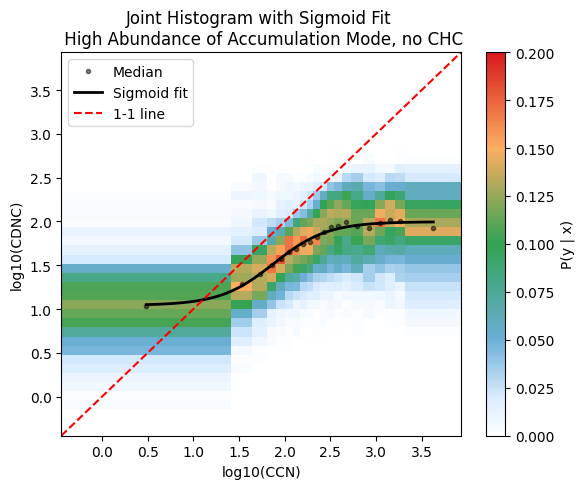

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_acc['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_acc['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
# --- Equal-frequency bins in x ---
n_bins = 20
xbins = np.quantile(x, np.linspace(0, 1, n_bins + 1))

# Optional: keep y linear
ybins = np.linspace(y.min(), y.max(), 30)

# --- 2D histogram ---
H, xedges, yedges = np.histogram2d(x, y, bins=[xbins, ybins])

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(n_bins, np.nan)
x_centers = 0.5 * (xbins[:-1] + xbins[1:])

for i in range(n_bins):
    mask = (x >= xbins[i]) & (x < xbins[i+1])
    if np.any(mask):
        y_median[i] = np.median(y[mask])

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]

# --- Sigmoid ---
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k * (x - x0))) + b

p0 = [y_fit.max() - y_fit.min(), np.median(x_fit), 1, y_fit.min()]
params, _ = curve_fit(sigmoid, x_fit, y_fit, p0=p0, maxfev=10000)
x_smooth = np.linspace(x_fit.min(), x_fit.max(), 200)
y_sigmoid = sigmoid(x_smooth, *params)
def sigmoid_derivative(x, L, x0, k, b):
    exp_term = np.exp(-k * (x - x0))
    return (L * k * exp_term) / (1 + exp_term)**2
y_deriv = sigmoid_derivative(x_smooth, *params)

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_sigmoid, 'k-', linewidth=2, label='Sigmoid fit')
plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Sigmoid Fit \n High Abundance of Accumulation Mode, no CHC')
plt.legend()

plt.tight_layout()
plt.show()

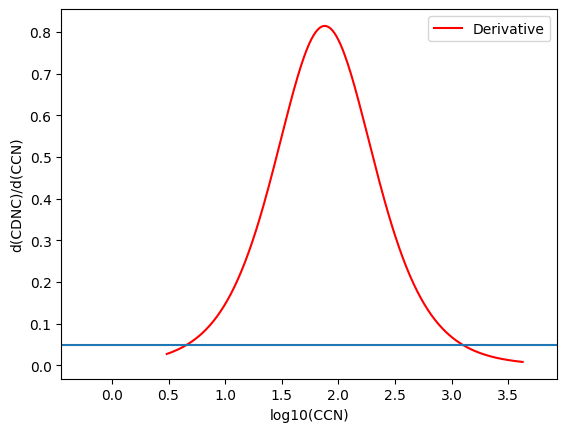

In [103]:
plt.plot(x_smooth, y_deriv, 'r-', label='Derivative')
plt.xlim([Graph_min,Graph_max])

plt.axhline(0.05)
plt.xlabel('log10(CCN)')
plt.ylabel('d(CDNC)/d(CCN)')
plt.legend()
plt.show()

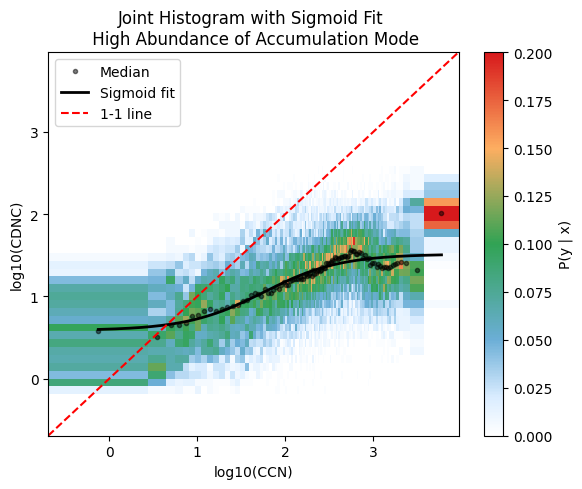

In [127]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_ait['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_ait['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
# --- Equal-frequency bins in x ---
n_bins = 100
xbins = np.quantile(x, np.linspace(0, 1, n_bins + 1))

# Optional: keep y linear
ybins = np.linspace(y.min(), y.max(), 30)

# --- 2D histogram ---
H, xedges, yedges = np.histogram2d(x, y, bins=[xbins, ybins])

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(n_bins, np.nan)
x_centers = 0.5 * (xbins[:-1] + xbins[1:])

for i in range(n_bins):
    mask = (x >= xbins[i]) & (x < xbins[i+1])
    if np.any(mask):
        y_median[i] = np.median(y[mask])

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]

# --- Sigmoid ---
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k * (x - x0))) + b

p0 = [y_fit.max() - y_fit.min(), np.median(x_fit), 1, y_fit.min()]
params, _ = curve_fit(sigmoid, x_fit, y_fit, p0=p0, maxfev=10000)
x_smooth = np.linspace(x_fit.min(), x_fit.max(), 200)
y_sigmoid = sigmoid(x_smooth, *params)
def sigmoid_derivative(x, L, x0, k, b):
    exp_term = np.exp(-k * (x - x0))
    return (L * k * exp_term) / (1 + exp_term)**2
y_deriv = sigmoid_derivative(x_smooth, *params)

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_sigmoid, 'k-', linewidth=2, label='Sigmoid fit')
plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Sigmoid Fit \n High Abundance of Accumulation Mode')
plt.legend()

plt.tight_layout()
plt.show()

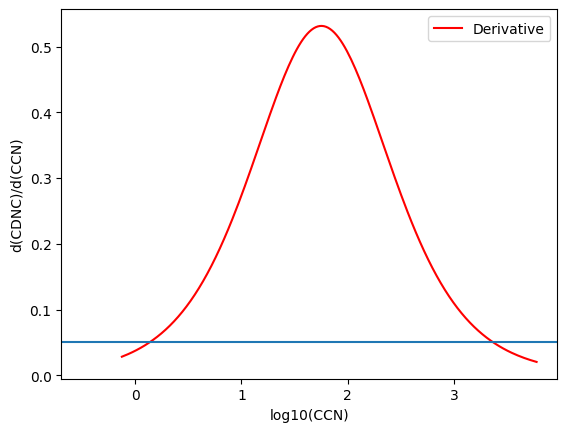

In [128]:
plt.plot(x_smooth, y_deriv, 'r-', label='Derivative')
plt.xlim([Graph_min,Graph_max])

plt.axhline(0.05)
plt.xlabel('log10(CCN)')
plt.ylabel('d(CDNC)/d(CCN)')
plt.legend()
plt.show()

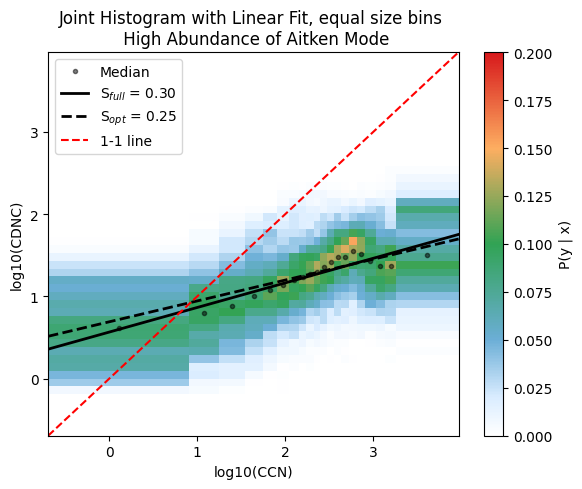

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_ait['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_ait['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
# --- Equal-frequency bins in x ---
n_bins = 20
xbins = np.quantile(x, np.linspace(0, 1, n_bins + 1))

# Optional: keep y linear
ybins = np.linspace(y.min(), y.max(), 30)

# --- 2D histogram ---
H, xedges, yedges = np.histogram2d(x, y, bins=[xbins, ybins])

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(n_bins, np.nan)
x_centers = 0.5 * (xbins[:-1] + xbins[1:])

for i in range(n_bins):
    mask = (x >= xbins[i]) & (x < xbins[i+1])
    if np.any(mask):
        y_median[i] = np.median(y[mask])

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]


x_smooth = np.linspace(Graph_min, Graph_max, 200)
slope, intercept, r_value, p_value, std_err = stats.linregress(
    x_fit, y_fit
)
slope2, intercept2, r_value2, p_value2, std_err2 = stats.linregress(
    x_fit[3:], y_fit[3:]
)
y_smooth = x_smooth*slope+intercept
y_smooth2 = x_smooth*slope2+intercept2

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_smooth, 'k-', linewidth=2, label=f'S$_{{full}}$ = {slope:.2f}')
plt.plot(x_smooth, y_smooth2, 'k--', linewidth=2, label=f'S$_{{opt}}$ = {slope2:.2f}')

plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Linear Fit, equal size bins \n High Abundance of Aitken Mode')
plt.legend()

plt.tight_layout()
plt.show()
#print(BigAccReg_ds.slope.isel(radius = 30).sel(updraft_q = 'Total').values)

In [61]:
len(x_fit)
len(x_fit[3:])

17

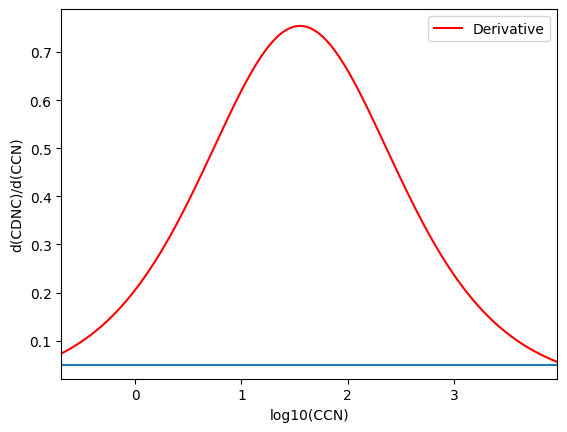

In [62]:
plt.plot(x_smooth, y_deriv, 'r-', label='Derivative')
plt.xlim([Graph_min,Graph_max])

plt.axhline(0.05)
plt.xlabel('log10(CCN)')
plt.ylabel('d(CDNC)/d(CCN)')
plt.legend()
plt.show()

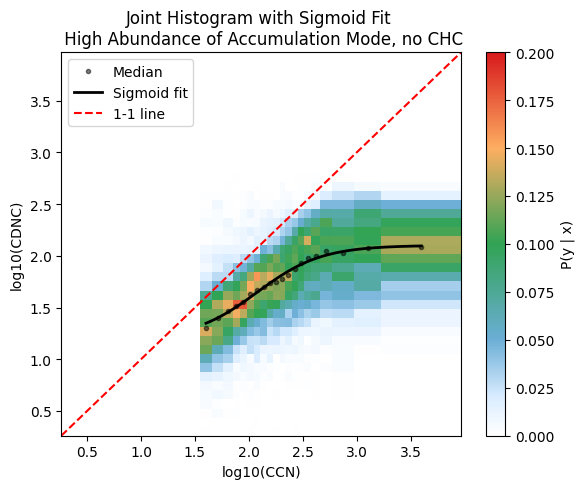

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_acc_noCHC['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_acc_noCHC['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
x_cut = np.quantile(x, 0.15)

mask_cut = x >= x_cut
x = x[mask_cut]
y = y[mask_cut]


Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
# --- Equal-frequency bins in x ---
n_bins = 20
xbins = np.quantile(x, np.linspace(0, 1, n_bins + 1))
ybins = np.linspace(y.min(), y.max(), 30)

H, xedges, yedges = np.histogram2d(x, y, bins=[xbins, ybins])

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(n_bins, np.nan)
x_centers = 0.5 * (xbins[:-1] + xbins[1:])

for i in range(n_bins):
    mask_bin = (x >= xbins[i]) & (x < xbins[i+1])
    if np.any(mask_bin):
        y_median[i] = np.median(y[mask_bin])

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]

# Smooth median (helps stability)
y_fit_smooth = gaussian_filter1d(y_fit, sigma=1)

# --- Sigmoid ---
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k * (x - x0))) + b

p0 = [y_fit.max() - y_fit.min(), np.median(x_fit), 1, y_fit.min()]
params, _ = curve_fit(sigmoid, x_fit, y_fit_smooth, p0=p0, maxfev=10000)
x_smooth = np.linspace(x_fit.min(), x_fit.max(), 200)
y_sigmoid = sigmoid(x_smooth, *params)
def sigmoid_derivative(x, L, x0, k, b):
    exp_term = np.exp(-k * (x - x0))
    return (L * k * exp_term) / (1 + exp_term)**2
y_deriv = sigmoid_derivative(x_smooth, *params)

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_sigmoid, 'k-', linewidth=2, label='Sigmoid fit')
plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Sigmoid Fit \n High Abundance of Accumulation Mode, no CHC')
plt.legend()

plt.tight_layout()
plt.show()

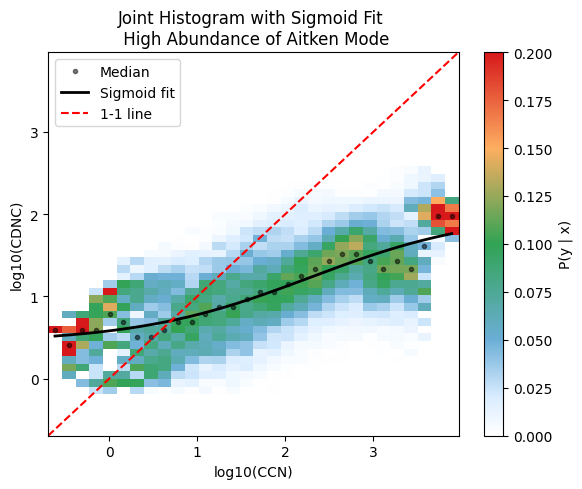

In [111]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter1d

# --- Data ---
x = np.log10(Pairs_ait['CCN'].isel(radius=30).values.flatten())
y = np.log10(Pairs_ait['CDNC'].values.flatten())

# Remove NaNs
mask = np.isfinite(x) & np.isfinite(y)
x, y = x[mask], y[mask]
Graph_min = np.min([np.min(x),np.min(y)])
Graph_max = np.max([np.max(x),np.max(y)])
# --- 2D histogram ---
H, xedges, yedges = np.histogram2d(x, y, bins=30)

# --- Normalize per x-bin ---
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# --- Bin centers ---
x_centers = 0.5 * (xedges[:-1] + xedges[1:])
y_centers = 0.5 * (yedges[:-1] + yedges[1:])

# --- Median per x-bin ---
y_median = np.full(len(x_centers), np.nan)

for i in range(len(x_centers)):
    counts = H[i, :]
    if counts.sum() > 0:
        cdf = np.cumsum(counts) / counts.sum()
        median_idx = np.searchsorted(cdf, 0.5)
        y_median[i] = y_centers[median_idx]

# --- Prepare for fitting ---
valid = np.isfinite(y_median)
x_fit = x_centers[valid]
y_fit = y_median[valid]

# Smooth median (helps stability)
y_fit_smooth = gaussian_filter1d(y_fit, sigma=1)

# --- Sigmoid ---
def sigmoid(x, L, x0, k, b):
    return L / (1 + np.exp(-k * (x - x0))) + b

p0 = [y_fit.max() - y_fit.min(), np.median(x_fit), 1, y_fit.min()]
params, _ = curve_fit(sigmoid, x_fit, y_fit_smooth, p0=p0, maxfev=10000)
x_smooth = np.linspace(x_fit.min(), x_fit.max(), 200)
y_sigmoid = sigmoid(x_smooth, *params)
def sigmoid_derivative(x, L, x0, k, b):
    exp_term = np.exp(-k * (x - x0))
    return (L * k * exp_term) / (1 + exp_term)**2
y_deriv = sigmoid_derivative(x_smooth, *params)

# --- Colormap ---
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

# --- Plot ---
plt.figure(figsize=(6,5))

plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

# Median + sigmoid
plt.plot(x_fit, y_fit, 'k.', alpha=0.5, label='Median')
plt.plot(x_smooth, y_sigmoid, 'k-', linewidth=2, label='Sigmoid fit')
plt.ylim([Graph_min,Graph_max])
plt.xlim([Graph_min,Graph_max])
plt.plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
plt.colorbar(label='P(y | x)')
plt.xlabel('log10(CCN)')
plt.ylabel('log10(CDNC)')
plt.title('Joint Histogram with Sigmoid Fit \n High Abundance of Aitken Mode')
plt.legend()

plt.tight_layout()
plt.show()

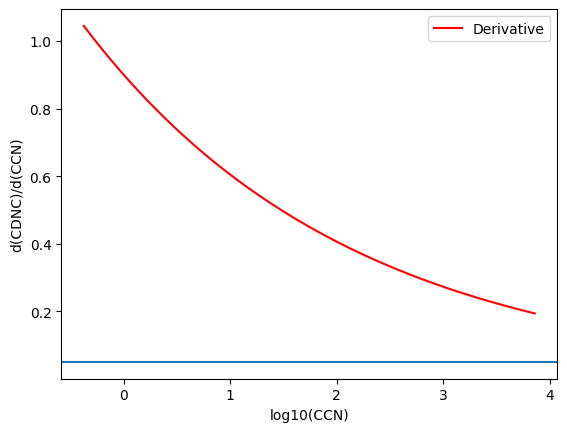

In [109]:
plt.plot(x_smooth, y_deriv, 'r-', label='Derivative')
plt.axhline(0.05)
plt.xlabel('log10(CCN)')
plt.ylabel('d(CDNC)/d(CCN)')
plt.legend()
plt.show()

In [66]:
y_deriv

array([0.04058701, 0.04172162, 0.04288678, 0.04408324, 0.04531179,
       0.04657319, 0.04786826, 0.0491978 , 0.05056265, 0.05196365,
       0.05340165, 0.05487755, 0.05639221, 0.05794654, 0.05954147,
       0.06117792, 0.06285684, 0.06457919, 0.06634594, 0.06815807,
       0.07001659, 0.0719225 , 0.07387682, 0.07588059, 0.07793486,
       0.08004067, 0.08219908, 0.08441118, 0.08667804, 0.08900074,
       0.09138037, 0.09381804, 0.09631485, 0.09887189, 0.10149027,
       0.1041711 , 0.10691548, 0.10972451, 0.11259928, 0.11554089,
       0.11855041, 0.12162891, 0.12477746, 0.1279971 , 0.13128886,
       0.13465374, 0.13809273, 0.1416068 , 0.14519688, 0.14886388,
       0.15260868, 0.15643211, 0.16033497, 0.16431802, 0.16838198,
       0.17252749, 0.17675518, 0.1810656 , 0.18545922, 0.18993649,
       0.19449775, 0.19914328, 0.20387329, 0.2086879 , 0.21358713,
       0.21857093, 0.22363915, 0.22879151, 0.23402765, 0.2393471 ,
       0.24474925, 0.25023338, 0.25579864, 0.26144407, 0.26716

/tmp/ipykernel_2692732/3135803593.py:33: RuntimeWarning: invalid value encountered in divide
  H2_norm = H2 / H2.sum(axis=1, keepdims=True)


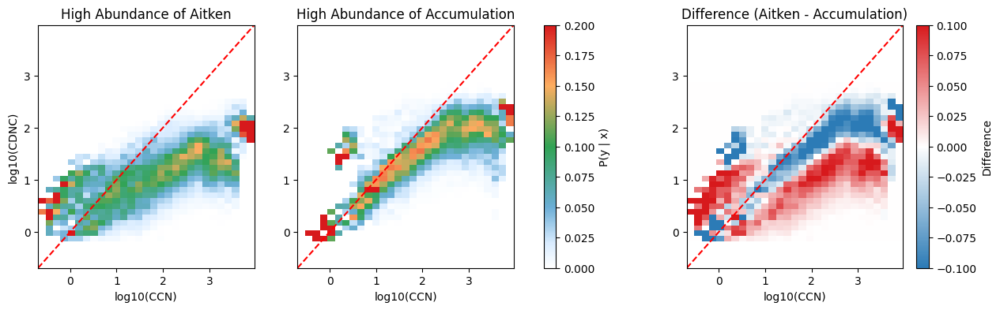

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# --- Data ---
x1 = np.log10(Pairs_ait['CCN'].isel(radius=30))
y1 = np.log10(Pairs_ait['CDNC'])

x2 = np.log10(Pairs_acc['CCN'].isel(radius=30))
y2 = np.log10(Pairs_acc['CDNC'])

# Flatten & remove NaNs (important!)
x1, y1 = x1.values.flatten(), y1.values.flatten()
x2, y2 = x2.values.flatten(), y2.values.flatten()

mask1 = np.isfinite(x1) & np.isfinite(y1)
mask2 = np.isfinite(x2) & np.isfinite(y2)

x1, y1 = x1[mask1], y1[mask1]
x2, y2 = x2[mask2], y2[mask2]
Graph_min = np.min([np.min(x1),np.min(y1),np.min(x2),np.min(y2)])
Graph_max = np.max([np.max(x1),np.max(y1),np.max(x2),np.max(y2)])
# --- مشترک bin edges (shared!) ---
xbins = np.linspace(min(x1.min(), x2.min()), max(x1.max(), x2.max()), 30)
ybins = np.linspace(min(y1.min(), y2.min()), max(y1.max(), y2.max()), 30)

# --- Histograms ---
H1, xedges, yedges = np.histogram2d(x1, y1, bins=[xbins, ybins])
H2, _, _ = np.histogram2d(x2, y2, bins=[xbins, ybins])

# --- Normalize per x-bin ---
H1_norm = H1 / H1.sum(axis=1, keepdims=True)
H2_norm = H2 / H2.sum(axis=1, keepdims=True)

H1_norm = np.nan_to_num(H1_norm)
H2_norm = np.nan_to_num(H2_norm)

# --- Difference ---
H_diff = H1_norm - H2_norm

# --- Colormaps ---
cmap_main = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),
        (0.1,  "#d9ecff"),
        (0.25, "#6baed6"),
        (0.5,  "#31a354"),
        (0.75, "#fdae61"),
        (1.0,  "#d7191c"),
    ]
)

cmap_diff = LinearSegmentedColormap.from_list(
    "diff_map",
    [
        (0.0, "#2c7bb6"),  # blue
        (0.5, "#ffffff"),  # zero
        (1.0, "#d7191c"),  # red
    ]
)

# --- Plot ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Aitken
pcm1 = axes[0].pcolormesh(
    xedges, yedges, H1_norm.T,
    cmap=cmap_main, shading='auto',
    vmin=0, vmax=0.2
)
axes[0].set_title('High Abundance of Aitken')
axes[0].set_xlabel('log10(CCN)')
axes[0].set_ylabel('log10(CDNC)')
axes[0].set_ylim([Graph_min,Graph_max])
axes[0].set_xlim([Graph_min,Graph_max])
axes[0].plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
# Accumulation
pcm2 = axes[1].pcolormesh(
    xedges, yedges, H2_norm.T,
    cmap=cmap_main, shading='auto',
    vmin=0, vmax=0.2
)
axes[1].set_title('High Abundance of Accumulation')
axes[1].set_xlabel('log10(CCN)')
axes[1].set_ylim([Graph_min,Graph_max])
axes[1].set_xlim([Graph_min,Graph_max])
axes[1].plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
# Difference
pcm3 = axes[2].pcolormesh(
    xedges, yedges, H_diff.T,
    cmap=cmap_diff, shading='auto',
    vmin=-0.1, vmax=0.1
)
axes[2].set_title('Difference (Aitken - Accumulation)')
axes[2].set_xlabel('log10(CCN)')
axes[2].set_ylim([Graph_min,Graph_max])
axes[2].set_xlim([Graph_min,Graph_max])
axes[2].plot([Graph_min,Graph_max],[Graph_min,Graph_max], label = '1-1 line', ls = '--', c = 'red')
# Colorbars
fig.colorbar(pcm1, ax=axes[:2], label='P(y | x)')
fig.colorbar(pcm3, ax=axes[2], label='Difference')

plt.show()

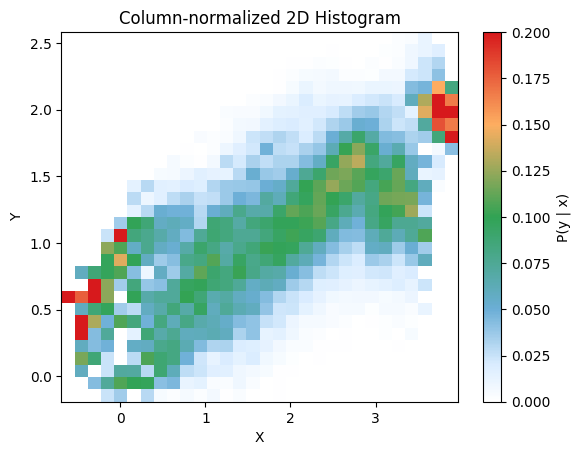

In [68]:
# Create 2D histogram
x = np.log10(Pairs_ait['CCN'].isel(radius=30))
y = np.log10(Pairs_ait['CDNC'])


# 2D histogram
H, xedges, yedges = np.histogram2d(x, y, bins=30)

# Normalize per x-bin
H_norm = H / H.sum(axis=1, keepdims=True)
H_norm = np.nan_to_num(H_norm)

# Custom colormap: white → blue → green → red
cmap = LinearSegmentedColormap.from_list(
    "paper_style",
    [
        (0.0,  "#ffffff"),  # white
        (0.1,  "#d9ecff"),  # very light blue
        (0.25, "#6baed6"),  # blue
        (0.5,  "#31a354"),  # green
        (0.75, "#fdae61"),  # orange/yellow
        (1.0,  "#d7191c"),  # red
    ]
)
# Plot
plt.pcolormesh(
    xedges, yedges, H_norm.T,
    cmap=cmap,
    shading='auto',
    vmin=0,
    vmax=0.2
)

plt.colorbar(label='P(y | x)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Column-normalized 2D Histogram')
plt.show()

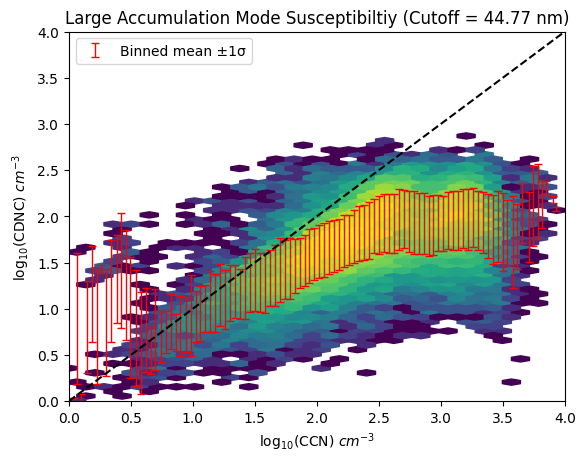

In [69]:
r = 30

Log_bins = np.linspace(0,4,101)
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])
# Binned means
x_mean = log_x \
    .groupby_bins(log_x, Log_bins).mean()

y_mean = log_y \
    .groupby_bins(log_x, Log_bins).mean()

# Binned standard deviations (errors)
x_err = log_x \
    .groupby_bins(log_x, Log_bins).std()

y_err = log_y \
    .groupby_bins(log_x, Log_bins).std()

# Binned means with error bars
plt.errorbar(
    x_mean,
    y_mean,
    yerr=y_err,
    fmt=' ',
    capsize=3,
    elinewidth=1.-2,
    label='Binned mean ±1σ',
    ecolor='r',
    
)
plt.hexbin(np.log10(Pairs_acc['CCN'].isel(radius=r)),
            np.log10(Pairs_acc['CDNC']),
            #c = 'orange',
            #alpha = 0.2
          bins = 'log',
           gridsize = [30,30]
            
          )
# Reference & formatting

plt.xlim([0, 4])
plt.ylim([0, 4])
plt.plot([0, 4], [0, 4], 'k--')

plt.xlabel('log$_{10}$(CCN) $cm^{-3}$')
plt.ylabel('log$_{10}$(CDNC) $cm^{-3}$')
plt.legend()
plt.title(f'Large Accumulation Mode Susceptibiltiy (Cutoff = {radii[r]*2:.2f} nm)')
plt.show()

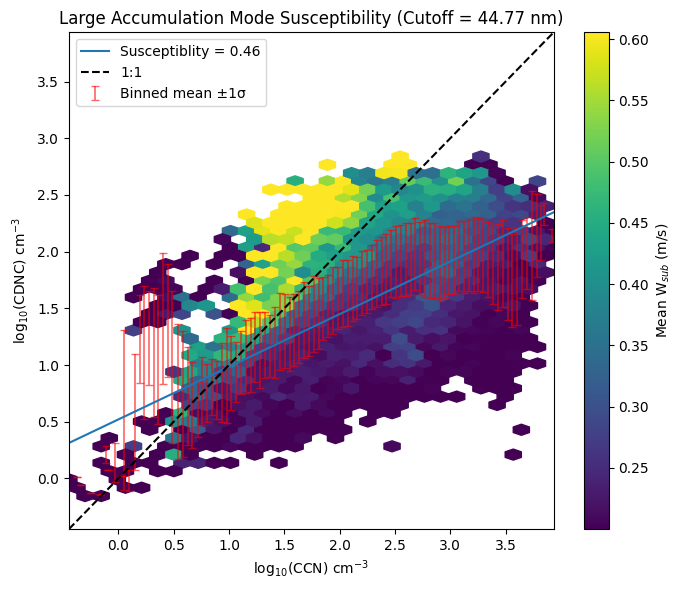

In [70]:
r = 30
wsub = Pairs_acc.Updraft
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin,ymin])
Graphmax = np.max([xmax,ymax])
Log_bins = np.linspace(xmin, xmax, 101)

# Binned means and stds
x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
x_err  = log_x.groupby_bins(log_x, Log_bins).std()
y_err  = log_y.groupby_bins(log_x, Log_bins).std()

fig, ax = plt.subplots(figsize=(7, 6)) 

# Hexbin first
hb = ax.hexbin(
    log_x,
    log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],  
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# Errorbar on top
ax.errorbar(
    x_mean,
    y_mean,
    yerr=y_err,
    fmt=' ',
    capsize=3,
    elinewidth=1.2,  
    label='Binned mean ±1σ',
    ecolor='r',
    color='r',
    alpha = .6,
)
plt.plot(Log_bins, 
         Log_bins*BigAccReg_ds.slope.isel(radius = r).sel(updraft_q = 'Total').values +
         BigAccReg_ds.intercept.isel(radius = r).sel(updraft_q = 'Total').values,
         label = f'Susceptiblity = {BigAccReg_ds.slope.isel(radius = r).sel(updraft_q = 'Total').values:.2f}')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')
ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Accumulation Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
ax.legend()
plt.tight_layout()
plt.show()

In [71]:
BigAccReg_noCHC_ds.radius.sel(radius = 150, method = 'nearest')

<xarray.DataArray 'radius' ()> Size: 8B
array(144.54397707)
Coordinates:
    radius   float64 8B 144.5

In [72]:
BigAccReg_noCHC_ds.radius

<xarray.DataArray 'radius' (radius: 61)> Size: 488B
array([  1.      ,   1.109175,   1.230269,   1.364583,   1.513561,   1.678804,
         1.862087,   2.06538 ,   2.290868,   2.540973,   2.818383,   3.126079,
         3.467369,   3.845918,   4.265795,   4.731513,   5.248075,   5.821032,
         6.456542,   7.161434,   7.943282,   8.810489,   9.772372,  10.839269,
        12.022644,  13.335214,  14.791084,  16.405898,  18.197009,  20.183664,
        22.387211,  24.831331,  27.542287,  30.549211,  33.884416,  37.58374 ,
        41.686938,  46.238102,  51.286138,  56.885293,  63.095734,  69.9842  ,
        77.624712,  86.099375,  95.499259, 105.925373, 117.489755, 130.316678,
       144.543977, 160.324539, 177.827941, 197.242274, 218.776162, 242.66101 ,
       269.15348 , 298.538262, 331.131121, 367.2823  , 407.380278, 451.855944,
       501.187234])
Coordinates:
  * radius   (radius) float64 488B 1.0 1.109 1.23 1.365 ... 407.4 451.9 501.2

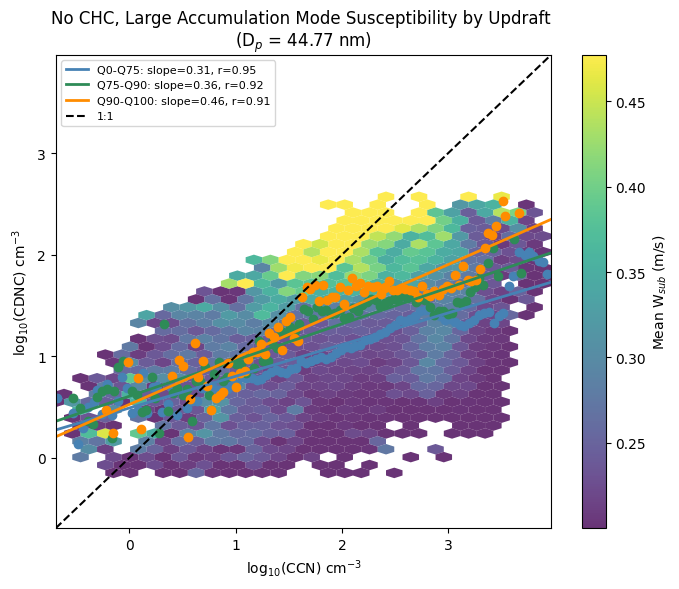

In [73]:
#r = (BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100')-BigAitReg_ds.slope.sel(updraft_q = 'Total')).argmax().values
#r = BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100').argmax().values


wsub = Pairs_ait.Updraft
log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait['CDNC'])

# --- Updraft quartile boundaries ---
q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, .9, 1.0])

quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])
plotline = np.linspace(Graphmin, Graphmax, 20)

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin background
hb = ax.hexbin(
    log_x, log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    edgecolors='none',
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    alpha=0.8,
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# --- Per-quartile regression ---
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    lx = log_x.where((Pairs_ait.Updraft >= lo) & (Pairs_ait.Updraft <= hi)).values
    ly = log_y.where((Pairs_ait.Updraft >= lo) & (Pairs_ait.Updraft <= hi)).values

    # Remove NaNs
    valid = np.isfinite(lx) & np.isfinite(ly)
    lx, ly = lx[valid], ly[valid]

    if len(lx) < 2:
        continue

    # Bin into 100 points using np.digitize
    Log_bins = np.linspace(np.min(lx), np.max(lx), 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])
    ly_mean = np.array([ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])

    # Drop empty bins (NaN means no data in that bin)
    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    if len(lx_mean) < 2:
        continue

    slope, intercept, r_value, p_value, std_err = stats.linregress(lx_mean, ly_mean)
    ax.scatter(lx_mean,ly_mean, color = color)
    ax.plot(plotline, plotline * slope + intercept,
            color=color, linewidth=2,
            label=f'{label}: slope={slope:.2f}, r={r_value:.2f}')



ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')

ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'No CHC, Large Accumulation Mode Susceptibility by Updraft \n'
             f'(D$_p$ = {radii[r]*2:.2f} nm)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

/tmp/ipykernel_2615068/1293865634.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


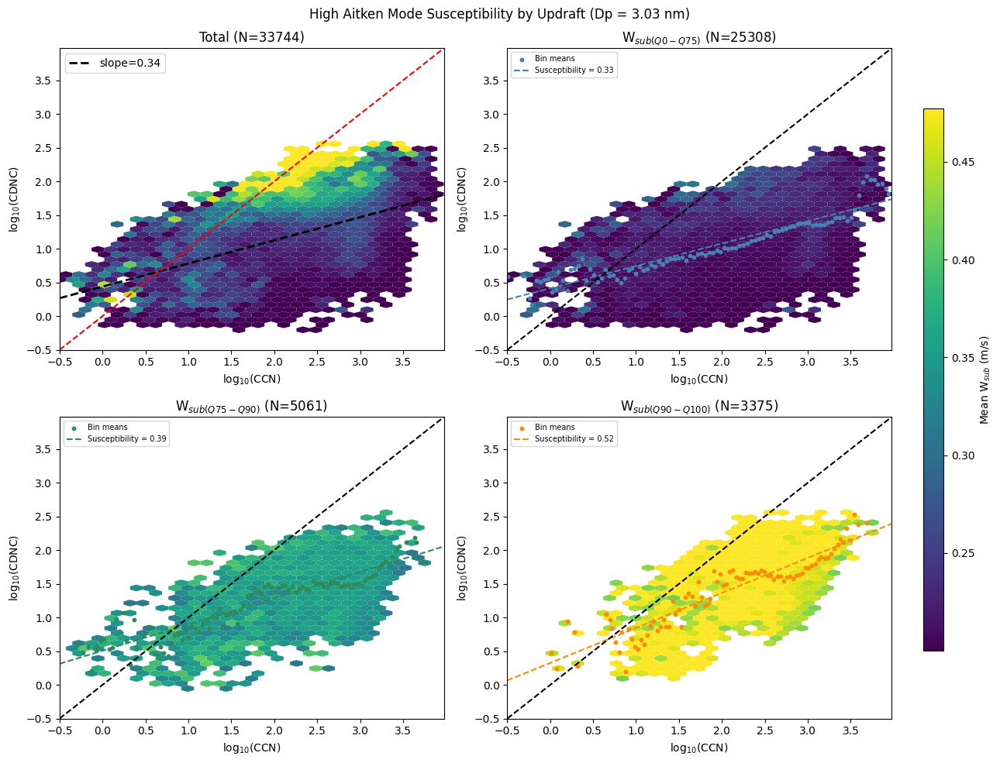

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
r = (BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100') - BigAitReg_ds.slope.sel(updraft_q = 'Total')).argmax().values
wsub = Pairs_ait.Updraft
log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])
plotline = np.linspace(Graphmin, Graphmax, 20)


# --- Updraft quartile boundaries ---
q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, .9, 1.0])

quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
axes = axes.flatten()

# --- GLOBAL COLOR SCALE ---
vmin = float(np.nanquantile(wsub, 0.05))
vmax = float(np.nanquantile(wsub, 0.95))

hb_ref = None  # for shared colorbar

# ---------- PANEL 0: TOTAL ----------
ax = axes[0]

valid = np.isfinite(log_x.values) & np.isfinite(log_y.values) & np.isfinite(wsub.values)

lx = log_x.values[valid]
ly = log_y.values[valid]
w  = wsub.values[valid]

n_points = len(lx)

hb = ax.hexbin(
    lx, ly,
    C=w,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=vmin, vmax=vmax,
    mincnt=1,
    edgecolors='none',
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
)

if hb_ref is None:
    hb_ref = hb

# Total regression
slope = BigAitReg_ds.slope.isel(radius=r).sel(updraft_q='Total').values
intercept = BigAitReg_ds.intercept.isel(radius=r).sel(updraft_q='Total').values

ax.plot(plotline, plotline * slope + intercept,
        color='black', linewidth=2,
        label=f'slope={slope:.2f}', ls = '--')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'r--')
ax.set_title(f'Total (N={n_points})')
ax.legend()


# ---------- QUARTILES ----------
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    ax = axes[i + 1]

    mask = ((Pairs_ait.Updraft >= lo) & (Pairs_ait.Updraft <= hi)).values

    lx = log_x.values[mask]
    ly = log_y.values[mask]
    w  = wsub.values[mask]

    valid = np.isfinite(lx) & np.isfinite(ly) & np.isfinite(w)
    lx, ly, w = lx[valid], ly[valid], w[valid]

    n_points = len(lx)

    if n_points < 2:
        continue

    # --- HEXBIN ---
    hb = ax.hexbin(
        lx, ly,
        C=w,
        reduce_C_function=np.mean,
        cmap='viridis',
        gridsize=[30, 30],
        vmin=vmin, vmax=vmax,
        mincnt=1,
        edgecolors='none',
        extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    )

    if hb_ref is None:
        hb_ref = hb

    xmin = np.nanmin(lx)
    xmax = np.nanmax(lx)

    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin == xmax:
        continue

    Log_bins = np.linspace(xmin, xmax, 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([
        lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    ly_mean = np.array([
        ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    ax.scatter(lx_mean, ly_mean, color=color, s=10, label='Bin means')


    slope_ds = BigAitReg_ds.slope.isel(radius=r).sel(updraft_q=label).values
    intercept_ds = BigAitReg_ds.intercept.isel(radius=r).sel(updraft_q=label).values

    ax.plot(plotline, plotline * slope_ds + intercept_ds,
            color=color, linestyle='--',
            label=f'Susceptibility = {slope_ds:.2f}')

    ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')

    ax.set_title(f'W$_{{sub ({label})}}$ (N={n_points})')
    ax.legend(fontsize=7)


# ---------- FORMAT ----------
for ax in axes:
    ax.set_xlim([Graphmin, Graphmax])
    ax.set_ylim([Graphmin, Graphmax])
    ax.set_xlabel('log$_{10}$(CCN)')
    ax.set_ylabel('log$_{10}$(CDNC)')


# ---------- OUTSIDE COLORBAR ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(hb_ref, cax=cbar_ax, label='Mean W$_{sub}$ (m/s)')

plt.suptitle(f'High Aitken Mode Susceptibility by Updraft (Dp = {radii[r]*2:.2f} nm)')
plt.tight_layout(rect=[0, 0, 0.9, 1])

plt.show()

/tmp/ipykernel_2615068/2664445319.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


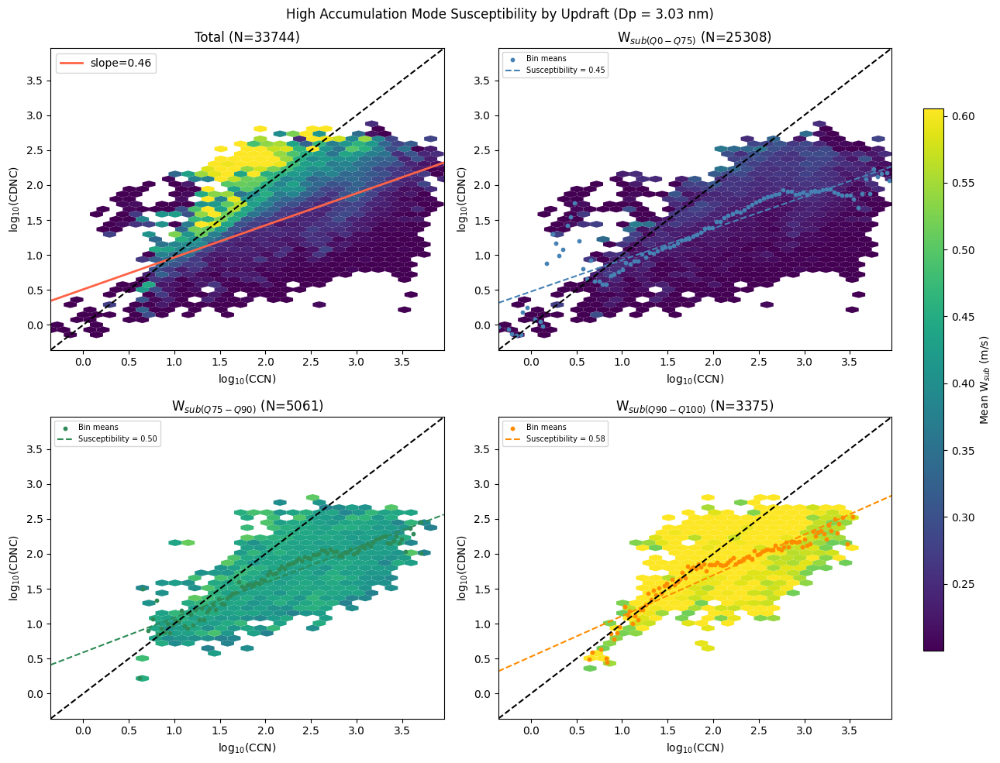

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
r = (BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100') - BigAitReg_ds.slope.sel(updraft_q = 'Total')).argmax().values
wsub = Pairs_acc.Updraft
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])
plotline = np.linspace(Graphmin, Graphmax, 20)

# --- Updraft quartile boundaries ---
q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, .9, 1.0])

quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
axes = axes.flatten()

# --- GLOBAL COLOR SCALE ---
vmin = float(np.nanquantile(wsub, 0.05))
vmax = float(np.nanquantile(wsub, 0.95))

hb_ref = None  # for shared colorbar

# ---------- PANEL 0: TOTAL ----------
ax = axes[0]

valid = np.isfinite(log_x.values) & np.isfinite(log_y.values) & np.isfinite(wsub.values)

lx = log_x.values[valid]
ly = log_y.values[valid]
w  = wsub.values[valid]

n_points = len(lx)

hb = ax.hexbin(
    lx, ly,
    C=w,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=vmin, vmax=vmax,
    mincnt=1,
    edgecolors='none',
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
)

if hb_ref is None:
    hb_ref = hb

# Total regression
slope = BigAccReg_ds.slope.isel(radius=r).sel(updraft_q='Total').values
intercept = BigAccReg_ds.intercept.isel(radius=r).sel(updraft_q='Total').values

ax.plot(plotline, plotline * slope + intercept,
        color='tomato', linewidth=2,
        label=f'slope={slope:.2f}')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')
ax.set_title(f'Total (N={n_points})')
ax.legend()


# ---------- QUARTILES ----------
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    ax = axes[i + 1]

    mask = ((Pairs_acc.Updraft >= lo) & (Pairs_acc.Updraft <= hi)).values

    lx = log_x.values[mask]
    ly = log_y.values[mask]
    w  = wsub.values[mask]

    valid = np.isfinite(lx) & np.isfinite(ly) & np.isfinite(w)
    lx, ly, w = lx[valid], ly[valid], w[valid]

    n_points = len(lx)

    if n_points < 2:
        continue

    # --- HEXBIN ---
    hb = ax.hexbin(
        lx, ly,
        C=w,
        reduce_C_function=np.mean,
        cmap='viridis',
        gridsize=[30, 30],
        vmin=vmin, vmax=vmax,
        mincnt=1,
        edgecolors='none',
        extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    )

    if hb_ref is None:
        hb_ref = hb

    xmin = np.nanmin(lx)
    xmax = np.nanmax(lx)

    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin == xmax:
        continue

    Log_bins = np.linspace(xmin, xmax, 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([
        lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    ly_mean = np.array([
        ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    ax.scatter(lx_mean, ly_mean, color=color, s=10, label='Bin means')


    slope_ds = BigAccReg_ds.slope.isel(radius=r).sel(updraft_q=label).values
    intercept_ds = BigAccReg_ds.intercept.isel(radius=r).sel(updraft_q=label).values

    ax.plot(plotline, plotline * slope_ds + intercept_ds,
            color=color, linestyle='--',
            label=f'Susceptibility = {slope_ds:.2f}')

    ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')

    ax.set_title(f'W$_{{sub ({label})}}$ (N={n_points})')
    ax.legend(fontsize=7)


# ---------- FORMAT ----------
for ax in axes:
    ax.set_xlim([Graphmin, Graphmax])
    ax.set_ylim([Graphmin, Graphmax])
    ax.set_xlabel('log$_{10}$(CCN)')
    ax.set_ylabel('log$_{10}$(CDNC)')


# ---------- OUTSIDE COLORBAR ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(hb_ref, cax=cbar_ax, label='Mean W$_{sub}$ (m/s)')

plt.suptitle(f'High Accumulation Mode Susceptibility by Updraft (Dp = {radii[r]*2:.2f} nm)')
plt.tight_layout(rect=[0, 0, 0.9, 1])

plt.show()

/tmp/ipykernel_2615068/2684047851.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


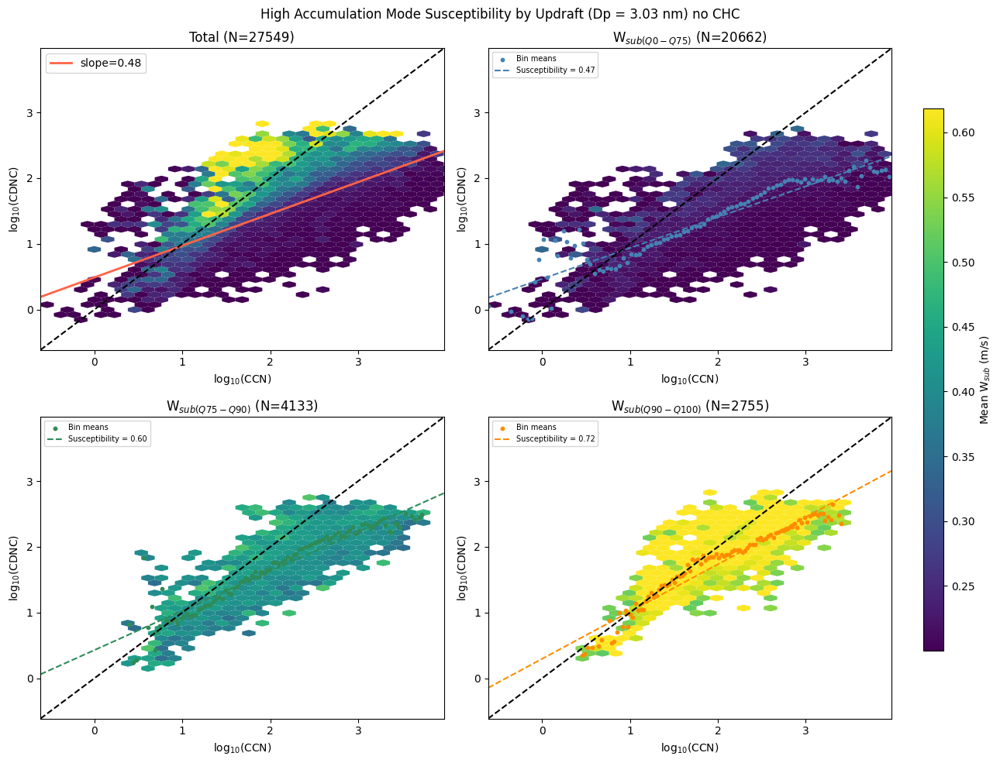

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
r = (BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100') - BigAitReg_ds.slope.sel(updraft_q = 'Total')).argmax().values
wsub = Pairs_acc_noCHC.Updraft
log_x = np.log10(Pairs_acc_noCHC['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc_noCHC['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])
plotline = np.linspace(Graphmin, Graphmax, 20)

# --- Updraft quartile boundaries ---
q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, .9, 1.0])

quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
axes = axes.flatten()

# --- GLOBAL COLOR SCALE ---
vmin = float(np.nanquantile(wsub, 0.05))
vmax = float(np.nanquantile(wsub, 0.95))

hb_ref = None  # for shared colorbar

# ---------- PANEL 0: TOTAL ----------
ax = axes[0]

valid = np.isfinite(log_x.values) & np.isfinite(log_y.values) & np.isfinite(wsub.values)

lx = log_x.values[valid]
ly = log_y.values[valid]
w  = wsub.values[valid]

n_points = len(lx)

hb = ax.hexbin(
    lx, ly,
    C=w,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=vmin, vmax=vmax,
    mincnt=1,
    edgecolors='none',
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
)

if hb_ref is None:
    hb_ref = hb

# Total regression
slope = BigAccReg_noCHC_ds.slope.isel(radius=r).sel(updraft_q='Total').values
intercept = BigAccReg_noCHC_ds.intercept.isel(radius=r).sel(updraft_q='Total').values

ax.plot(plotline, plotline * slope + intercept,
        color='tomato', linewidth=2,
        label=f'slope={slope:.2f}')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')
ax.set_title(f'Total (N={n_points})')
ax.legend()


# ---------- QUARTILES ----------
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    ax = axes[i + 1]

    mask = ((Pairs_acc_noCHC.Updraft >= lo) & (Pairs_acc_noCHC.Updraft <= hi)).values

    lx = log_x.values[mask]
    ly = log_y.values[mask]
    w  = wsub.values[mask]

    valid = np.isfinite(lx) & np.isfinite(ly) & np.isfinite(w)
    lx, ly, w = lx[valid], ly[valid], w[valid]

    n_points = len(lx)

    if n_points < 2:
        continue

    # --- HEXBIN ---
    hb = ax.hexbin(
        lx, ly,
        C=w,
        reduce_C_function=np.mean,
        cmap='viridis',
        gridsize=[30, 30],
        vmin=vmin, vmax=vmax,
        mincnt=1,
        edgecolors='none',
        extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    )

    if hb_ref is None:
        hb_ref = hb

    xmin = np.nanmin(lx)
    xmax = np.nanmax(lx)

    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin == xmax:
        continue

    Log_bins = np.linspace(xmin, xmax, 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([
        lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    ly_mean = np.array([
        ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    ax.scatter(lx_mean, ly_mean, color=color, s=10, label='Bin means')


    slope_ds = BigAccReg_noCHC_ds.slope.isel(radius=r).sel(updraft_q=label).values
    intercept_ds = BigAccReg_noCHC_ds.intercept.isel(radius=r).sel(updraft_q=label).values

    ax.plot(plotline, plotline * slope_ds + intercept_ds,
            color=color, linestyle='--',
            label=f'Susceptibility = {slope_ds:.2f}')

    ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')

    ax.set_title(f'W$_{{sub ({label})}}$ (N={n_points})')
    ax.legend(fontsize=7)


# ---------- FORMAT ----------
for ax in axes:
    ax.set_xlim([Graphmin, Graphmax])
    ax.set_ylim([Graphmin, Graphmax])
    ax.set_xlabel('log$_{10}$(CCN)')
    ax.set_ylabel('log$_{10}$(CDNC)')


# ---------- OUTSIDE COLORBAR ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(hb_ref, cax=cbar_ax, label='Mean W$_{sub}$ (m/s)')

plt.suptitle(f'High Accumulation Mode Susceptibility by Updraft (Dp = {radii[r]*2:.2f} nm) no CHC')
plt.tight_layout(rect=[0, 0, 0.9, 1])

plt.show()

/tmp/ipykernel_2615068/2255966787.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


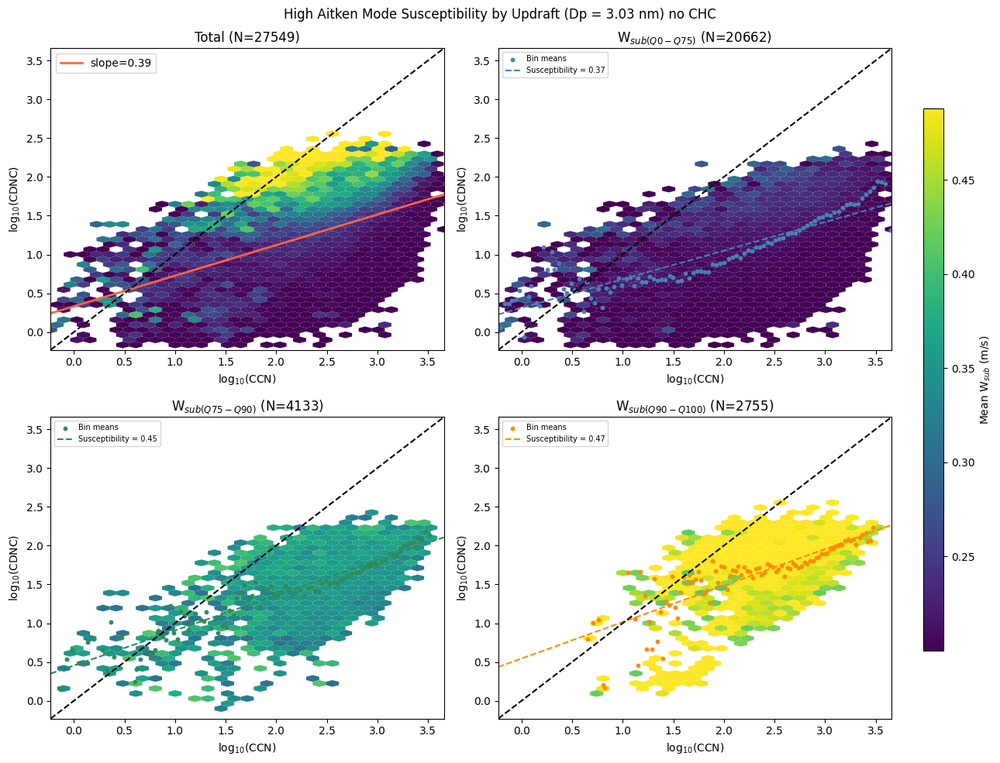

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
r = (BigAitReg_ds.slope.sel(updraft_q = 'Q90-Q100') - BigAitReg_ds.slope.sel(updraft_q = 'Total')).argmax().values
wsub = Pairs_ait_noCHC.Updraft
log_x = np.log10(Pairs_ait_noCHC['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait_noCHC['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])
plotline = np.linspace(Graphmin, Graphmax, 20)

# --- Updraft quartile boundaries ---
q0, q75, q90, q100 = np.nanquantile(wsub, [0, 0.75, .9, 1.0])

quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0-Q75', 'Q75-Q90', 'Q90-Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
axes = axes.flatten()

# --- GLOBAL COLOR SCALE ---
vmin = float(np.nanquantile(wsub, 0.05))
vmax = float(np.nanquantile(wsub, 0.95))

hb_ref = None  # for shared colorbar

# ---------- PANEL 0: TOTAL ----------
ax = axes[0]

valid = np.isfinite(log_x.values) & np.isfinite(log_y.values) & np.isfinite(wsub.values)

lx = log_x.values[valid]
ly = log_y.values[valid]
w  = wsub.values[valid]

n_points = len(lx)

hb = ax.hexbin(
    lx, ly,
    C=w,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=vmin, vmax=vmax,
    mincnt=1,
    edgecolors='none',
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
)

if hb_ref is None:
    hb_ref = hb

# Total regression
slope = BigAitReg_noCHC_ds.slope.isel(radius=r).sel(updraft_q='Total').values
intercept = BigAitReg_noCHC_ds.intercept.isel(radius=r).sel(updraft_q='Total').values

ax.plot(plotline, plotline * slope + intercept,
        color='tomato', linewidth=2,
        label=f'slope={slope:.2f}')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')
ax.set_title(f'Total (N={n_points})')
ax.legend()


# ---------- QUARTILES ----------
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    ax = axes[i + 1]

    mask = ((Pairs_ait_noCHC.Updraft >= lo) & (Pairs_ait_noCHC.Updraft <= hi)).values

    lx = log_x.values[mask]
    ly = log_y.values[mask]
    w  = wsub.values[mask]

    valid = np.isfinite(lx) & np.isfinite(ly) & np.isfinite(w)
    lx, ly, w = lx[valid], ly[valid], w[valid]

    n_points = len(lx)

    if n_points < 2:
        continue

    # --- HEXBIN ---
    hb = ax.hexbin(
        lx, ly,
        C=w,
        reduce_C_function=np.mean,
        cmap='viridis',
        gridsize=[30, 30],
        vmin=vmin, vmax=vmax,
        mincnt=1,
        edgecolors='none',
        extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    )

    if hb_ref is None:
        hb_ref = hb

    xmin = np.nanmin(lx)
    xmax = np.nanmax(lx)

    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin == xmax:
        continue

    Log_bins = np.linspace(xmin, xmax, 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([
        lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    ly_mean = np.array([
        ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
        for b in range(1, len(Log_bins))
    ])

    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    ax.scatter(lx_mean, ly_mean, color=color, s=10, label='Bin means')


    slope_ds = BigAitReg_noCHC_ds.slope.isel(radius=r).sel(updraft_q=label).values
    intercept_ds = BigAitReg_noCHC_ds.intercept.isel(radius=r).sel(updraft_q=label).values

    ax.plot(plotline, plotline * slope_ds + intercept_ds,
            color=color, linestyle='--',
            label=f'Susceptibility = {slope_ds:.2f}')

    ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--')

    ax.set_title(f'W$_{{sub ({label})}}$ (N={n_points})')
    ax.legend(fontsize=7)


# ---------- FORMAT ----------
for ax in axes:
    ax.set_xlim([Graphmin, Graphmax])
    ax.set_ylim([Graphmin, Graphmax])
    ax.set_xlabel('log$_{10}$(CCN)')
    ax.set_ylabel('log$_{10}$(CDNC)')


# ---------- OUTSIDE COLORBAR ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(hb_ref, cax=cbar_ax, label='Mean W$_{sub}$ (m/s)')

plt.suptitle(f'High Aitken Mode Susceptibility by Updraft (Dp = {radii[r]*2:.2f} nm) no CHC')
plt.tight_layout(rect=[0, 0, 0.9, 1])

plt.show()

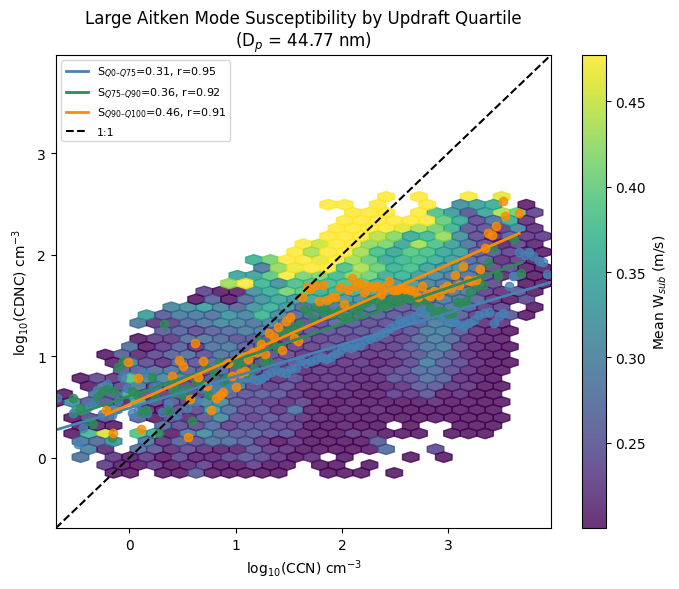

In [78]:
r = 30
wsub = Pairs_ait.Updraft
log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait['CDNC'])

# --- Updraft quartile boundaries ---
q75, q90, q100 = np.nanquantile(wsub, [0.75, .9, 1.0])
q0 = 0.2
quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0–Q75', 'Q75–Q90', 'Q90–Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin background
hb = ax.hexbin(
    log_x, log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    alpha=0.8,
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# --- Per-quartile regression ---
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    lx = log_x.where((Pairs_ait.Updraft >= lo) & (Pairs_ait.Updraft <= hi)).values
    ly = log_y.where((Pairs_ait.Updraft >= lo) & (Pairs_ait.Updraft <= hi)).values

    # Remove NaNs
    valid = np.isfinite(lx) & np.isfinite(ly)
    lx, ly = lx[valid], ly[valid]

    if len(lx) < 2:
        continue

    # Bin into 100 points using np.digitize
    Log_bins = np.linspace(np.min(lx), np.max(lx), 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])
    ly_mean = np.array([ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])

    # Drop empty bins (NaN means no data in that bin)
    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    if len(lx_mean) < 2:
        continue

    slope, intercept, r_value, p_value, std_err = stats.linregress(lx_mean, ly_mean)
    ax.scatter(lx_mean,ly_mean, color = color, alpha = 0.8)
    ax.plot(Log_bins, Log_bins * slope + intercept,
            color=color, linewidth=2,
            label=f'S$_{{{label}}}$={slope:.2f}, r={r_value:.2f}')

# 1:1 reference
ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')

ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Aitken Mode Susceptibility by Updraft Quartile\n'
             f'(D$_p$ = {radii[r]*2:.2f} nm)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

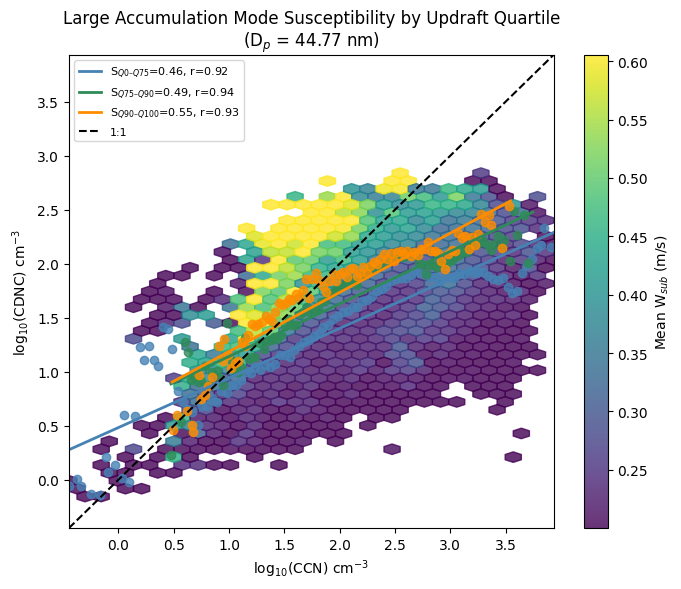

In [79]:
r = 30
wsub = Pairs_acc.Updraft
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])

# --- Updraft quartile boundaries ---
q75, q90, q100 = np.nanquantile(wsub, [0.75, .9, 1.0])
q0 = 0.2
quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0–Q75', 'Q75–Q90', 'Q90–Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin background
hb = ax.hexbin(
    log_x, log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    alpha=0.8,
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# --- Per-quartile regression ---
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    lx = log_x.where((Pairs_acc.Updraft >= lo) & (Pairs_acc.Updraft <= hi)).values
    ly = log_y.where((Pairs_acc.Updraft >= lo) & (Pairs_acc.Updraft <= hi)).values

    # Remove NaNs
    valid = np.isfinite(lx) & np.isfinite(ly)
    lx, ly = lx[valid], ly[valid]

    if len(lx) < 2:
        continue

    # Bin into 100 points using np.digitize
    Log_bins = np.linspace(np.min(lx), np.max(lx), 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])
    ly_mean = np.array([ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])

    # Drop empty bins (NaN means no data in that bin)
    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    if len(lx_mean) < 2:
        continue

    slope, intercept, r_value, p_value, std_err = stats.linregress(lx_mean, ly_mean)
    ax.scatter(lx_mean,ly_mean, color = color, alpha = 0.8)
    ax.plot(Log_bins, Log_bins * slope + intercept,
            color=color, linewidth=2,
            label=f'S$_{{{label}}}$={slope:.2f}, r={r_value:.2f}')

# 1:1 reference
ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')

ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Accumulation Mode Susceptibility by Updraft Quartile\n'
             f'(D$_p$ = {radii[r]*2:.2f} nm)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

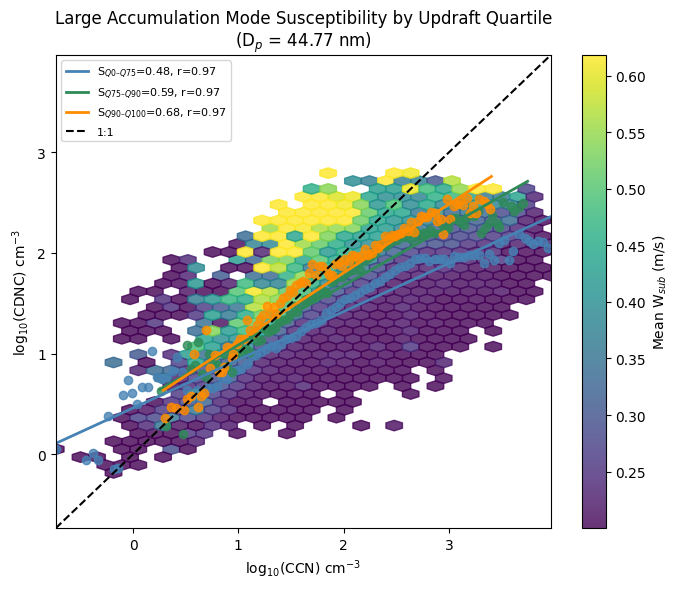

In [80]:
r = 30
wsub = Pairs_acc_noCHC.Updraft
log_x = np.log10(Pairs_acc_noCHC['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc_noCHC['CDNC'])

# --- Updraft quartile boundaries ---
q75, q90, q100 = np.nanquantile(wsub, [0.75, .9, 1.0])
q0 = 0.2
quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0–Q75', 'Q75–Q90', 'Q90–Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin background
hb = ax.hexbin(
    log_x, log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    alpha=0.8,
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# --- Per-quartile regression ---
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    lx = log_x.where((Pairs_acc_noCHC.Updraft >= lo) & (Pairs_acc_noCHC.Updraft <= hi)).values
    ly = log_y.where((Pairs_acc_noCHC.Updraft >= lo) & (Pairs_acc_noCHC.Updraft <= hi)).values

    # Remove NaNs
    valid = np.isfinite(lx) & np.isfinite(ly)
    lx, ly = lx[valid], ly[valid]

    if len(lx) < 2:
        continue

    # Bin into 100 points using np.digitize
    Log_bins = np.linspace(np.min(lx), np.max(lx), 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])
    ly_mean = np.array([ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])

    # Drop empty bins (NaN means no data in that bin)
    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    if len(lx_mean) < 2:
        continue

    slope, intercept, r_value, p_value, std_err = stats.linregress(lx_mean, ly_mean)
    ax.scatter(lx_mean,ly_mean, color = color, alpha = 0.8)
    ax.plot(Log_bins, Log_bins * slope + intercept,
            color=color, linewidth=2,
            label=f'S$_{{{label}}}$={slope:.2f}, r={r_value:.2f}')

# 1:1 reference
ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')

ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Accumulation Mode Susceptibility by Updraft Quartile\n'
             f'(D$_p$ = {radii[r]*2:.2f} nm)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

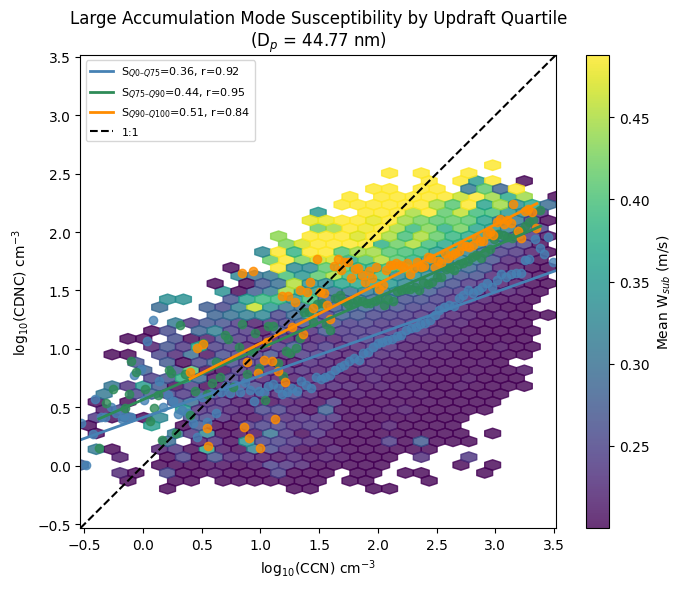

In [81]:
r = 30
wsub = Pairs_ait_noCHC.Updraft
log_x = np.log10(Pairs_ait_noCHC['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait_noCHC['CDNC'])

# --- Updraft quartile boundaries ---
q75, q90, q100 = np.nanquantile(wsub, [0.75, .9, 1.0])
q0 = 0.2
quartile_bins = [q0, q75, q90, q100]
quartile_labels = ['Q0–Q75', 'Q75–Q90', 'Q90–Q100']
colors = ['steelblue', 'seagreen', 'darkorange']

xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin, ymin])
Graphmax = np.max([xmax, ymax])

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin background
hb = ax.hexbin(
    log_x, log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    alpha=0.8,
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# --- Per-quartile regression ---
for i, (lo, hi, label, color) in enumerate(zip(
        quartile_bins[:-1], quartile_bins[1:], quartile_labels, colors)):

    lx = log_x.where((Pairs_ait_noCHC.Updraft >= lo) & (Pairs_ait_noCHC.Updraft <= hi)).values
    ly = log_y.where((Pairs_ait_noCHC.Updraft >= lo) & (Pairs_ait_noCHC.Updraft <= hi)).values

    # Remove NaNs
    valid = np.isfinite(lx) & np.isfinite(ly)
    lx, ly = lx[valid], ly[valid]

    if len(lx) < 2:
        continue

    # Bin into 100 points using np.digitize
    Log_bins = np.linspace(np.min(lx), np.max(lx), 101)
    bin_idx = np.digitize(lx, Log_bins)

    lx_mean = np.array([lx[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])
    ly_mean = np.array([ly[bin_idx == b].mean() if np.any(bin_idx == b) else np.nan
                        for b in range(1, 101)])

    # Drop empty bins (NaN means no data in that bin)
    valid_bins = np.isfinite(lx_mean) & np.isfinite(ly_mean)
    lx_mean, ly_mean = lx_mean[valid_bins], ly_mean[valid_bins]

    if len(lx_mean) < 2:
        continue

    slope, intercept, r_value, p_value, std_err = stats.linregress(lx_mean, ly_mean)
    ax.scatter(lx_mean,ly_mean, color = color, alpha = 0.8)
    ax.plot(Log_bins, Log_bins * slope + intercept,
            color=color, linewidth=2,
            label=f'S$_{{{label}}}$={slope:.2f}, r={r_value:.2f}')

# 1:1 reference
ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')

ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Accumulation Mode Susceptibility by Updraft Quartile\n'
             f'(D$_p$ = {radii[r]*2:.2f} nm)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

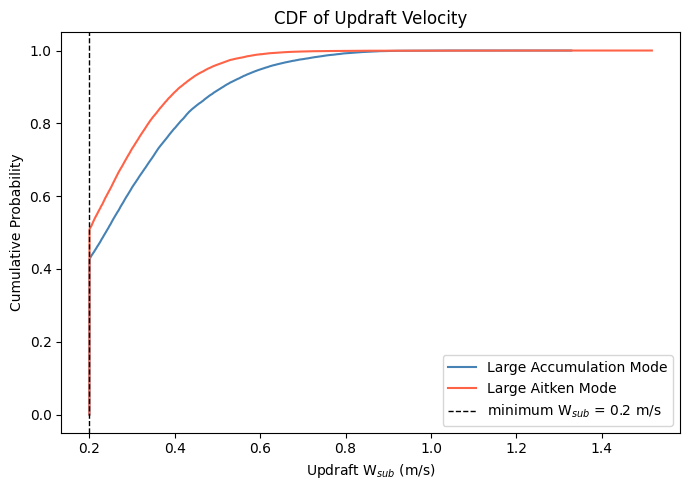

In [82]:
fig, ax = plt.subplots(figsize=(7, 5))

for data, label, color in [
    (Pairs_acc.Updraft.values, 'Large Accumulation Mode', 'steelblue'),
    (Pairs_ait.Updraft.values, 'Large Aitken Mode', 'tomato'),
]:
    vals = data[np.isfinite(data)]
    vals_sorted = np.sort(vals)
    cdf = np.arange(1, len(vals_sorted) + 1) / len(vals_sorted)
    ax.plot(vals_sorted, cdf, label=label, color=color)

ax.axvline(0.2, color='k', linestyle='--', linewidth=1, label='minimum W$_{sub}$ = 0.2 m/s')
ax.set_xlabel('Updraft W$_{sub}$ (m/s)')
ax.set_ylabel('Cumulative Probability')
ax.set_title('CDF of Updraft Velocity')
ax.legend()
plt.tight_layout()
plt.show()

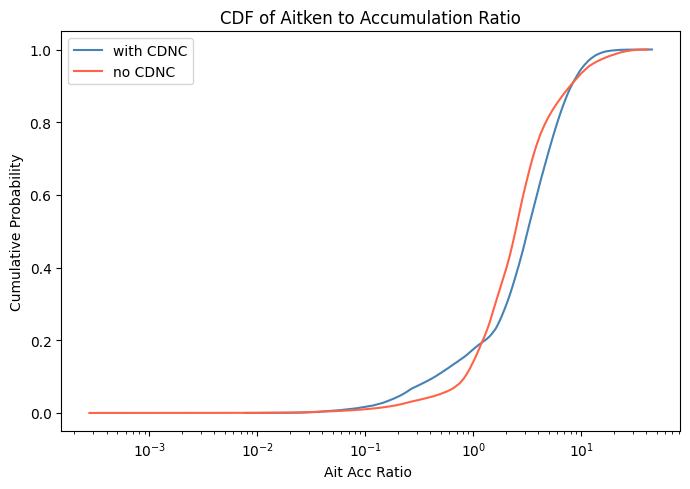

In [83]:
fig, ax = plt.subplots(figsize=(7, 5))

for data, label, color in [
    (AitAccRatio.values, 'with CDNC', 'steelblue'),
    (AitAccRatio2.values, 'no CDNC', 'tomato'),
]:
    vals = data[np.isfinite(data)]
    vals_sorted = np.sort(vals)
    cdf = np.arange(1, len(vals_sorted) + 1) / len(vals_sorted)
    ax.plot(vals_sorted, cdf, label=label, color=color)
ax.set_xscale('log')
ax.set_xlabel('Ait Acc Ratio ')
ax.set_ylabel('Cumulative Probability')
ax.set_title('CDF of Aitken to Accumulation Ratio')
ax.legend()
plt.tight_layout()
plt.show()

In [84]:
def updraftSusGraph(radius_idx, Pairs_da, Reg_ds, ax=None, fig=None):
    r = radius_idx
    wsub = Pairs_da.Updraft
    log_x = np.log10(Pairs_da['CCN'].isel(radius=r))
    log_y = np.log10(Pairs_da['CDNC'])
    xmin = log_x.min().values
    xmax = log_x.max().values
    ymin = log_y.min().values
    ymax = log_y.max().values
    Graphmin = np.min([xmin, ymin])
    Graphmax = np.max([xmax, ymax])
    Log_bins = np.linspace(xmin, xmax, 101)

    # Binned means and stds
    x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
    y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
    x_err  = log_x.groupby_bins(log_x, Log_bins).std()
    y_err  = log_y.groupby_bins(log_x, Log_bins).std()

    # Create fig/ax only if not provided
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 6))
    standalone = fig is None  # if fig still None after above, something's wrong

    # Hexbin first
    hb = ax.hexbin(
        log_x, log_y,
        C=wsub,
        reduce_C_function=np.mean,
        cmap='viridis',
        gridsize=[30, 30],
        vmin=float(np.quantile(wsub, 0.05)),
        vmax=float(np.quantile(wsub, 0.95)),
        mincnt=1,
        extent=[Graphmin, Graphmax, Graphmin, Graphmax],
    )
    fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

    # Errorbar on top
    ax.errorbar(
        x_mean, y_mean, yerr=y_err,
        fmt=' ', capsize=3, elinewidth=1.2,
        label='Binned mean ±1σ', ecolor='r', color='r', alpha=0.6,
    )

    # Regression line
    slope     = Reg_ds.slope.isel(radius=r).sel(updraft_q = 'Total').values
    intercept = Reg_ds.intercept.isel(radius=r).sel(updraft_q = 'Total').values
    ax.plot(Log_bins, Log_bins * slope + intercept,
            label=f'Susceptibility = {slope:.2f}')

    ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')
    ax.set_xlim([Graphmin, Graphmax])
    ax.set_ylim([Graphmin, Graphmax])
    ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
    ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
    ax.set_title(f'Large Accumulation Mode Susceptibility (D$_p$ = {radii[r]*2:.2f} nm)')
    ax.legend(fontsize=8)

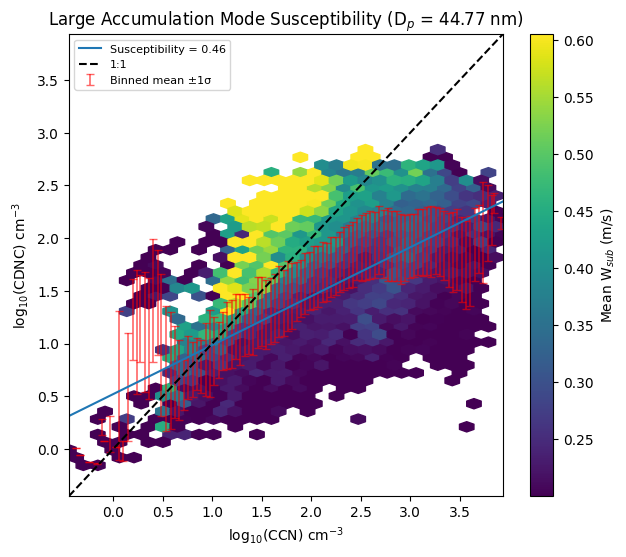

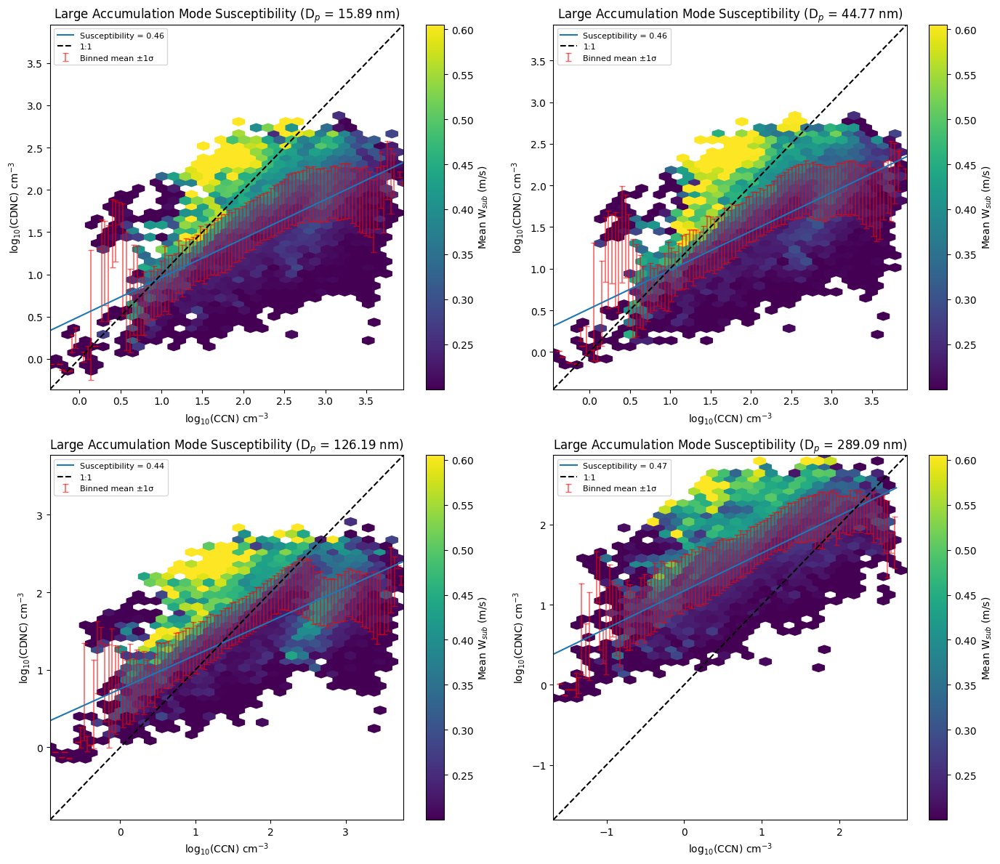

In [85]:
# --- Standalone (unchanged behaviour) ---
updraftSusGraph(30, Pairs_acc, BigAccReg_ds)
# --- Subplot mode ---
r_values = [20, 30, 40, 48]
n = len(r_values)
ncols = int(np.ceil(np.sqrt(n)))
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7*ncols, 6*nrows))
axes = np.array(axes).flatten()

for ax, r in zip(axes, r_values):
    updraftSusGraph(r, Pairs_acc, BigAccReg_ds, ax=ax, fig=fig)

for ax in axes[n:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

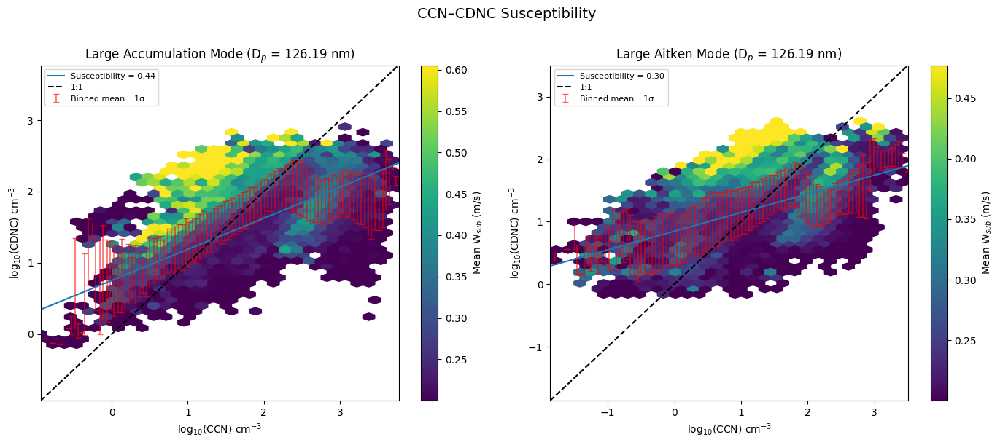

In [86]:
r = 40
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

updraftSusGraph(r, Pairs_acc, BigAccReg_ds, ax=axes[0], fig=fig)
updraftSusGraph(r, Pairs_ait, BigAitReg_ds, ax=axes[1], fig=fig)

axes[0].set_title(f'Large Accumulation Mode (D$_p$ = {radii[r]*2:.2f} nm)')
axes[1].set_title(f'Large Aitken Mode (D$_p$ = {radii[r]*2:.2f} nm)')

plt.suptitle(f'CCN–CDNC Susceptibility', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

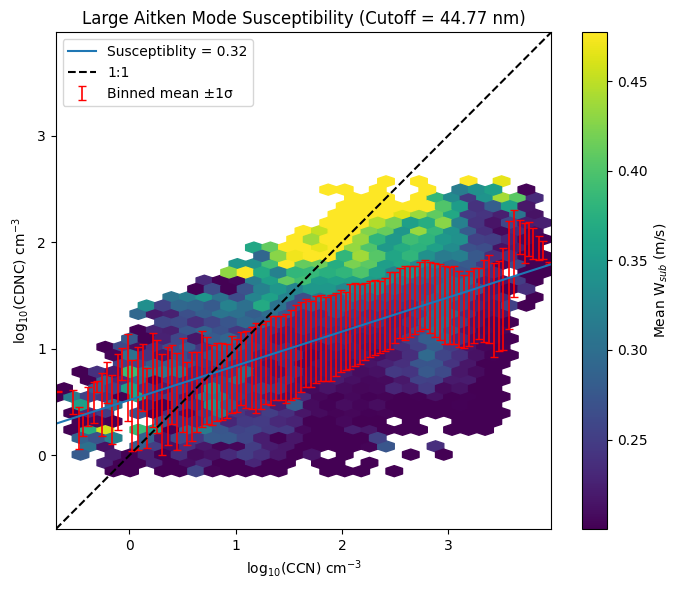

In [87]:
r = 30
wsub = Pairs_ait.Updraft
log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Graphmin = np.min([xmin,ymin])
Graphmax = np.max([xmax,ymax])

Log_bins = np.linspace(xmin, xmax, 101)

# Binned means and stds
x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
x_err  = log_x.groupby_bins(log_x, Log_bins).std()
y_err  = log_y.groupby_bins(log_x, Log_bins).std()

fig, ax = plt.subplots(figsize=(7, 6)) 

# Hexbin first
hb = ax.hexbin(
    log_x,
    log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[Graphmin, Graphmax, Graphmin, Graphmax],  
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# Errorbar on top
ax.errorbar(
    x_mean,
    y_mean,
    yerr=y_err,
    fmt=' ',
    capsize=3,
    elinewidth=1.2,  
    label='Binned mean ±1σ',
    ecolor='r',
    color='r',
)
plt.plot(Log_bins, Log_bins*BigAitReg_ds.slope.isel(radius = r).sel(updraft_q = 'Total').values +
         BigAitReg_ds.intercept.isel(radius = r).sel(updraft_q = 'Total').values,label = f'Susceptiblity = {BigAitReg_ds.slope.isel(radius = r).sel(updraft_q = 'Total').values:.2f}')

ax.plot([Graphmin, Graphmax], [Graphmin, Graphmax], 'k--', label='1:1')
ax.set_xlim([Graphmin, Graphmax])
ax.set_ylim([Graphmin, Graphmax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Aitken Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
ax.legend()
plt.tight_layout()
plt.show()

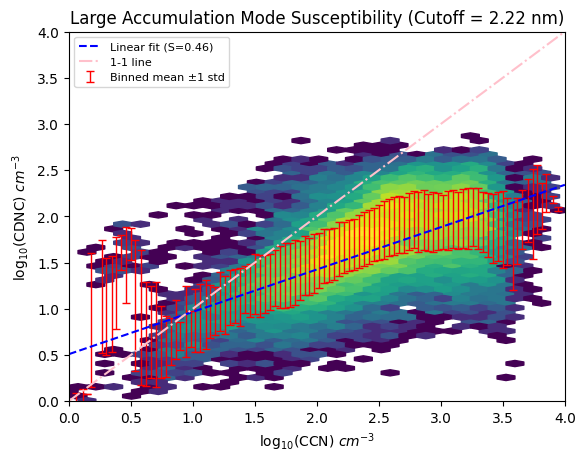

In [88]:
r = 1
Log_bins = np.linspace(0, 4, 101)
log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
log_y = np.log10(Pairs_acc['CDNC'])

# Binned means
x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
x_err  = log_x.groupby_bins(log_x, Log_bins).std()
y_err  = log_y.groupby_bins(log_x, Log_bins).std()

fig, ax = plt.subplots()
ax.hexbin(log_x, log_y, bins='log', gridsize=[30, 30])
ax.errorbar(
    x_mean, y_mean, yerr=y_err,
    fmt=' ', capsize=3, elinewidth=1,
    label='Binned mean ±1 std', ecolor='r',
)

# --- Regression lines ---
slope     = BigAccReg_ds["slope"].isel(radius=r).sel(updraft_q = 'Total').values
intercept = BigAccReg_ds["intercept"].isel(radius=r).sel(updraft_q = 'Total').values


# Overall linear fit
x_line = np.linspace(0, 4, 100)
ax.plot(x_line, slope * x_line + intercept, 'b--', linewidth=1.5,
        label=f'Linear fit (S={slope:.2f})')



# Formatting
ax.set_xlim([0, 4])
ax.set_ylim([0, 4])
ax.plot([0, 4], [0, 4], '-.', c = 'pink', label = '1-1 line')
ax.set_xlabel('log$_{10}$(CCN) $cm^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) $cm^{-3}$')
ax.legend(fontsize=8)
ax.set_title(f'Large Accumulation Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
plt.show()

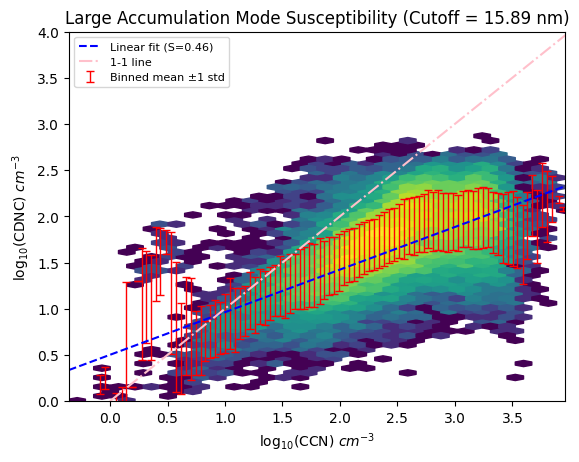

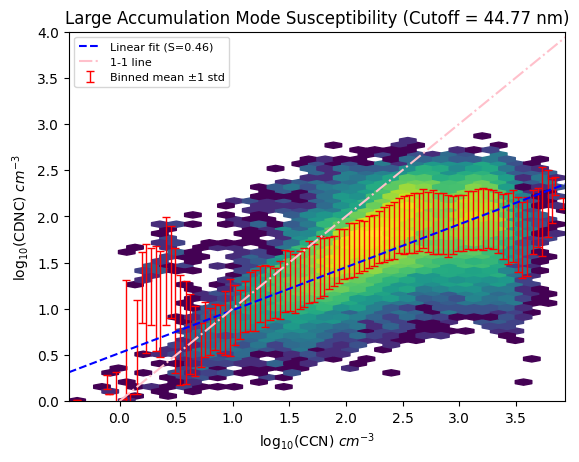

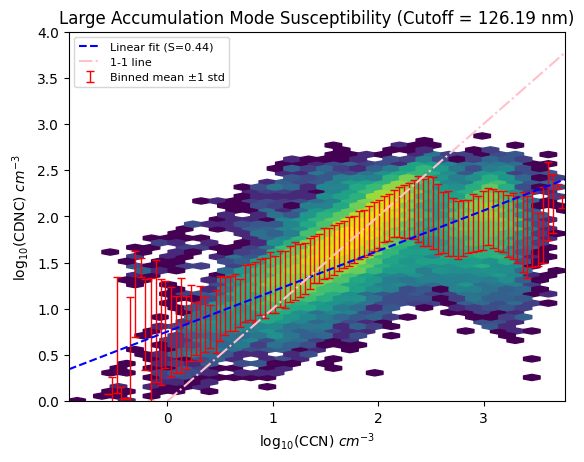

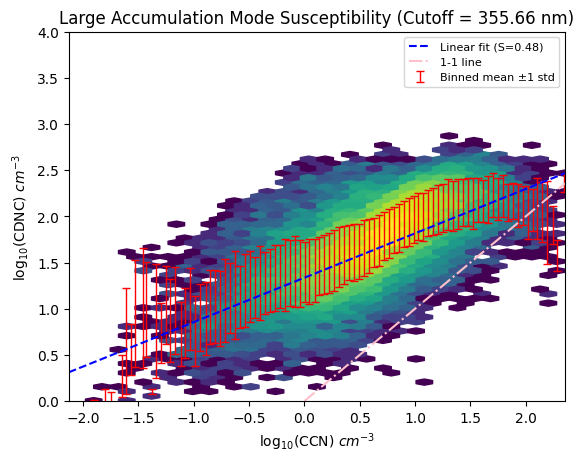

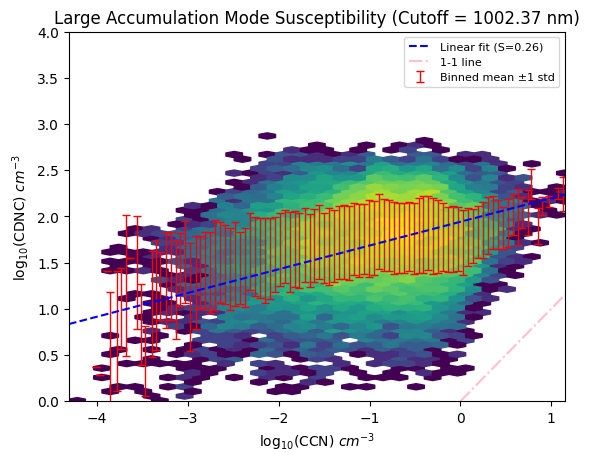

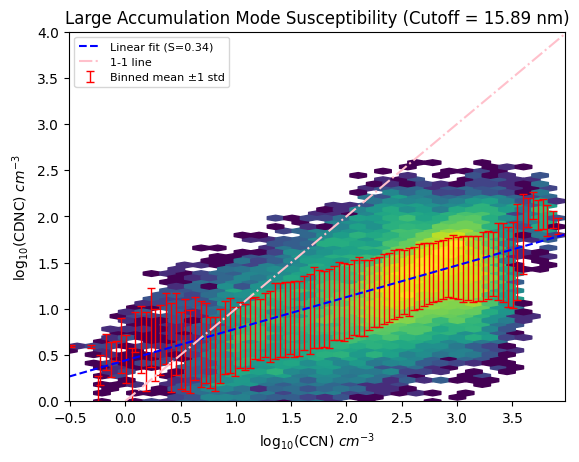

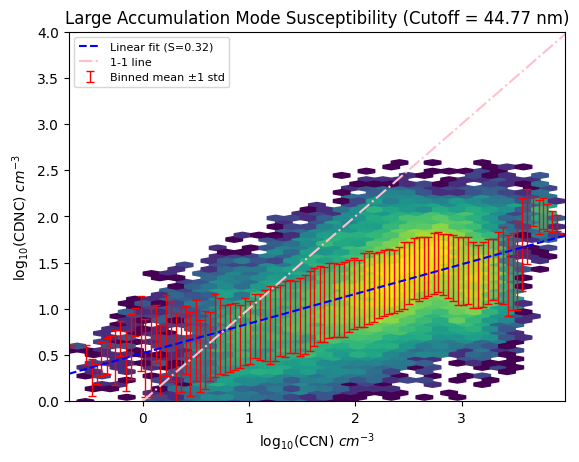

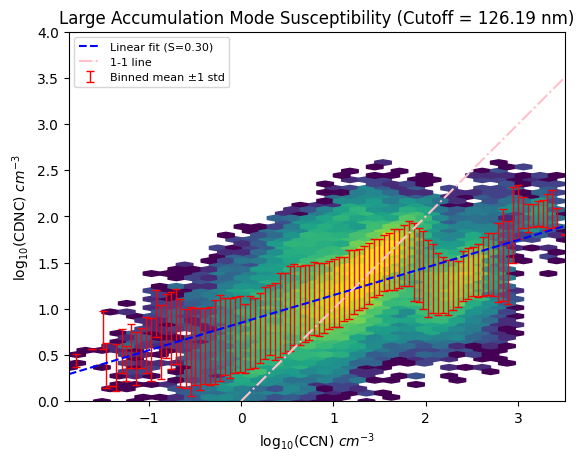

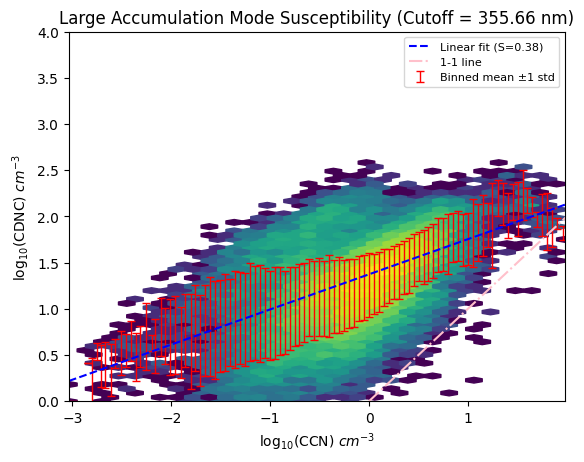

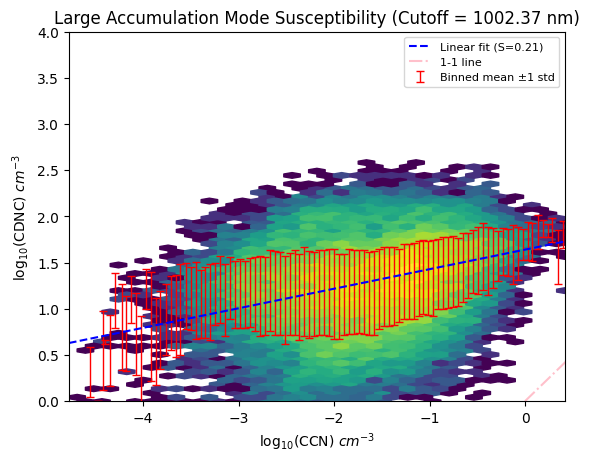

In [89]:
rad = [20,30,40,50,60]
def doublesegmentplot(r):
    
    log_x = np.log10(Pairs_acc['CCN'].isel(radius=r))
    log_y = np.log10(Pairs_acc['CDNC'])
    Log_bins = np.linspace(log_x.min().values, log_x.max().values, 101)
    # Binned means
    x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
    y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
    x_err  = log_x.groupby_bins(log_x, Log_bins).std()
    y_err  = log_y.groupby_bins(log_x, Log_bins).std()
    
    fig, ax = plt.subplots()
    ax.hexbin(log_x, log_y, bins='log', gridsize=[30, 30])
    ax.errorbar(
        x_mean, y_mean, yerr=y_err,
        fmt=' ', capsize=3, elinewidth=1,
        label='Binned mean ±1 std', ecolor='r',
    )
    
    # --- Regression lines ---
    slope     = BigAccReg_ds["slope"].isel(radius=r).sel(updraft_q = 'Total').values
    intercept = BigAccReg_ds["intercept"].isel(radius=r).sel(updraft_q = 'Total').values

    
    # Overall linear fit
    x_line = np.linspace(log_x.min().values, log_x.max().values, 100)
    ax.plot(x_line, slope * x_line + intercept, 'b--', linewidth=1.5,
            label=f'Linear fit (S={slope:.2f})')
    
    # Formatting
    ax.set_xlim([log_x.min().values, log_x.max().values])
    ax.set_ylim([0, 4])
    ax.plot([0, 4], [0, 4], '-.', c = 'pink', label = '1-1 line')
    ax.set_xlabel('log$_{10}$(CCN) $cm^{-3}$')
    ax.set_ylabel('log$_{10}$(CDNC) $cm^{-3}$')
    ax.legend(fontsize=8)
    ax.set_title(f'Large Accumulation Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
    plt.show()
for r in rad:
    doublesegmentplot(r)
rad = [20,30,40,50,60]
def doublesegmentplot(r):
    
    log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
    log_y = np.log10(Pairs_ait['CDNC'])
    Log_bins = np.linspace(log_x.min().values, log_x.max().values, 101)
    # Binned means
    x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
    y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
    x_err  = log_x.groupby_bins(log_x, Log_bins).std()
    y_err  = log_y.groupby_bins(log_x, Log_bins).std()
    
    fig, ax = plt.subplots()
    ax.hexbin(log_x, log_y, bins='log', gridsize=[30, 30])
    ax.errorbar(
        x_mean, y_mean, yerr=y_err,
        fmt=' ', capsize=3, elinewidth=1,
        label='Binned mean ±1 std', ecolor='r',
    )
    
    # --- Regression lines ---
    slope     = BigAitReg_ds["slope"].isel(radius=r).sel(updraft_q = 'Total').values
    intercept = BigAitReg_ds["intercept"].isel(radius=r).sel(updraft_q = 'Total').values

    
    # Overall linear fit
    x_line = np.linspace(log_x.min().values, log_x.max().values, 100)
    ax.plot(x_line, slope * x_line + intercept, 'b--', linewidth=1.5,
            label=f'Linear fit (S={slope:.2f})')
    
    # Formatting
    ax.set_xlim([log_x.min().values, log_x.max().values])
    ax.set_ylim([0, 4])
    ax.plot([0, 4], [0, 4], '-.', c = 'pink', label = '1-1 line')
    ax.set_xlabel('log$_{10}$(CCN) $cm^{-3}$')
    ax.set_ylabel('log$_{10}$(CDNC) $cm^{-3}$')
    ax.legend(fontsize=8)
    ax.set_title(f'Large Accumulation Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
    plt.show()
for r in rad:
    doublesegmentplot(r)

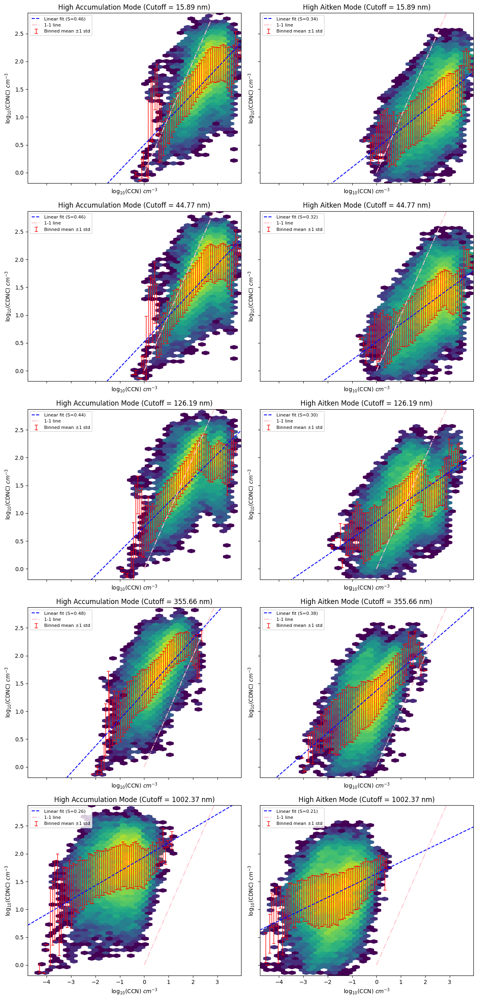

In [90]:
rad = [20, 30, 40, 50, 60]

# Compute global x and y limits across all data
all_log_x = np.concatenate([
    np.log10(Pairs_acc['CCN'].isel(radius=r).values.flatten()) for r in rad
] + [
    np.log10(Pairs_ait['CCN'].isel(radius=r).values.flatten()) for r in rad
])
all_log_y = np.concatenate([
    np.log10(Pairs_acc['CDNC'].values.flatten()),
    np.log10(Pairs_ait['CDNC'].values.flatten())
])
all_log_x = all_log_x[np.isfinite(all_log_x)]
all_log_y = all_log_y[np.isfinite(all_log_y)]
x_min, x_max = all_log_x.min(), all_log_x.max()
y_min, y_max = all_log_y.min(), all_log_y.max()

fig, axes = plt.subplots(len(rad), 2, figsize=[12, 5 * len(rad)], sharex=True, sharey=True)

for row, r in enumerate(rad):
    for col, (Pairs, RegDs, mode_label) in enumerate([
        (Pairs_acc, BigAccReg_ds, 'Accumulation'),
        (Pairs_ait, BigAitReg_ds, 'Aitken')
    ]):
        ax = axes[row, col]

        log_x = np.log10(Pairs['CCN'].isel(radius=r))
        log_y = np.log10(Pairs['CDNC'])
        Log_bins = np.linspace(x_min, x_max, 101)

        x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
        y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
        y_err  = log_y.groupby_bins(log_x, Log_bins).std()

        ax.hexbin(log_x, log_y, bins='log', gridsize=[30, 30],
                  extent=[x_min, x_max, y_min, y_max])
        ax.errorbar(x_mean, y_mean, yerr=y_err,
                    fmt=' ', capsize=3, elinewidth=1,
                    label='Binned mean ±1 std', ecolor='r')

        slope     = RegDs["slope"].isel(radius=r).sel(updraft_q = 'Total').values
        intercept = RegDs["intercept"].isel(radius=r).sel(updraft_q = 'Total').values
        x_line = np.linspace(x_min, x_max, 100)
        ax.plot(x_line, slope * x_line + intercept, 'b--', linewidth=1.5,
                label=f'Linear fit (S={slope:.2f})')


        ax.plot([0, 4], [0, 4], '-.', c='pink', label='1-1 line')
        ax.set_xlim([x_min, x_max])  # re-apply after plot
        ax.set_ylim([y_min, y_max])  # re-apply after plot
        
        ax.set_xlabel('log$_{10}$(CCN) $cm^{-3}$')
        ax.set_ylabel('log$_{10}$(CDNC) $cm^{-3}$')
        ax.legend(fontsize=8)
        ax.set_title(f'High {mode_label} Mode (Cutoff = {radii[r]*2:.2f} nm)')

plt.tight_layout()
plt.show()

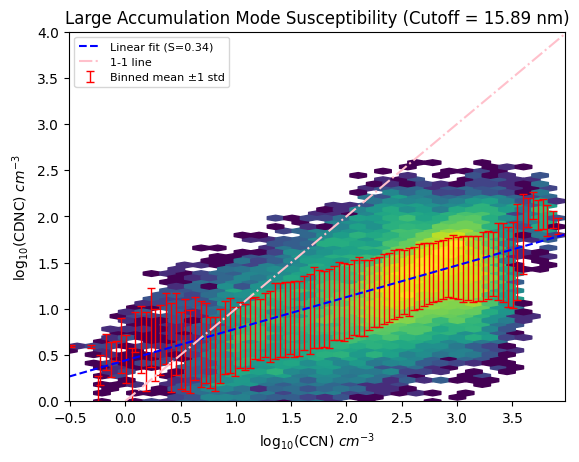

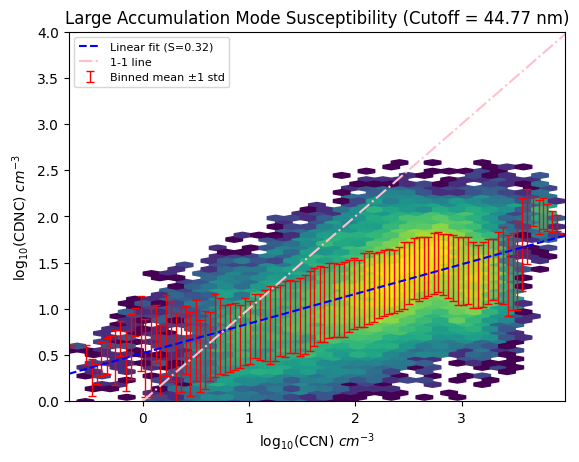

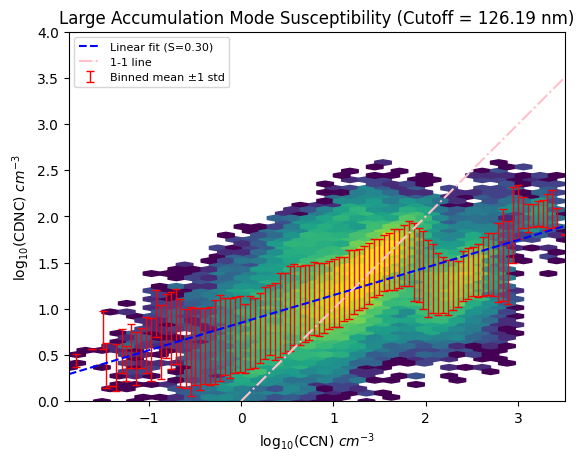

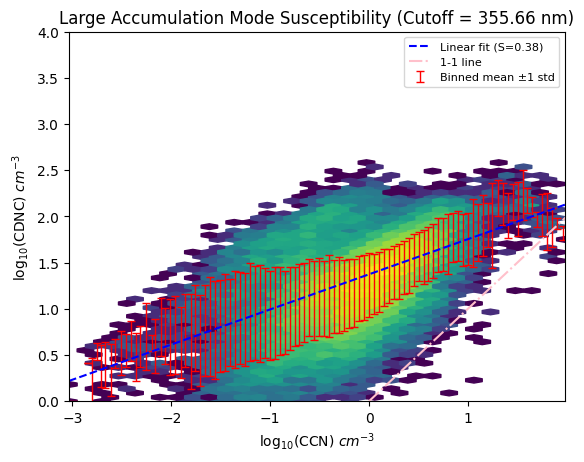

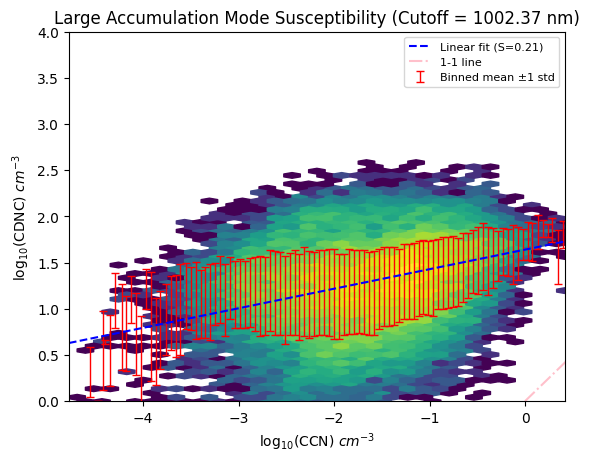

In [91]:
rad = [20,30,40,50,60]
def doublesegmentplot(r):
    
    log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
    log_y = np.log10(Pairs_ait['CDNC'])
    Log_bins = np.linspace(log_x.min().values, log_x.max().values, 101)
    # Binned means
    x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
    y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
    x_err  = log_x.groupby_bins(log_x, Log_bins).std()
    y_err  = log_y.groupby_bins(log_x, Log_bins).std()
    
    fig, ax = plt.subplots()
    ax.hexbin(log_x, log_y, bins='log', gridsize=[30, 30])
    ax.errorbar(
        x_mean, y_mean, yerr=y_err,
        fmt=' ', capsize=3, elinewidth=1,
        label='Binned mean ±1 std', ecolor='r',
    )
    
    # --- Regression lines ---
    slope     = BigAitReg_ds["slope"].isel(radius=r).sel(updraft_q = 'Total').values
    intercept = BigAitReg_ds["intercept"].isel(radius=r).sel(updraft_q = 'Total').values

    
    # Overall linear fit
    x_line = np.linspace(log_x.min().values, log_x.max().values, 100)
    ax.plot(x_line, slope * x_line + intercept, 'b--', linewidth=1.5,
            label=f'Linear fit (S={slope:.2f})')
    
    # Formatting
    ax.set_xlim([log_x.min().values, log_x.max().values])
    ax.set_ylim([0, 4])
    ax.plot([0, 4], [0, 4], '-.', c = 'pink', label = '1-1 line')
    ax.set_xlabel('log$_{10}$(CCN) $cm^{-3}$')
    ax.set_ylabel('log$_{10}$(CDNC) $cm^{-3}$')
    ax.legend(fontsize=8)
    ax.set_title(f'Large Accumulation Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
    plt.show()
for r in rad:
    doublesegmentplot(r)

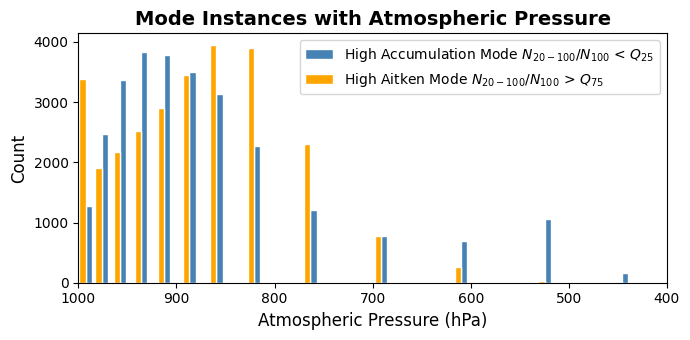

In [92]:


# Count occurrences


# Align both series to the same index
acc_count = acc_count.reindex(all_levels, fill_value=0)
ait_count = ait_count.reindex(all_levels, fill_value=0)

# Width based on minimum spacing between pressure levels
min_spacing = np.diff(np.sort(all_levels)).min()
width = min_spacing * 0.4

fig, ax = plt.subplots(figsize=(7, 3.5))
bars1 = ax.bar(all_levels - width/2, acc_count.values, width=width,
               color='steelblue', edgecolor='white', label='High Accumulation Mode $N_{20-100}/N_{100}$ < $Q_{25}$')
bars2 = ax.bar(all_levels + width/2, ait_count.values, width=width,
               color='orange', edgecolor='white', label='High Aitken Mode $N_{20-100}/N_{100}$ > $Q_{75}$')
ax.set_xlim([1000,400])
ax.set_xlabel('Atmospheric Pressure (hPa)', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.set_title('Mode Instances with Atmospheric Pressure', fontsize=14, fontweight='bold')
ax.legend()
plt.tight_layout()
plt.show()

(-0.2, 1.0)

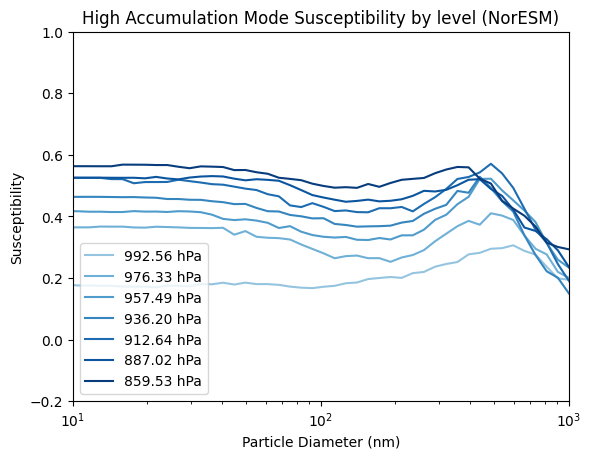

In [93]:
import matplotlib.cm as cm

n = 7  # number of levels (1 to 7)
blues = cm.Blues(np.linspace(0.4, 0.95, n))  # 0.4 avoids too-light shades

for i, idx in enumerate(range(1, 8)):
    lev_val = BigAccReg_lev_ds.lev[-idx].values
    plt.plot(
        BigAccReg_lev_ds.radius * 2,
        BigAccReg_lev_ds.slope.isel(lev=-idx),
        color=blues[i],
        label=f'{lev_val:.2f} hPa'
    )
plt.xscale('log')
plt.legend()
plt.xlabel('Particle Diameter (nm)')
plt.ylabel('Susceptibility')
plt.title('High Accumulation Mode Susceptibility by level (NorESM)')
plt.xlim([10,1000])
plt.ylim([-0.2,1])

(-0.2, 1.0)

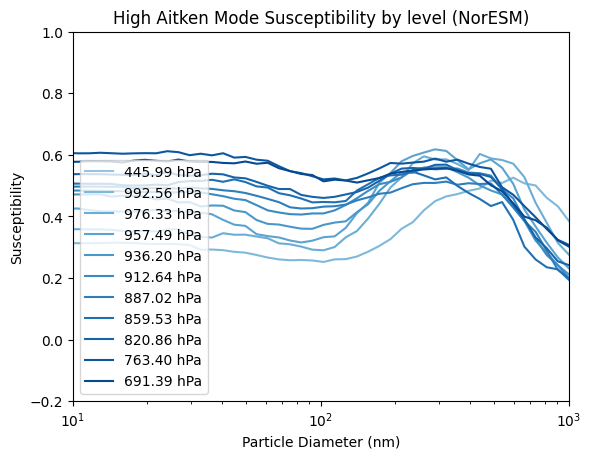

In [94]:
import matplotlib.cm as cm

n = 12  # number of levels (1 to 7)
blues = cm.Blues(np.linspace(0.4, 0.95, n))  # 0.4 avoids too-light shades

for i, idx in enumerate(range(11)):
    lev_val = BigAitReg_lev_ds.lev[-idx].values
    plt.plot(
        BigAitReg_lev_ds.radius * 2,
        BigAitReg_lev_ds.slope.isel(lev=-idx),
        color=blues[i],
        label=f'{lev_val:.2f} hPa'
    )
plt.xscale('log')
plt.legend()
plt.xlabel('Particle Diameter (nm)')
plt.ylabel('Susceptibility')
plt.title('High Aitken Mode Susceptibility by level (NorESM)')
plt.xlim([10,1000])
plt.ylim([-0.2,1])

(-0.2, 1.0)

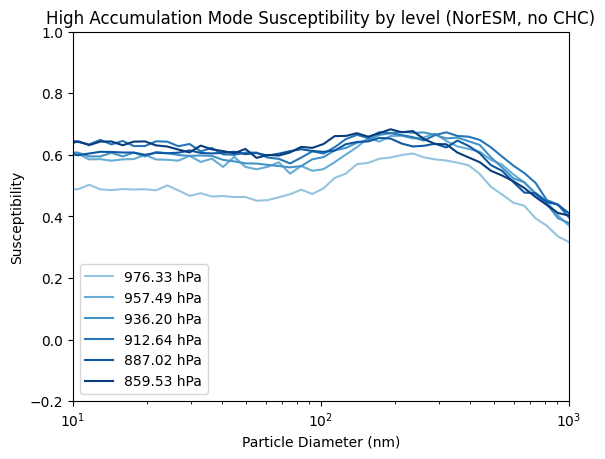

In [95]:
import matplotlib.cm as cm

n = 6  # number of levels (1 to 7)
blues = cm.Blues(np.linspace(0.4, 0.95, n))  # 0.4 avoids too-light shades

for i, idx in enumerate(range(2, 8)):
    lev_val = BigAccReg_noCHC_lev_ds.lev[-idx].values
    plt.plot(
        BigAccReg_noCHC_lev_ds.radius * 2,
        BigAccReg_noCHC_lev_ds.slope.isel(lev=-idx),
        color=blues[i],
        label=f'{lev_val:.2f} hPa'
    )
plt.xscale('log')
plt.legend()
plt.xlabel('Particle Diameter (nm)')
plt.ylabel('Susceptibility')
plt.title('High Accumulation Mode Susceptibility by level (NorESM, no CHC)')
plt.xlim([10,1000])
plt.ylim([-0.2,1])

(-0.2, 1.0)

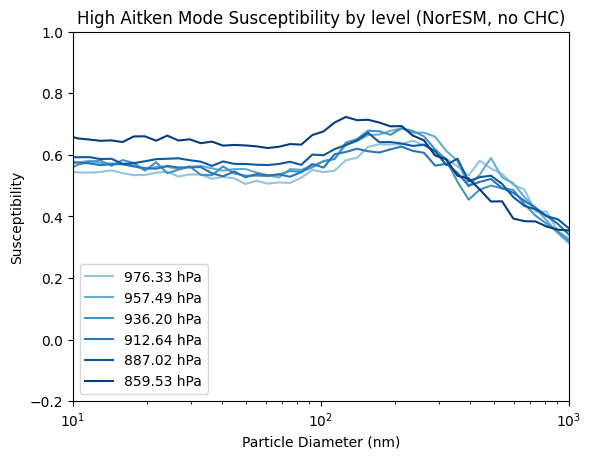

In [96]:
import matplotlib.cm as cm

n = 6  # number of levels (1 to 7)
blues = cm.Blues(np.linspace(0.4, 0.95, n))  # 0.4 avoids too-light shades

for i, idx in enumerate(range(2, 8)):
    lev_val = BigAitReg_noCHC_lev_ds.lev[-idx].values
    plt.plot(
        BigAitReg_noCHC_lev_ds.radius * 2,
        BigAitReg_noCHC_lev_ds.slope.isel(lev=-idx),
        color=blues[i],
        label=f'{lev_val:.2f} hPa'
    )
plt.xscale('log')
plt.legend()
plt.xlabel('Particle Diameter (nm)')
plt.ylabel('Susceptibility')
plt.title('High Aitken Mode Susceptibility by level (NorESM, no CHC)')
plt.xlim([10,1000])
plt.ylim([-0.2,1])

(0.1, 1.0)

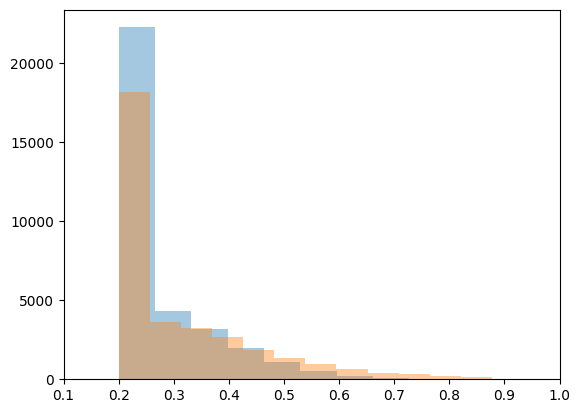

In [97]:
plt.hist(Pairs_ait.Updraft, alpha = 0.4, bins = 20)
plt.hist(Pairs_acc.Updraft, alpha = 0.4, bins = 20)
plt.xlim([0.1,1])

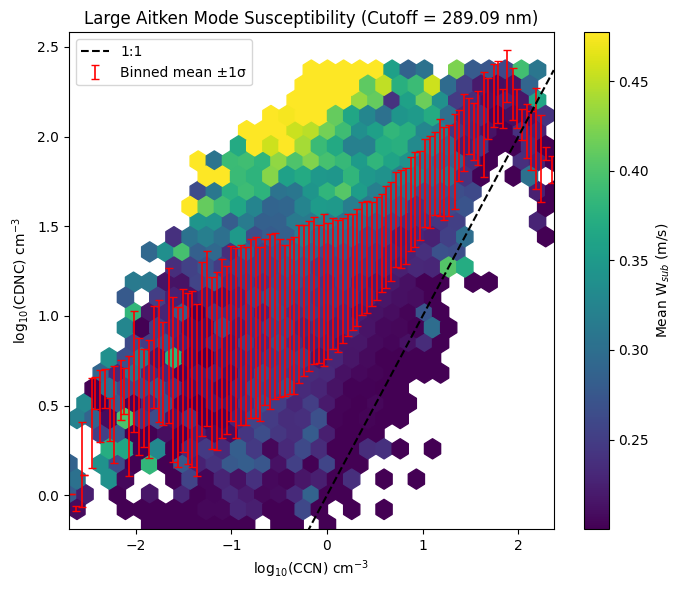

In [98]:
r = 48
wsub = Pairs_ait.Updraft.values
log_x = np.log10(Pairs_ait['CCN'].isel(radius=r))
log_y = np.log10(Pairs_ait['CDNC'])
xmin = log_x.min().values
xmax = log_x.max().values
ymin = log_y.min().values
ymax = log_y.max().values
Log_bins = np.linspace(xmin, xmax, 101)

# Binned means and stds
x_mean = log_x.groupby_bins(log_x, Log_bins).mean()
y_mean = log_y.groupby_bins(log_x, Log_bins).mean()
x_err  = log_x.groupby_bins(log_x, Log_bins).std()
y_err  = log_y.groupby_bins(log_x, Log_bins).std()

fig, ax = plt.subplots(figsize=(7, 6))

# Hexbin (must come first so errorbar renders on top)
hb = ax.hexbin(
    log_x,
    log_y,
    C=wsub,
    reduce_C_function=np.mean,
    cmap='viridis',
    gridsize=[30, 30],
    vmin=float(np.quantile(wsub, 0.05)),
    vmax=float(np.quantile(wsub, 0.95)),
    mincnt=1,
    extent=[xmin, xmax, xmin, xmax],
)
fig.colorbar(hb, ax=ax, label='Mean W$_{sub}$ (m/s)')

# Errorbar on top
ax.errorbar(
    x_mean,
    y_mean,
    yerr=y_err,
    fmt=' ',
    capsize=3,
    elinewidth=1.2,
    label='Binned mean ±1σ',
    ecolor='r',
    color='r',
)

# Reference line & formatting
ax.plot([xmin, xmax],[xmin, xmax], 'k--', label='1:1')
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
ax.set_xlabel('log$_{10}$(CCN) cm$^{-3}$')
ax.set_ylabel('log$_{10}$(CDNC) cm$^{-3}$')
ax.set_title(f'Large Aitken Mode Susceptibility (Cutoff = {radii[r]*2:.2f} nm)')
ax.legend()
plt.tight_layout()
plt.show()

/home/pech2273/.local/lib/python3.12/site-packages/matplotlib/axes/_axes.py:7096: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/pech2273/.local/lib/python3.12/site-packages/matplotlib/axes/_axes.py:7097: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


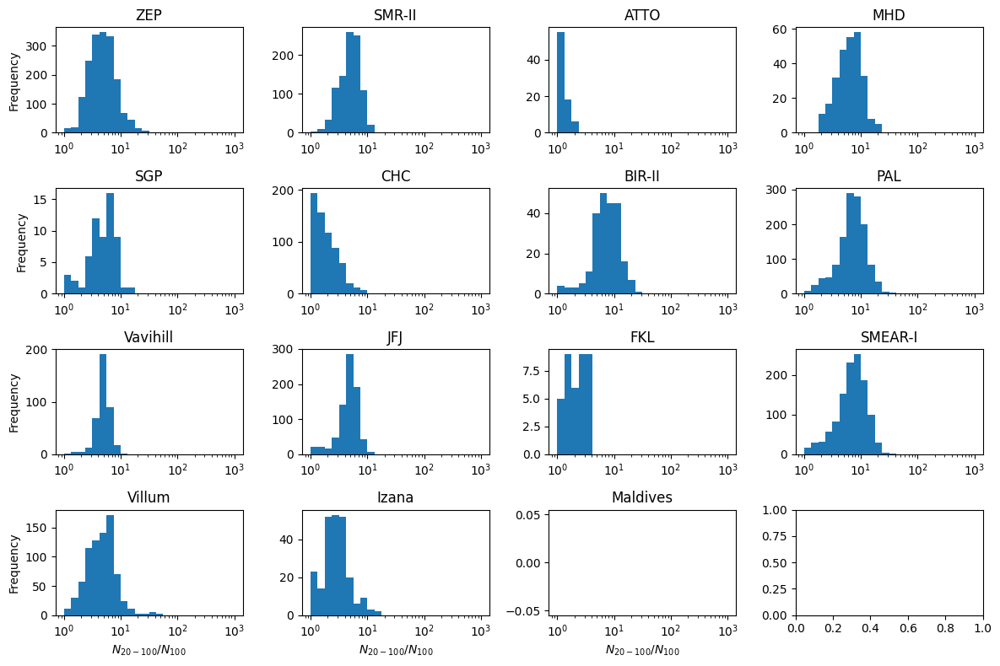

In [99]:
bins = np.logspace(0, 3, 25)
fig, axes = plt.subplots(4, 4, figsize=[12, 8])

for x, station in enumerate(AitAccRatio.station.values):
    ax = axes.flat[x]
    ax.hist(AitAccRatio.sel(station=station).isel(lev=-1), bins=bins)
    ax.set_xscale('log')
    ax.set_title(station)
    
    # Y label only on left column
    if x % 4 == 0:
        ax.set_ylabel('Frequency')
    
    # X label only on bottom row
    if x >= 12:
        ax.set_xlabel('$N_{20-100}/N_{100}$')

plt.tight_layout()
plt.show()

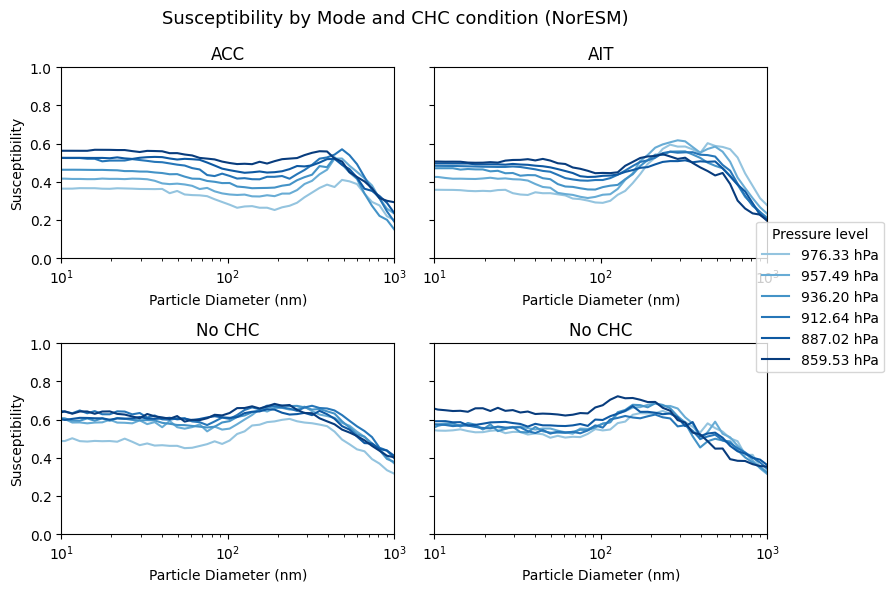

In [100]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

n = 6
blues = cm.Blues(np.linspace(0.4, 0.95, n))
lev_indices = list(range(2, 8))

fig, axes = plt.subplots(2, 2, figsize=(8, 6), sharey=True)
axes = axes.flatten()
# =========================
# Helper function
# =========================
def plot_levels(ax, ds, title, ylabel=False):
    handles = []

    x = np.asarray(ds.radius) * 2  # safe conversion

    for i, idx in enumerate(lev_indices):
        lev_val = ds.lev.isel(lev=-idx).values
        y = ds.slope.isel(lev=-idx).values

        line, = ax.plot(
            x,
            y,
            color=blues[i],
            label=f'{lev_val:.2f} hPa'
        )
        handles.append(line)

    ax.set_xscale('log')
    ax.set_xlim([10, 1000])
    ax.set_ylim([0, 1])
    ax.set_xlabel('Particle Diameter (nm)')

    if ylabel:
        ax.set_ylabel('Susceptibility')

    ax.set_title(title)

    return handles


# =========================
# LEFT COLUMN = ACC
# =========================
plot_levels(
    axes[0], BigAccReg_lev_ds,
    title='ACC', ylabel=True
)

plot_levels(
    axes[2], BigAccReg_noCHC_lev_ds,
    title='No CHC', ylabel=True
)

# =========================
# RIGHT COLUMN = AIT
# =========================
plot_levels(
    axes[1], BigAitReg_lev_ds,
    title='AIT', ylabel=False
)

plot_levels(
    axes[3], BigAitReg_noCHC_lev_ds,
    title='No CHC', ylabel=False
)


# =========================
# COMMON LEGEND
# =========================
handles = axes[0].get_lines()[:len(lev_indices)]

fig.legend(
    handles=handles,
    title='Pressure level',
    loc='center right',
    bbox_to_anchor=(1.12, 0.5)
)

# =========================
# FINAL TOUCHES
# =========================
fig.suptitle(
    'Susceptibility by Mode and CHC condition (NorESM)',
    fontsize=13
)

plt.tight_layout()
plt.show()

In [101]:
log_x = np.log10(Pairs_acc['CCN'].isel(radius=1))
log_y = np.log10(Pairs_acc['CDNC'])

print("CCN min/max:", Pairs_acc['CCN'].isel(radius=1).values.min(), Pairs_acc['CCN'].isel(radius=1).values.max())
print("log_x NaNs:", np.isnan(log_x).sum().values)
print("log_x infs:", np.isinf(log_x).sum().values)
print("log_y NaNs:", np.isnan(log_y).sum().values)
print("log_y infs:", np.isinf(log_y).sum().values)

CCN min/max: 0.4389217212603876 9052.390308996206
log_x NaNs: 0
log_x infs: 0
log_y NaNs: 0
log_y infs: 0
